# **Seller churn analysis**
### Created By :
-  Adinda Prilly Cindana
-  Dian Margaretha Nainggolan


## **Latar Belakang**
---

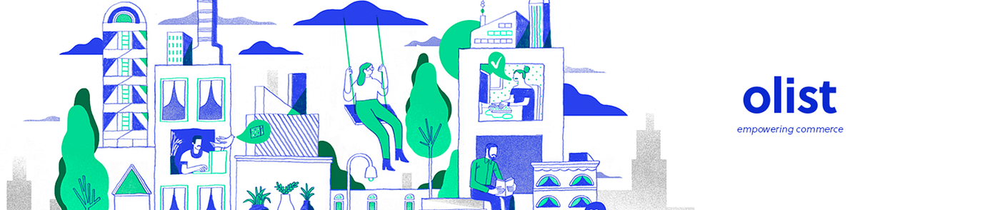

### **Background Context**

Olist adalah marketplace asal Brasil yang menghubungkan sellers dari berbagai kategori produk dengan pelanggan di seluruh negeri. **Pertumbuhan bisnis Olist sangat dipengaruhi oleh jumlah dan aktivitas seller** karena seller menyediakan pasokan barang yang menjadi kunci pengalaman pelanggan.

Namun, dalam beberapa tahun terakhir **Olist menghadapi tantangan berupa seller churn**, yaitu kondisi ketika seller berhenti berjualan atau menjadi tidak aktif setelah periode tertentu. Seller churn menyebabkan dampak bisnis yang signifikan:

- Penurunan penawaran produk di marketplace

- Penurunan potensi transaksi dan revenue

- Kenaikan biaya akuisisi seller baru

Oleh karena itu, **kemampuan mengidentifikasi seller yang berpotensi churn secara dini menjadi penting** agar perusahaan dapat melakukan strategi retensi sebelum seller benar-benar meninggalkan platform.

---

### **Stakeholders**

**Seller Support Team**, di bawah koordinasi **Head of Seller Management**, sebagai pihak yang bertanggung jawab untuk mencegah seller berisiko churn dan memastikan seller tetap aktif berjualan di platform.

---

### **Problem Statement**

1. Olist belum memiliki cara sistematis untuk **mengidentifikasi seller yang berisiko churn**.
Tanpa sistem prediksi, perusahaan hanya mengetahui seller sudah churn setelah mereka berhenti berjualan.

2. Olist **belum mengetahui faktor-faktor apa saja yang paling berpengaruh terhadap churn seller**.
Tanpa pemahaman faktor risiko, perusahaan kesulitan menentukan intervensi yang tepat bagi tiap seller.

3. Olist **belum memiliki dasar yang terukur untuk memprioritaskan seller mana yang perlu diintervensi** terlebih dahulu.
Akibatnya, seller dengan nilai bisnis tinggi tetap bisa churn karena tidak mendapat perhatian tepat waktu, sementara seller dengan risiko rendah malah mendapat intervensi tidak perlu.

---

### **Goals**

1. Membangun model prediksi yang dapat mengidentifikasi seller berisiko churn

2. Menghasilkan insight mengenai faktor-faktor yang paling berpengaruh terhadap churn seller untuk membantu strategi intervensi yang tepat.

3. Menyediakan prioritas seller untuk intervensi berdasarkan nilai probabilitas churn, sehingga tim Seller Support dapat memfokuskan upaya pada seller yang memiliki risiko paling tinggi.

---


### **Analytic Approach**

1. **Data Integration & Preprocessing**

- Menggabungkan 9 dataset Olist (orders, sellers, geolocation, payments, reviews, dan lainnya) ke dalam satu dataset terstruktur berbasis seller di Google BigQuery. Lalu, import joined table ke Python.

- Melakukan pembersihan data (missing values, duplikasi, standardisasi format) untuk memastikan kualitas data sebelum pemodelan.

2. **Feature Engineering & Seller-Level Aggregation**

- Membuat fitur baru seperti lead time pemenuhan pesanan, jarak seller–customer,dan lainnya.

- Melakukan agregasi yang output akhirnya: 1 baris = 1 seller.

3. **Churn Labeling & Exploratory Data Analysis**

- Mendefinisikan churn sebagai seller tidak melakukan transaksi > 30 hari.

- Menganalisis pola dan faktor yang berkaitan dengan churn.

4. **Modeling & Evaluation**

- Membangun model machine learning menggunakan beberapa algoritma (Logistic Regression, DecisionTree, Bagging, XGBoost, dsb.).

- Menggunakan teknik balanced sampling untuk menangani class imbalance.

- Evaluasi model menggunakan cost-based custom loss untuk meminimalkan kerugian finansial akibat churn seller.

5. **Implementation & Business Impact**

- Menghasilkan skor probabilitas churn untuk memprioritaskan seller yang perlu diintervensi terlebih dahulu.

- Mengestimasi penurunan potensi loss jika menggunakan model prediktif.

- Menyediakan rekomendasi actionable bagi tim Seller Support untuk intervensi berbasis data.
---

### **Metric Evaluation**

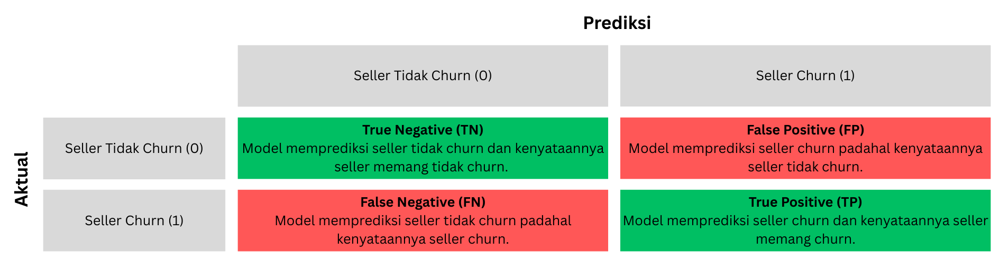

Dalam pemodelan churn seller, tidak semua kesalahan prediksi memberikan dampak finansial yang sama.
Karena itu, evaluasi model tidak cukup hanya menggunakan metrik statistik seperti Precision, Recall, atau F-Score.

Terdapat dua jenis kesalahan prediksi yang perlu diperhatikan:

- False Positive (FP)

    Model memprediksi seller akan churn, padahal seller masih aktif.
    Konsekuensinya: perusahaan mengeluarkan biaya intervensi yang sebenarnya tidak diperlukan.

- False Negative (FN)

    Model memprediksi seller tidak churn, padahal seller benar-benar churn.
    Konsekuensinya: seller tidak mendapatkan intervensi apa pun, sehingga perusahaan kehilangan seller dan perlu menanggung biaya akuisisi seller baru.

Secara bisnis, kerugian akibat FN jauh lebih besar daripada FP.

Oleh karena itu, evaluasi model dilakukan menggunakan cost-based custom loss, yang menghitung total kerugian finansial akibat kesalahan prediksi:

$$
Loss = FN \times \text{Acquisition Cost} + FP \times \text{Retention Cost}
$$

Dengan pendekatan ini, model secara langsung mengoptimalkan penurunan kerugian finansial.


## **Data Understanding**
---

**1. Sumber dan Konteks Dataset**

Dataset yang digunakan adalah **Brazilian E-Commerce Public Dataset by Olist**, sebuah dataset publik yang dirilis di Kaggle. Dataset ini berasal dari transaksi nyata yang terjadi di marketplace **Olist**, platform yang menghubungkan penjual dari berbagai wilayah Brasil dengan marketplace besar di negara tersebut.

Poin penting terkait sumber data:

* **Pembuat data**: Olist (marketplace berbasis di Brasil).
* **Sumber data**: Transaksi e-commerce yang terjadi antara tahun **2016–2018**.
* **Tujuan rilis dataset**: Mendukung riset akademik dan pengembangan model analisis terkait customer behavior, supply chain, logistik, dan performa penjualan.
* **Akses dataset**: Publik, tersedia di Kaggle.

Dataset ini terdiri dari beberapa tabel terpisah yang saling berhubungan melalui ID seperti `order_id`, `customer_id`, dan `seller_id`.


Dataset source : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce/code?datasetId=55151&sortBy=voteCount

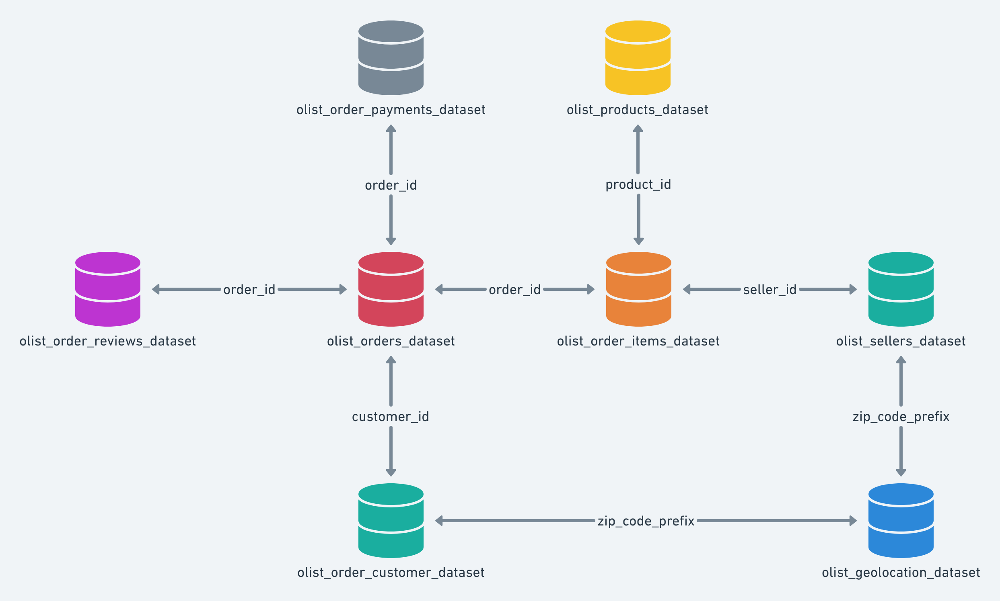

Dataset yang digunakan adalah **Brazilian E-Commerce Public Dataset by Olist**, yang terdiri dari beberapa tabel utama:

* `olist_orders_dataset`
  Informasi pesanan: status order, tanggal pembelian, tanggal approved, delivered, canceled, dan lain-lain.
* `olist_order_items_dataset`
  Detail item per order: produk apa, dijual oleh seller mana, harga, freight value.
* `olist_order_payments_dataset`
  Detil pembayaran: metode pembayaran, jumlah cicilan, nilai pembayaran.
* `olist_order_reviews_dataset`
  Review customer: skor 1-5, timestamp review, komentar.
* `olist_customers_dataset`
  Profil customer: lokasi, state, city.
* `olist_sellers_dataset`
  Profil seller: seller_id, lokasi, state, city.
* `olist_products_dataset` dan `product_category_name_translation`
  Informasi produk dan kategori produk (dengan terjemahan kategori ke bahasa Inggris).
* `olist_geolocation_dataset`
  Koordinat latitude/longitude untuk zip code prefix.

---


In [154]:
pip install category_encoders

In [155]:
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno
import shap
import joblib
import json
import pickle


from geopy.distance import geodesic
from scipy.stats import shapiro, pointbiserialr, ttest_ind
from statsmodels.stats.outliers_influence import variance_inflation_factor

import category_encoders as ce

from imblearn.under_sampling import NeighbourhoodCleaningRule
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import StratifiedKFold, cross_val_predict

from sklearn.linear_model import (
    LogisticRegression,
    SGDClassifier,
    Perceptron,
    PassiveAggressiveClassifier,
    RidgeClassifier,
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import (
    VotingClassifier,
    StackingClassifier,
    BaggingClassifier,
    RandomForestClassifier,
    AdaBoostClassifier,
    ExtraTreesClassifier,
    HistGradientBoostingClassifier,
)
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis, LinearDiscriminantAnalysis
from sklearn.metrics import (
    make_scorer,
    fbeta_score,
    precision_score,
    recall_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
)


from xgboost import XGBClassifier
pd.set_option('display.max_columns', None)

In [156]:
from google.colab import auth
auth.authenticate_user()

In [157]:
from google.cloud import bigquery

client = bigquery.Client(project="causal-fort-479706-p8")

table_id = "causal-fort-479706-p8.olist.seller_final"
seller_orders = client.list_rows(table_id).to_dataframe()
seller_orders


,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_id,order_item_id,product_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_lat,seller_lng,seller_geo_city,seller_geo_state,customer_lat,customer_lng,customer_geo_city,customer_geo_state
0,003554e2dce176b5555353e4f3555ac8,74565,goiania,GO,7e4f454abfc163899a6ef5b4d5facfb2,1,67f36b3689147d882d2b298fd0715d80,2017-12-21 07:11:03+00:00,120.00,19.38,e09646444511bcbf9141bf44ab8e8ab2,delivered,2017-12-15 06:52:25+00:00,2017-12-15 07:11:03+00:00,2017-12-15 19:45:04+00:00,2017-12-19 22:23:49+00:00,2018-01-15 00:00:00+00:00,1,credit_card,3,139.38,49ff7ea0678f5b1a9c4f9b72cf7dc4d6,5,None,None,2017-12-20 00:00:00+00:00,2017-12-21 09:05:47+00:00,None,<NA>,<NA>,<NA>,1200,105,10,20,None,5f35d9d4ba41d3e71af2bc5c1fdb166a,22765,rio de janeiro,RJ,-16.642658,-49.274686,goiânia,GO,-22.955986,-43.347079,rio de janeiro,RJ
1,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,cf101c3abd3c061ca9f78c1bbb1125af,1,4257f45f6ea58aa46885ed7ef723b6c0,2017-07-24 09:05:12+00:00,85.99,16.23,351e40989da90e70487765f6ea15d54b,delivered,2017-07-13 10:42:37+00:00,2017-07-14 09:05:12+00:00,2017-07-14 19:25:34+00:00,2017-07-21 20:42:56+00:00,2017-08-04 00:00:00+00:00,4,voucher,1,8.46,b9bee04e53b712a285795bfcec346c0c,3,None,"A loja sim , mais o site me deixou a desejar p...",2017-07-22 00:00:00+00:00,2017-08-07 20:16:08+00:00,None,<NA>,<NA>,<NA>,2300,29,13,25,None,74adf920dbd3d2e6e9f18acd88b2fd41,11680,ubatuba,SP,-21.757674,-48.829837,ibitinga,SP,-23.441904,-45.077753,ubatuba,SP
2,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,d21d7411b251f35ead1b210dc946ca70,1,f18333439cbbfd0ae30acf09ae09c0f0,2018-01-23 23:10:45+00:00,248.90,28.00,cff157deadf46de66ac1eb7ead76deb0,delivered,2018-01-15 22:54:08+00:00,2018-01-15 23:10:45+00:00,2018-01-16 18:42:08+00:00,2018-01-22 19:27:55+00:00,2018-02-16 00:00:00+00:00,4,voucher,1,50.00,fa79721e1fe4f7f52a52bd1dc5a5f0df,5,None,None,2018-01-23 00:00:00+00:00,2018-01-24 15:09:14+00:00,None,<NA>,<NA>,<NA>,23300,56,48,40,None,56437a026e07b2b2271b8742aee81fb9,13340,indaiatuba,SP,-21.757674,-48.829837,ibitinga,SP,-23.100290,-47.181660,indaiatuba,SP
3,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,24ceed9729a86f5e36fd61ae94183817,1,1d94d1e0c7fb2dcf2811e093d2ca303b,2018-05-10 10:15:17+00:00,179.50,133.73,cd24dfdff8d99033e3794d9b104c95d0,delivered,2018-05-03 11:13:38+00:00,2018-05-05 10:15:17+00:00,2018-05-07 16:31:00+00:00,2018-05-26 13:29:37+00:00,2018-06-04 00:00:00+00:00,9,voucher,1,39.06,17a7692937e726741c7b204e28fb2d0d,4,None,None,2018-05-27 00:00:00+00:00,2018-05-28 11:26:17+00:00,None,<NA>,<NA>,<NA>,17150,62,36,46,None,a4d4a76b47ccec27db5ea63da11debf5,41386,salvador,BA,-21.757674,-48.829837,ibitinga,SP,-12.918236,-38.434184,salvador,BA
4,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,63cb6e6a5632d2fa0406a8f3c6eae8cf,1,4257f45f6ea58aa46885ed7ef723b6c0,2017-09-27 04:06:18+00:00,83.90,16.22,8c0f9eac2698a33a01f8e7c74a6776ef,delivered,2017-09-16 16:11:59+00:00,2017-09-19 04:06:18+00:00,2017-09-19 20:37:54+00:00,2017-09-25 21:55:33+00:00,2017-10-06 00:00:00+00:00,1,boleto,1,100.12,bca6bf48477fe2bcdd227adab79be4ff,5,None,None,2017-09-26 00:00:00+00:00,2017-09-27 01:51:48+00:00,None,<NA>,<NA>,<NA>,2300,29,13,25,None,a592dac7ad955ba1dfc5d326de35d29f,12421,pindamonhangaba,SP,-21.757674,-48.829837,ibitinga,SP,-22.952472,-45.481422,pindamonhangaba,SP
...,...,...,...,...,...,...,...,...,...,...

Proses ini dimulai dengan melakukan autentikasi agar lingkungan kerja memiliki izin mengakses BigQuery. Setelah itu, dibuat koneksi ke project yang digunakan di Google Cloud. Dengan koneksi tersebut, sistem mengambil data dari tabel yang dibutuhkan dan memuatnya ke dalam DataFrame sehingga data siap diolah lebih lanjut dalam analisis.


### Merging datasets

Untuk data yang digunakan sudah di merge di querry. Namun, bila perlu upload dan merging manual dapat menggunakan kode berikut.

In [158]:
# # Load all datasets
# sellers = pd.read_csv("olist_sellers_dataset.csv")
# orders = pd.read_csv("olist_orders_dataset.csv")
# order_items = pd.read_csv("olist_order_items_dataset.csv")
# order_payments = pd.read_csv("olist_order_payments_dataset.csv")
# order_reviews = pd.read_csv("olist_order_reviews_dataset.csv")
# products = pd.read_csv("olist_products_dataset.csv")
# customers = pd.read_csv("olist_customers_dataset.csv")
# geolocation = pd.read_csv("olist_geolocation_dataset.csv")
# category_translation = pd.read_csv("product_category_name_translation.csv")

In [159]:
# # 1. Gabungkan semua tabel utama jadi seller_orders
# seller_orders = (
#     sellers
#     .merge(order_items, on="seller_id", how="left")
#     .merge(orders, on="order_id", how="left")
#     .merge(order_payments, on="order_id", how="left")
#     .merge(order_reviews, on="order_id", how="left")
#     .merge(products, on="product_id", how="left")
#     .merge(category_translation, on="product_category_name", how="left")
#     .merge(customers, on="customer_id", how="left")
# )

# # 2. Satu kali bikin geo_slim dari geolocation
# geo_slim = (
#     geolocation
#     .groupby('geolocation_zip_code_prefix')
#     .agg(
#         geolocation_lat=('geolocation_lat', 'median'),
#         geolocation_lng=('geolocation_lng', 'median'),
#         geolocation_city=('geolocation_city', lambda x: x.mode().iloc[0]),
#         geolocation_state=('geolocation_state', lambda x: x.mode().iloc[0])
#     )
#     .reset_index()
# )

# # 3. Helper function supaya rename seller / customer tidak copy-paste
# def make_geo(geo_slim, zip_col_name, prefix):
#     return geo_slim.rename(columns={
#         "geolocation_zip_code_prefix": zip_col_name,
#         "geolocation_lat": f"{prefix}_lat",
#         "geolocation_lng": f"{prefix}_lng",
#         "geolocation_city": f"{prefix}_geo_city",
#         "geolocation_state": f"{prefix}_geo_state",
#     })

# geo_seller = make_geo(geo_slim, "seller_zip_code_prefix", "seller")
# geo_customer = make_geo(geo_slim, "customer_zip_code_prefix", "customer")

# # 4. Merge koordinat seller dan customer ke seller_orders
# seller_orders = (
#     seller_orders
#     .merge(geo_seller, on="seller_zip_code_prefix", how="left")
#     .merge(geo_customer, on="customer_zip_code_prefix", how="left")
# )


Semua tabel utama digabung menjadi satu tabel besar bernama `seller_orders` yang berisi informasi lengkap mulai dari penjual, pesanan, item, pembayaran, ulasan, produk, kategori, hingga pelanggan. Lalu, dari tabel geolocation dibuat ringkasan `geo_slim` per prefix kode pos dengan mengambil median koordinat serta kota dan provinsi yang paling sering muncul, sehingga lokasi jadi lebih rapih. Setelah itu dibuat fungsi `make_geo` untuk menyalin struktur `geo_slim` dan mengganti nama kolom agar bisa dipakai terpisah untuk seller dan customer tanpa tulis ulang kode. Terakhir, koordinat dan info lokasi penjual (`geo_seller`) dan pelanggan (`geo_customer`) digabungkan ke `seller_orders`, sehingga setiap transaksi kini punya informasi posisi geografis kedua belah pihak.


In [160]:
seller_orders

,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_id,order_item_id,product_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_lat,seller_lng,seller_geo_city,seller_geo_state,customer_lat,customer_lng,customer_geo_city,customer_geo_state
0,003554e2dce176b5555353e4f3555ac8,74565,goiania,GO,7e4f454abfc163899a6ef5b4d5facfb2,1,67f36b3689147d882d2b298fd0715d80,2017-12-21 07:11:03+00:00,120.00,19.38,e09646444511bcbf9141bf44ab8e8ab2,delivered,2017-12-15 06:52:25+00:00,2017-12-15 07:11:03+00:00,2017-12-15 19:45:04+00:00,2017-12-19 22:23:49+00:00,2018-01-15 00:00:00+00:00,1,credit_card,3,139.38,49ff7ea0678f5b1a9c4f9b72cf7dc4d6,5,None,None,2017-12-20 00:00:00+00:00,2017-12-21 09:05:47+00:00,None,<NA>,<NA>,<NA>,1200,105,10,20,None,5f35d9d4ba41d3e71af2bc5c1fdb166a,22765,rio de janeiro,RJ,-16.642658,-49.274686,goiânia,GO,-22.955986,-43.347079,rio de janeiro,RJ
1,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,cf101c3abd3c061ca9f78c1bbb1125af,1,4257f45f6ea58aa46885ed7ef723b6c0,2017-07-24 09:05:12+00:00,85.99,16.23,351e40989da90e70487765f6ea15d54b,delivered,2017-07-13 10:42:37+00:00,2017-07-14 09:05:12+00:00,2017-07-14 19:25:34+00:00,2017-07-21 20:42:56+00:00,2017-08-04 00:00:00+00:00,4,voucher,1,8.46,b9bee04e53b712a285795bfcec346c0c,3,None,"A loja sim , mais o site me deixou a desejar p...",2017-07-22 00:00:00+00:00,2017-08-07 20:16:08+00:00,None,<NA>,<NA>,<NA>,2300,29,13,25,None,74adf920dbd3d2e6e9f18acd88b2fd41,11680,ubatuba,SP,-21.757674,-48.829837,ibitinga,SP,-23.441904,-45.077753,ubatuba,SP
2,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,d21d7411b251f35ead1b210dc946ca70,1,f18333439cbbfd0ae30acf09ae09c0f0,2018-01-23 23:10:45+00:00,248.90,28.00,cff157deadf46de66ac1eb7ead76deb0,delivered,2018-01-15 22:54:08+00:00,2018-01-15 23:10:45+00:00,2018-01-16 18:42:08+00:00,2018-01-22 19:27:55+00:00,2018-02-16 00:00:00+00:00,4,voucher,1,50.00,fa79721e1fe4f7f52a52bd1dc5a5f0df,5,None,None,2018-01-23 00:00:00+00:00,2018-01-24 15:09:14+00:00,None,<NA>,<NA>,<NA>,23300,56,48,40,None,56437a026e07b2b2271b8742aee81fb9,13340,indaiatuba,SP,-21.757674,-48.829837,ibitinga,SP,-23.100290,-47.181660,indaiatuba,SP
3,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,24ceed9729a86f5e36fd61ae94183817,1,1d94d1e0c7fb2dcf2811e093d2ca303b,2018-05-10 10:15:17+00:00,179.50,133.73,cd24dfdff8d99033e3794d9b104c95d0,delivered,2018-05-03 11:13:38+00:00,2018-05-05 10:15:17+00:00,2018-05-07 16:31:00+00:00,2018-05-26 13:29:37+00:00,2018-06-04 00:00:00+00:00,9,voucher,1,39.06,17a7692937e726741c7b204e28fb2d0d,4,None,None,2018-05-27 00:00:00+00:00,2018-05-28 11:26:17+00:00,None,<NA>,<NA>,<NA>,17150,62,36,46,None,a4d4a76b47ccec27db5ea63da11debf5,41386,salvador,BA,-21.757674,-48.829837,ibitinga,SP,-12.918236,-38.434184,salvador,BA
4,004c9cd9d87a3c30c522c48c4fc07416,14940,ibitinga,SP,63cb6e6a5632d2fa0406a8f3c6eae8cf,1,4257f45f6ea58aa46885ed7ef723b6c0,2017-09-27 04:06:18+00:00,83.90,16.22,8c0f9eac2698a33a01f8e7c74a6776ef,delivered,2017-09-16 16:11:59+00:00,2017-09-19 04:06:18+00:00,2017-09-19 20:37:54+00:00,2017-09-25 21:55:33+00:00,2017-10-06 00:00:00+00:00,1,boleto,1,100.12,bca6bf48477fe2bcdd227adab79be4ff,5,None,None,2017-09-26 00:00:00+00:00,2017-09-27 01:51:48+00:00,None,<NA>,<NA>,<NA>,2300,29,13,25,None,a592dac7ad955ba1dfc5d326de35d29f,12421,pindamonhangaba,SP,-21.757674,-48.829837,ibitinga,SP,-22.952472,-45.481422,pindamonhangaba,SP
...,...,...,...,...,...,...,...,...,...,...

In [161]:
seller_orders.describe(include='number')

,seller_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,seller_lat,seller_lng,customer_lat,customer_lng
count,118310.0,118310.0,118310.000000,118310.000000,118307.0,118307.0,118307.000000,117332.0,116601.0,116601.0,116601.0,118290.0,118290.0,118290.0,118290.0,118310.0,118045.000000,118045.000000,117993.000000,117993.000000
mean,24442.410413,1.196543,120.646603,20.032387,1.094069,2.943317,172.575102,4.03139,48.767498,785.967822,2.205161,2112.25074,30.265145,16.619706,23.074799,35050.658693,-22.796080,-47.238912,-21.230449,-46.190340
std,27573.004511,0.699489,184.109691,15.836850,0.728579,2.777877,267.110727,1.387994,10.03354,652.584121,1.717452,3786.695111,16.189367,13.453584,11.749139,29824.585904,2.690447,2.339986,5.566130,4.047781
min,1001.0,1.0,0.850000,0.000000,1.0,0.0,0.000000,1.0,5.0,4.0,1.0,0.0,7.0,2.0,6.0,1003.0,-32.074657,-67.811160,-33.690989,-98.484121
25%,6429.0,1.0,39.900000,13.080000,1.0,1.0,60.850000,4.0,42.0,346.0,1.0,300.0,18.0,8.0,15.0,11310.0,-23.606858,-48.829837,-23.589854,-48.097448
50%,13660.0,1.0,74.900000,16.280000,1.0,2.0,108.200000,5.0,52.0,600.0,1.0,700.0,25.0,13.0,20.0,24275.5,-23.422861,-46.754218,-22.929575,-46.631406
75%,27972.0,1.0,134.900000,21.180000,1.0,4.0,189.260000,5.0,57.0,983.0,3.0,1800.0,38.0,20.0,30.0,58636.25,-21.757674,-46.520229,-20.187285,-43.604957
max,99730.0,21.0,6735.000000,409.680000,29.0,24.0,13664.080000,5.0,76.0,3992.0,20.0,40425.0,105.0,105.0,118.0,99990.0,-2.498944,-34.855123,42.184003,-8.577855


In [162]:
seller_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118310 entries, 0 to 118309
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype              
---  ------                         --------------   -----              
 0   seller_id                      118310 non-null  object             
 1   seller_zip_code_prefix         118310 non-null  Int64              
 2   seller_city                    118310 non-null  object             
 3   seller_state                   118310 non-null  object             
 4   order_id                       118310 non-null  object             
 5   order_item_id                  118310 non-null  Int64              
 6   product_id                     118310 non-null  object             
 7   shipping_limit_date            118310 non-null  datetime64[us, UTC]
 8   price                          118310 non-null  float64            
 9   freight_value                  118310 non-null  float64            
 10  customer

### Attribute Information

| Attribute                       | Data Type (from DataFrame) | Description                       |
| ------------------------------- | -------------------------- | --------------------------------- |
| `seller_id`                     | object                     | ID unik seller                    |
| `seller_zip_code_prefix`        | int64                      | Kode pos awal seller              |
| `seller_city`                   | object                     | Kota asal seller                  |
| `seller_state`                  | object                     | Provinsi asal seller              |
| `order_id`                      | object                     | ID unik pesanan                   |
| `order_item_id`                 | int64                      | Nomor item dalam satu order       |
| `product_id`                    | object                     | ID unik produk                    |
| `shipping_limit_date`           | object                     | Deadline pengiriman dari seller   |
| `price`                         | float64                    | Harga produk                      |
| `freight_value`                 | float64                    | Biaya pengiriman                  |
| `customer_id`                   | object                     | ID unik customer dalam transaksi  |
| `order_status`                  | object                     | Status pesanan                    |
| `order_purchase_timestamp`      | object                     | Waktu pesanan dibuat              |
| `order_approved_at`             | object                     | Waktu pesanan disetujui           |
| `order_delivered_carrier_date`  | object                     | Waktu barang diterima kurir       |
| `order_delivered_customer_date` | object                     | Waktu barang diterima customer    |
| `order_estimated_delivery_date` | object                     | Estimasi pengiriman selesai       |
| `payment_sequential`            | float64                    | Urutan pembayaran                 |
| `payment_type`                  | object                     | Jenis metode pembayaran           |
| `payment_installments`          | float64                    | Jumlah cicilan                    |
| `payment_value`                 | float64                    | Total nilai pembayaran            |
| `review_id`                     | object                     | ID review                         |
| `review_score`                  | float64                    | Rating review                     |
| `review_comment_title`          | object                     | Judul komentar review             |
| `review_comment_message`        | object                     | Isi komentar review               |
| `review_creation_date`          | object                     | Waktu review dibuat               |
| `review_answer_timestamp`       | object                     | Waktu review dijawab              |
| `product_category_name`         | object                     | Kategori produk (PT)              |
| `product_name_lenght`           | float64                    | Panjang nama produk               |
| `product_description_lenght`    | float64                    | Panjang deskripsi                 |
| `product_photos_qty`            | float64                    | Jumlah foto produk                |
| `product_weight_g`              | float64                    | Berat produk (gram)               |
| `product_length_cm`             | float64                    | Panjang produk (cm)               |
| `product_height_cm`             | float64                    | Tinggi produk (cm)                |
| `product_width_cm`              | float64                    | Lebar produk (cm)                 |
| `product_category_name_english` | object                     | Kategori produk (EN)              |
| `customer_unique_id`            | object                     | ID unik customer (stabil)         |
| `customer_zip_code_prefix`      | int64                      | Kode pos awal customer            |
| `customer_city`                 | object                     | Kota customer                     |
| `customer_state`                | object                     | Provinsi customer                 |
| `seller_lat`                    | float64                    | Koordinat latitude seller         |
| `seller_lng`                    | float64                    | Koordinat longitude seller        |
| `seller_geo_city`               | object                     | Kota hasil geocoding seller       |
| `seller_geo_state`              | object                     | Provinsi hasil geocoding seller   |
| `customer_lat`                  | float64                    | Koordinat latitude customer       |
| `customer_lng`                  | float64                    | Koordinat longitude customer      |
| `customer_geo_city`             | object                     | Kota hasil geocoding customer     |
| `customer_geo_state`            | object                     | Provinsi hasil geocoding customer |


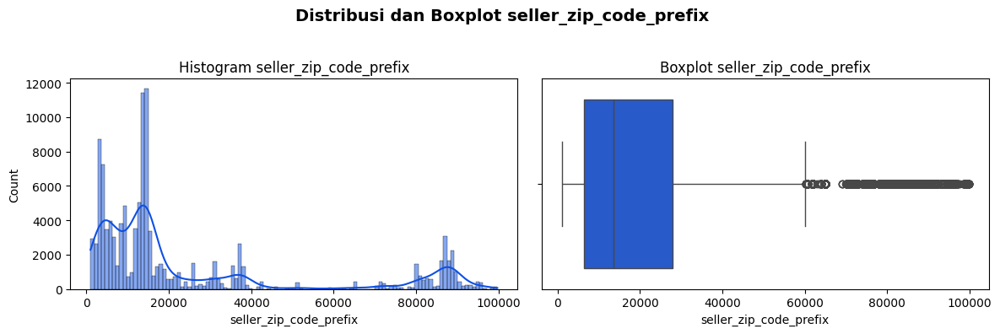

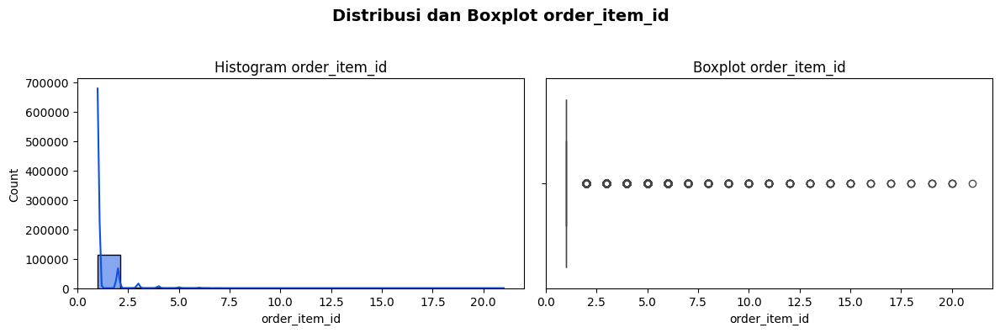

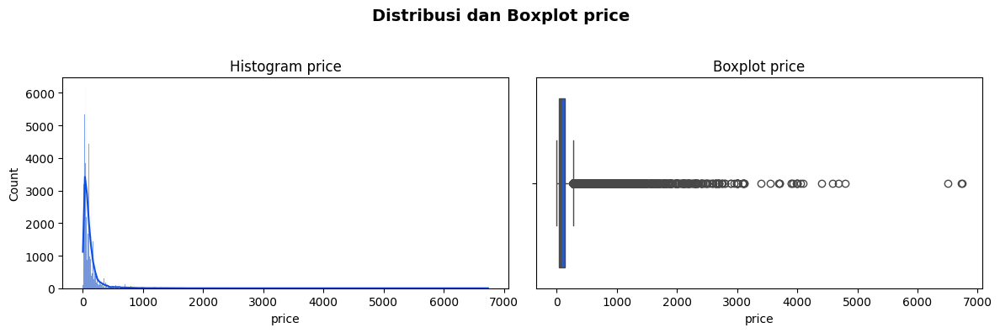

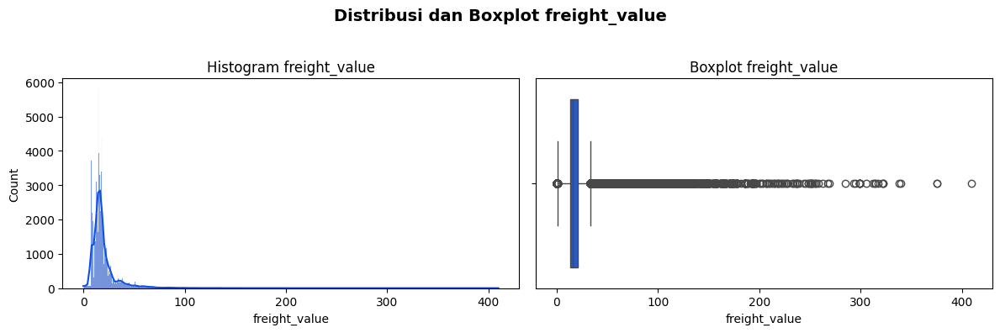

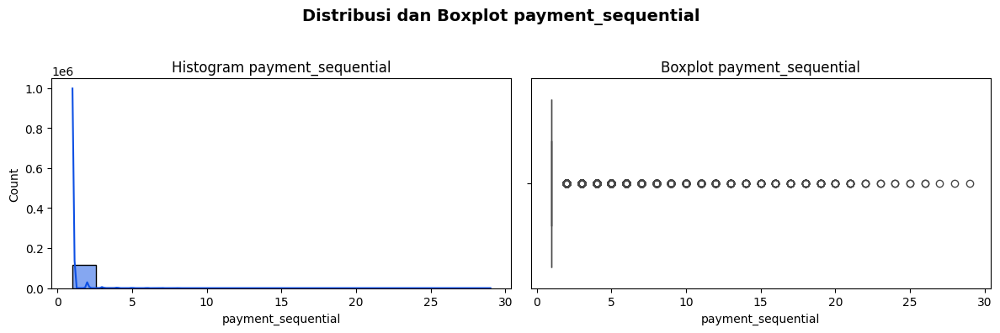

...

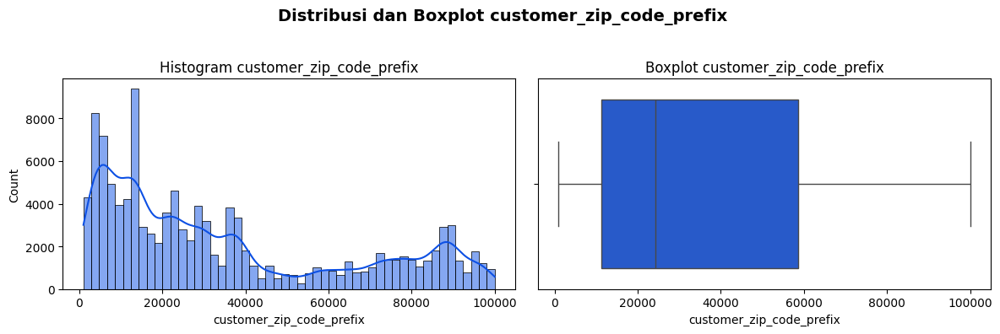

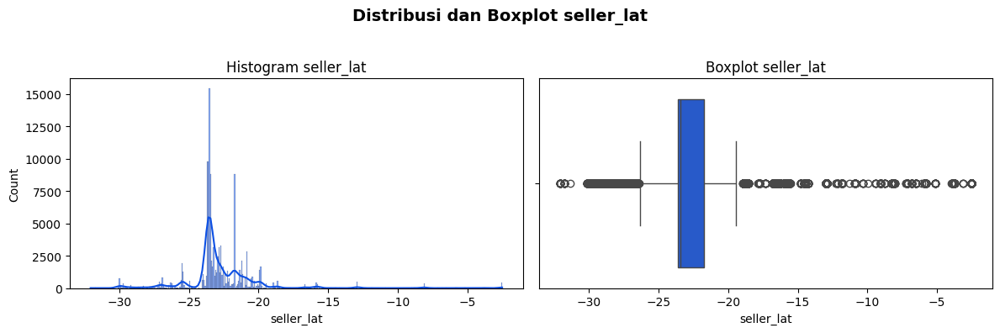

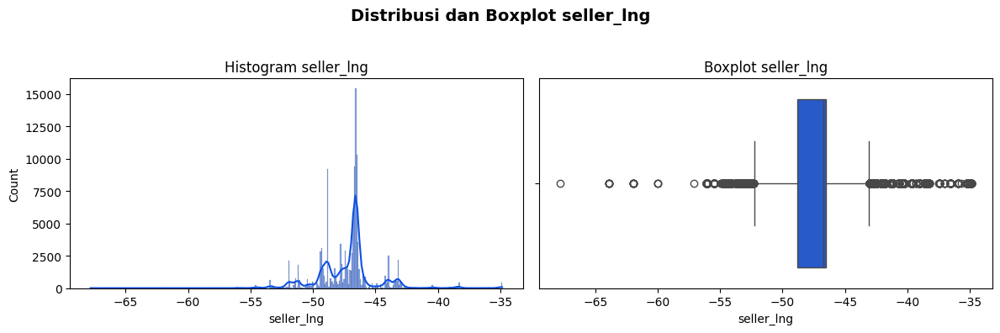

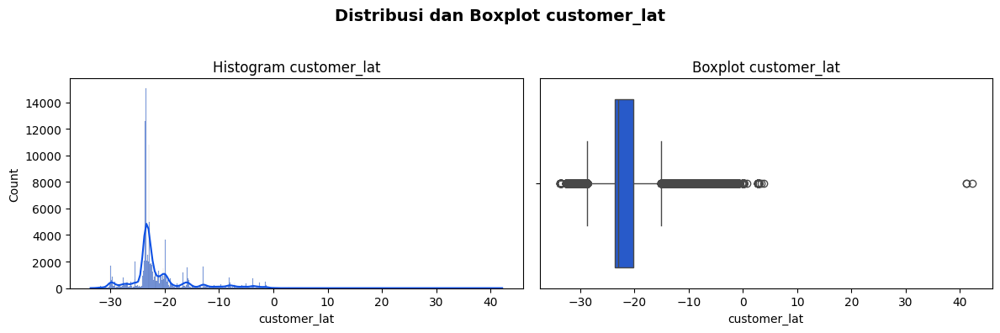

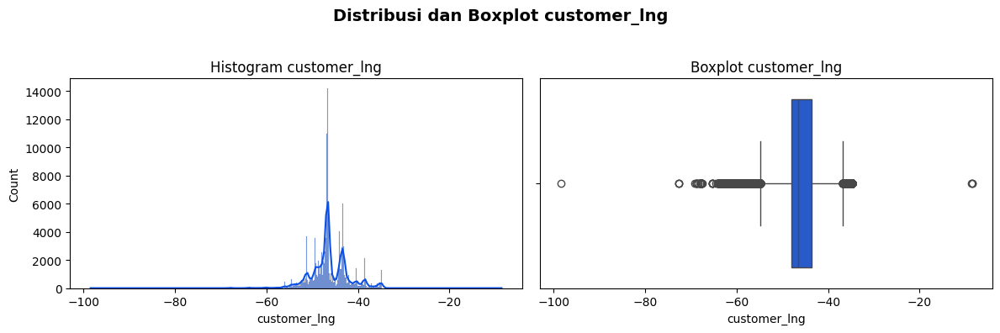

In [163]:
for i in seller_orders.select_dtypes('number'):
    plt.figure(figsize=(12,4))
    plt.suptitle(f"Distribusi dan Boxplot {i}", fontsize=14, fontweight='bold')

    plt.subplot(1,2,1)
    sns.histplot(data=seller_orders, x=i, kde=True, color="#0D50E4")
    plt.title(f"Histogram {i}")

    plt.subplot(1,2,2)
    sns.boxplot(data=seller_orders, x=i, color="#0D50E4")
    plt.title(f"Boxplot {i}")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


## **Data Preparation**
---


Pada bagian ini dilakukan tahap persiapan data sebelum digunakan untuk melatih dan menguji model serta melakukan analisis. Fokus utama langkah ini adalah penyesuaian tipe data agar sesuai dengan makna masing-masing variabel dan mempermudah proses pengolahan selanjutnya.

Langkah-langkah data preparation yang dilalui pada bagian ini adalah:

- Handling Data Type
- Handling Data Duplicates
- Handling Invalid Data
- Handling Outlier
- Normality Test
- Mencari Anomali

### Handling Data Type

In [164]:
df = seller_orders

Seluruh data dari tabel gabungan seller_orders disalin ke dalam variabel kerja df untuk memudahkan proses transformasi selanjutnya.

#### Datetime parsing

`order_delivered_customer_date` masih bertipe object. Ini harus dikonversi ke datetime.

In [165]:
cols_date = ['shipping_limit_date','order_purchase_timestamp','order_approved_at',
            'order_delivered_carrier_date','order_delivered_customer_date',
             'order_estimated_delivery_date','review_creation_date', 'review_answer_timestamp']

df[cols_date] = df[cols_date].apply(pd.to_datetime, errors='coerce')

Beberapa kolom tanggal seperti `shipping_limit_date`, `order_purchase_timestamp`, hingga `review_creation_date` dan `review_answer_timestamp` awalnya masih bertipe object. Kolom-kolom tersebut kemudian dikonversi menjadi tipe datetime menggunakan pd.to_datetime. Konversi ini penting agar operasi berbasis waktu (seperti selisih hari, filter rentang tanggal, atau agregasi per periode) dapat dilakukan dengan benar.

#### Casting Data Types Int & Float to Object

In [166]:
cols = ['seller_zip_code_prefix', 'customer_zip_code_prefix']
df[cols] = df[cols].astype('object')

Kolom `seller_zip_code_prefix` dan `customer_zip_code_prefix` diubah tipenya menjadi object. Meskipun berupa angka, kedua kolom ini merepresentasikan kode pos dan tidak digunakan dalam operasi matematis, sehingga lebih tepat diperlakukan sebagai data kategori/teks.

#### Review score treatment

`review_score` semestinya integer (1-5 star metric)

In [167]:
df['review_score'] = df['review_score'].astype('Int64')

Kolom `review_score` dikonversi ke tipe Int64 karena merepresentasikan skor diskrit dalam rentang 1-5 (metrik bintang). Penyesuaian tipe ini membantu menjaga konsistensi saat analisis statistik maupun pemodelan, terutama ketika membedakan nilai integer dengan nilai yang hilang (NaN).

In [168]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118310 entries, 0 to 118309
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype              
---  ------                         --------------   -----              
 0   seller_id                      118310 non-null  object             
 1   seller_zip_code_prefix         118310 non-null  object             
 2   seller_city                    118310 non-null  object             
 3   seller_state                   118310 non-null  object             
 4   order_id                       118310 non-null  object             
 5   order_item_id                  118310 non-null  Int64              
 6   product_id                     118310 non-null  object             
 7   shipping_limit_date            118310 non-null  datetime64[us, UTC]
 8   price                          118310 non-null  float64            
 9   freight_value                  118310 non-null  float64            
 10  customer

### Handling Data Missing  

In [169]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,seller_id,object,0,0.00,3095,"[077c5fae4bea9500e3737b16f71b9d3a, 7f35f9daf22..."
1,seller_zip_code_prefix,object,0,0.00,2246,"[15052, 12600]"
2,seller_city,object,0,0.00,611,"[caruaru, imigrante]"
3,seller_state,object,0,0.00,23,"[MS, PB]"
4,order_id,object,0,0.00,98666,"[2b745ccd6f667dcd824b9ab05352b0dc, 1b60ece83b0..."
5,order_item_id,Int64,0,0.00,21,"[13, 10]"
6,product_id,object,0,0.00,32951,"[8097e6d8de77768d9f72295263e440fa, 8c1a8cf9502..."
7,shipping_limit_date,"datetime64[us, UTC]",0,0.00,93318,"[2017-12-03T23:56:26.000000, 2018-07-16T20:15:..."
8,price,float64,0,0.00,5968,"[629.9, 87.37]"
9,freight_value,float64,0,0.00,6999,"[28.43, 89.84]"


Dataset ini hanya memiliki beberapa kolom dengan nilai hilang, dan semuanya dapat dikelompokkan berdasarkan tingkat keparahannya. Kolom `review_comment_title` memiliki null sebesar 88% dan `review_comment_message` sebesar 58%, keduanya melewati ambang 50% sehingga tidak layak di-impute dan lebih tepat untuk di-drop karena informasi yang hilang terlalu besar. Kolom lain dengan null sangat kecil—`order_approved_at`, `order_delivered_carrier_date`, `order_delivered_customer_date`, `product_category_name`, `product_name_lenght`, `product_description_lenght`, `product_photos_qty`, `product_weight_g`, `product_length_cm`, `product_height_cm`, `product_width_cm`, `product_category_name_english`, `seller_lat`, `seller_lng`, `seller_geo_city`, `seller_geo_state`, `customer_lat`, `customer_lng`, `customer_geo_city`, dan `customer_geo_state`—berada di bawah 3% sehingga aman untuk di-impute tanpa mengubah karakter distribusi.

#### Bar Plot

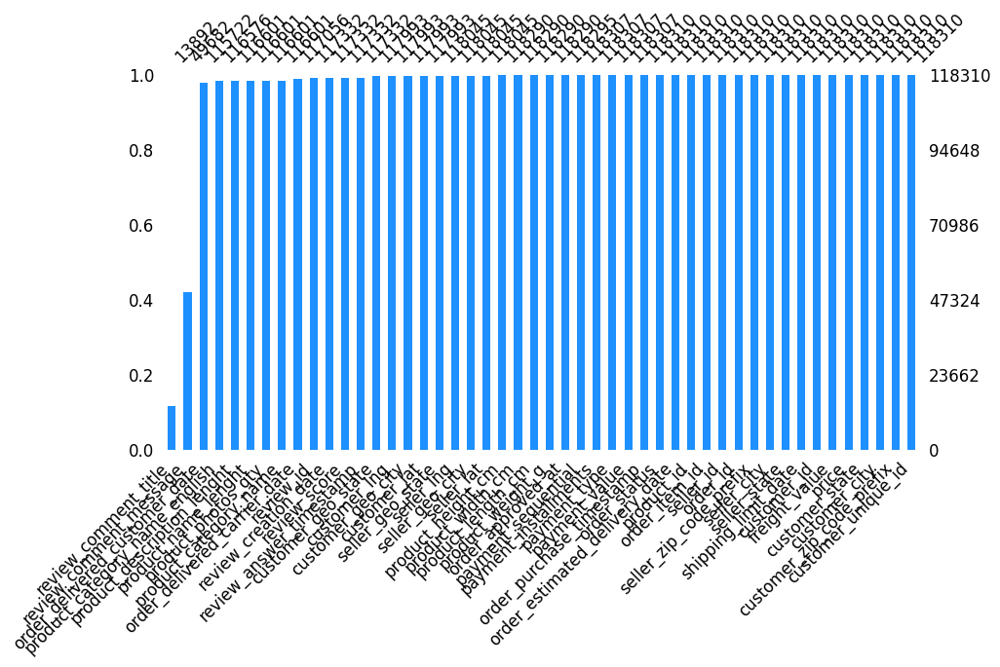

In [170]:
missingno.bar(df,color="dodgerblue", sort="ascending", figsize=(10,5), fontsize=12);

Terlihat dari Bar Plot tersebut, bahwa kolom `order_approved_at`, `order_delivered_carrier_date`, `order_delivered_customer_date`, `payment_sequential`, `payment_type`, `payment_installments`, `payment_value`, `review_id`, `review_score`, `review_comment_title`, `review_comment_message`, `review_creation_date`, `review_answer_timestamp`, `product_category_name`, `product_name_lenght`, `product_description_lenght`, `product_photos_qty`, `product_weight_g`, `product_length_cm`, `product_height_cm`, `product_width_cm`, `product_category_name_english`, `seller_lat`, `seller_lng`, `seller_geo_city`, `seller_geo_state`, `customer_lat`, `customer_lng`, `customer_geo_city`, `customer_geo_state` memiliki missing values/data yang hilang. (informasi ini sebenarnya dapat dilihat juga di tabel atas)

Kemudian berdasarkan Bar Plot tersebut juga, kolom review_comment_title adalah kolom yang memiliki data yang hilang terbanyak, sedangkan kolom `payment_sequential`, `payment_type`, `payment_installments`, `payment_value` memiliki hanya sedikit saja data yang hilang.

#### Matrix Plot

<Axes: >

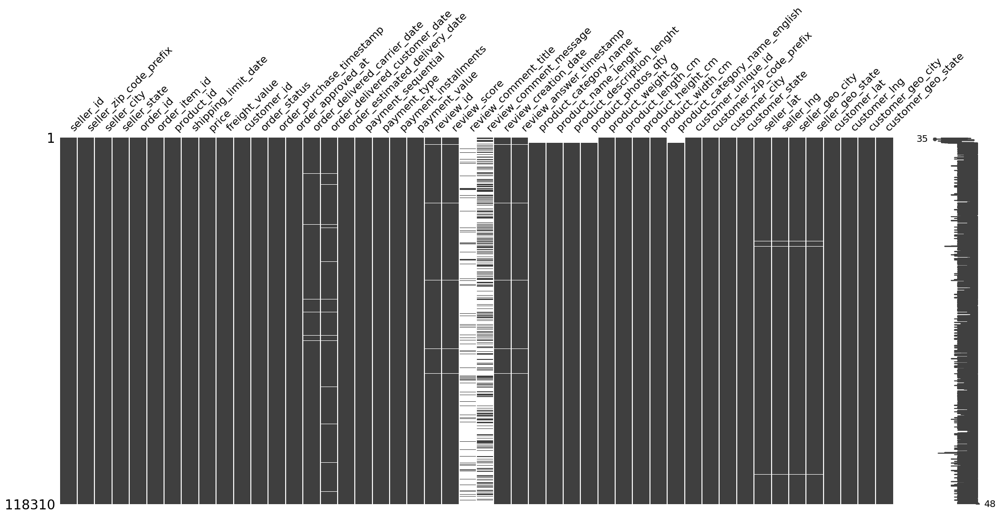

In [171]:
missingno.matrix(df)

#### Heatmap

Di bawah ini kita memplot Heatmap yang menunjukkan korelasi nulitas antara berbagai kolom yang memiliki data yang hilang pada dataset kita.

Korelasi nulitas berkisar dari -1 hingga 1.

- -1 - Korelasi Negatif yang menyatakan bahwa jika nilai satu variabel ada maka nilai variabel lain pasti tidak ada.
- 0 - Tidak ada korelasi yang menyatakan bahwa nilai variabel yang ada atau tidak ada tidak berpengaruh satu sama lain.
- 1 - Korelasi Positif yang menyatakan bahwa jika nilai satu variabel ada maka nilai yang lain pasti ada

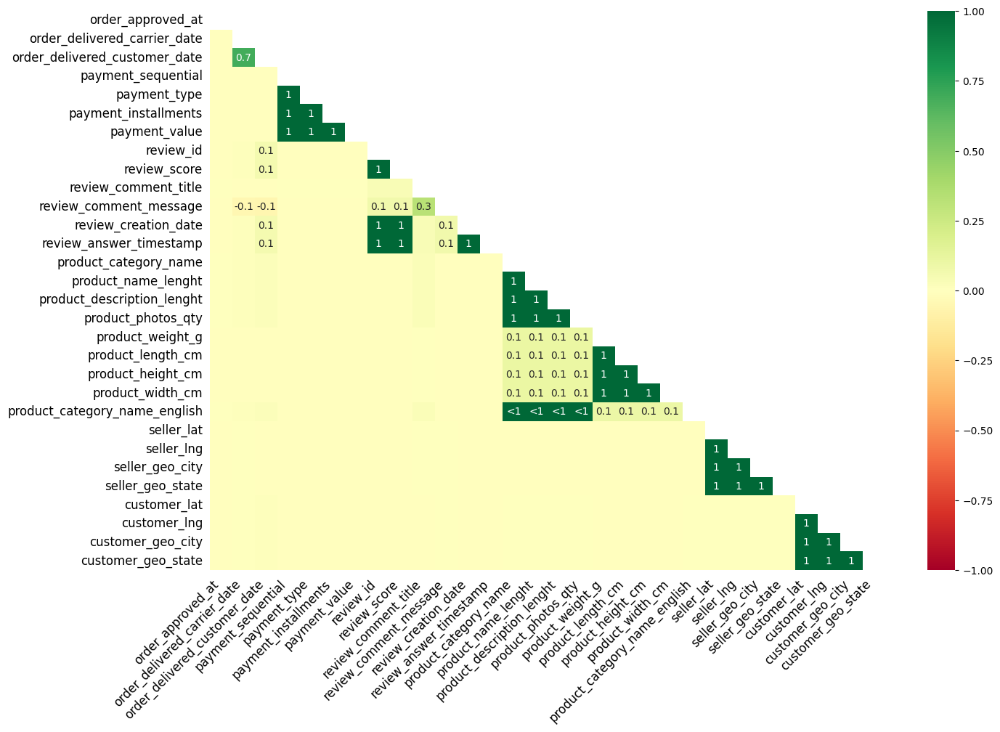

In [172]:
missingno.heatmap(df, cmap="RdYlGn", figsize=(15,10), fontsize=12);

Dari visualisasi terlihat bahwa beberapa kolom memiliki pola missing value yang sangat berkorelasi, artinya jika satu kolom missing maka kolom lain hampir pasti missing juga. Misalnya, seluruh kolom terkait review (seperti `review_id`, `review_score`, dan komentar) selalu missing bersamaan karena hanya muncul ketika customer benar-benar memberikan review. Hal yang sama terjadi pada atribut produk, jika data produk tidak tersedia, maka hampir semua kolom produk akan kosong secara serentak. Pola serupa juga muncul pada data geolokasi seller maupun customer, jika kode pos tidak bisa dipetakan, maka semua atribut geolokasi akan missing sekaligus. Selain itu, kolom tanggal pengiriman (`order_delivered_*`) juga sering missing bersamaan untuk order yang tidak pernah dikirim. Secara keseluruhan, missing values ini lebih mencerminkan proses bisnis (expected missing) daripada error, sehingga perlakuan terhadap missing value harus mempertimbangkan bahwa beberapa kolom memang selalu kosong secara kelompok.

#### Dendogram

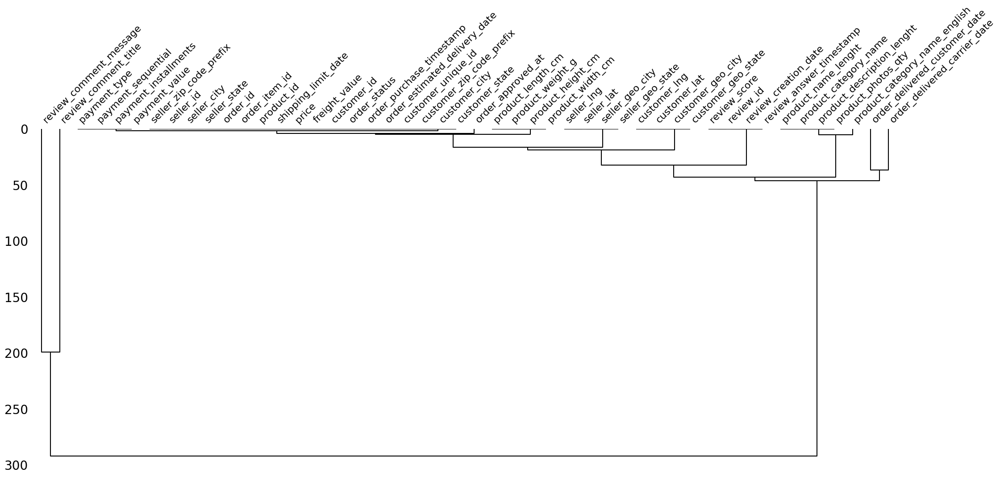

In [173]:
missingno.dendrogram(df)
plt.show()

#### Cleaning

In [174]:
# Menghapus baris yang mengandung missing values di kolom 'order_approved_at' dan 'order_delivered_carrier_date'

df = df.dropna(subset=['order_approved_at'])
df = df.dropna(subset=['order_delivered_carrier_date'])

Bagian ini membersihkan data dengan menghapus baris yang memiliki nilai kosong pada `order_approved_at` dan `order_delivered_carrier_date`. Kedua kolom tersebut berhubungan langsung dengan alur pemrosesan pesanan, sehingga baris yang tidak memiliki informasi waktu persetujuan atau waktu pengiriman ke kurir tidak bisa dipakai untuk analisis durasi. Dengan `dropna`, dataset yang tersisa hanya berisi pesanan dengan informasi proses yang lengkap.


In [175]:
# Imputasi menggunakan median review score tiap seller

# 1. Hitung median review per seller
median_per_seller = round(df.groupby('seller_id')['review_score'].median())

# 2. Hitung median global sebagai fallback
global_median = df['review_score'].median()


df = df.merge(
    median_per_seller.rename('seller_median'),
    on='seller_id',
    how='left'
)

df['review_score'] = df['review_score'].fillna(df['seller_median'])
df['review_score'] = df['review_score'].fillna(global_median) # Jika ada seller yang tidak memiliki median, maka diimputasi menggunakan median global

df = df.drop(columns=['seller_median'])

Langkah ini menangani nilai kosong pada `review_score` dengan pendekatan imputasi berbasis perilaku tiap penjual. Pertama dihitung median skor ulasan untuk setiap `seller_id`, karena penjual biasanya memiliki pola rating yang cukup konsisten. Jika sebuah pesanan tidak memiliki `review_score`, nilainya diisi menggunakan median milik penjual tersebut. Untuk kasus penjual yang tidak punya riwayat ulasan sama sekali, digunakan median global sebagai cadangan. Setelah proses pengisian selesai, kolom bantu `seller_median` dihapus kembali agar struktur data tetap ringkas. Metode ini menjaga agar imputasi tetap mencerminkan karakteristik masing-masing penjual tanpa menarik nilai terlalu jauh dari pola rating yang sebenarnya.


In [176]:
# Menghapus baris yang mengandung missing values di kolom 'review_creation_date' dan 'review_answer_timestamp'

df = df.dropna(subset=['review_creation_date'])
df = df.dropna(subset=['review_answer_timestamp'])

Kolom `review_creation_date` mencatat waktu sebuah ulasan dibuat, sedangkan `review_answer_timestamp` menunjukkan kapan ulasan tersebut dibalas oleh pihak penjual atau sistem. Jika salah satu dari keduanya kosong, rangkaian interaksi tidak lagi lengkap, sehingga metrik seperti kecepatan respons atau pola komunikasi menjadi tidak dapat dihitung dengan benar. Untuk menjaga kualitas analisis, baris yang tidak memiliki salah satu dari kedua informasi waktu ini dihapus sehingga hanya interaksi yang memiliki jejak waktu penuh yang dipertahankan.


In [177]:
# Menghapus baris yang mengandung missing values di kolom 'payment_sequential','payment_type','payment_installments', dan 'payment_value'

df = df.dropna(subset=['payment_sequential','payment_type','payment_installments','payment_value'])

Kolom `payment_sequential`, `payment_type`, `payment_installments`, dan `payment_value` berisi informasi utama tentang metode pembayaran dan rincian transaksinya. Jika salah satu di antaranya hilang, struktur pembayaran untuk pesanan tersebut menjadi tidak lengkap dan tidak dapat digunakan untuk analisis perilaku pembayaran atau perhitungan nilai transaksi. Karena itu, baris yang tidak memiliki informasi pada salah satu kolom tersebut dihapus agar seluruh data pembayaran yang tersisa benar-benar merepresentasikan proses transaksi secara utuh.


In [178]:
# Imputasi 'product_name_length' menggunakan median tiap seller

# 1. Hitung median panjang karakter nama produk per seller
median_per_seller_name = round(df.groupby('seller_id')['product_name_lenght'].median())

# 2. Hitung median global sebagai fallback
global_median = df['product_name_lenght'].median()


df = df.merge(
    median_per_seller_name.rename('seller_median_name'),
    on='seller_id',
    how='left'
)

df['product_name_lenght'] = df['product_name_lenght'].fillna(df['seller_median_name'])
df['product_name_lenght'] = df['product_name_lenght'].fillna(global_median)

df = df.drop(columns=['seller_median_name'])

Nilai kosong pada `product_name_lenght` diisi dengan pendekatan yang memanfaatkan pola tiap penjual. Pertama dihitung median panjang nama produk untuk setiap `seller_id`, karena karakteristik penamaan produk biasanya cenderung konsisten dalam satu toko. Nilai ini kemudian digunakan untuk mengisi baris yang tidak memiliki informasi panjang nama produk. Jika ada penjual yang tidak memiliki cukup data untuk menghasilkan median, imputasi digantikan dengan median global sebagai cadangan. Setelah proses pengisian selesai, kolom bantuan `seller_median_name` dihapus kembali agar tabel tetap bersih dan rapi. Pendekatan ini menjaga agar nilai hasil imputasi tetap mencerminkan gaya penamaan produk dari masing-masing penjual.


In [179]:
# Imputasi 'product_description_length' menggunakan median tiap seller

# 1. Hitung median panjang karakter deskripsi product per seller
median_per_seller_desc = round(df.groupby('seller_id')['product_description_lenght'].median())

# 2. Hitung median global sebagai fallback
global_median = df['product_description_lenght'].median()


df = df.merge(
    median_per_seller_desc.rename('seller_median_desc'),
    on='seller_id',
    how='left'
)

df['product_description_lenght'] = df['product_description_lenght'].fillna(df['seller_median_desc'])
df['product_description_lenght'] = df['product_description_lenght'].fillna(global_median)

df = df.drop(columns=['seller_median_desc'])

Bagian ini menangani kekosongan pada `product_description_lenght` dengan memanfaatkan pola penjual masing-masing. Median panjang deskripsi produk dihitung untuk setiap `seller_id`, karena penjual umumnya memiliki gaya penulisan deskripsi yang relatif seragam. Nilai median tersebut kemudian digunakan untuk mengisi baris yang tidak memiliki panjang deskripsi. Jika seorang penjual tidak memiliki cukup data untuk menghasilkan median, imputasi digantikan oleh median global agar tetap konsisten. Setelah pengisian selesai, kolom bantuan `seller_median_desc` dihapus untuk menjaga dataset tetap ringkas. Pendekatan ini memastikan nilai hasil imputasi tetap menggambarkan kecenderungan gaya deskripsi produk dari tiap penjual.


In [180]:
# Imputasi 'product_photos_qty' menggunakan median tiap seller

# 1. Hitung median jumlah foto produk per seller
median_per_seller_qty = round(df.groupby('seller_id')['product_photos_qty'].median())

# 2. Hitung median global sebagai fallback
global_median = df['product_photos_qty'].median()


df = df.merge(
    median_per_seller_qty.rename('seller_median_qty'),
    on='seller_id',
    how='left'
)

df['product_photos_qty'] = df['product_photos_qty'].fillna(df['seller_median_qty'])
df['product_photos_qty'] = df['product_photos_qty'].fillna(global_median)

df = df.drop(columns=['seller_median_qty'])

Nilai kosong pada `product_photos_qty` diisi dengan pendekatan berbasis pola tiap penjual. Median jumlah foto dihitung untuk setiap `seller_id`, karena banyaknya foto produk biasanya mengikuti kebiasaan masing-masing toko. Median tersebut digunakan untuk mengisi baris yang tidak memiliki jumlah foto. Jika ada penjual yang tidak punya cukup data untuk membentuk median, imputasi digantikan dengan median global agar tetap konsisten. Setelah semua nilai terisi, kolom sementara `seller_median_qty` dihapus kembali agar dataset tetap rapi. Pendekatan ini menghasilkan imputasi yang lebih realistis karena mengikuti gaya penyajian produk dari tiap penjual.


In [181]:
# Menghapus baris yang mengandung missing values di kolom 'product_weight_g', 'product_length_cm', 'product_height_cm', dan 'product_width_cm'

df = df.dropna(subset=['product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm'])

Kolom `product_weight_g`, `product_length_cm`, `product_height_cm`, dan `product_width_cm` berisi informasi dasar tentang dimensi dan bobot produk. Jika salah satu dari elemen ini hilang, detail fisik produk menjadi tidak lengkap sehingga analisis seperti estimasi biaya pengiriman atau perhitungan volume tidak bisa dilakukan dengan benar. Karena itu, baris yang tidak memiliki informasi pada salah satu kolom tersebut dihapus, memastikan hanya produk dengan data spesifikasi yang lengkap yang dipertahankan.


In [182]:
# Imputasi 'product_category_name_english' menggunakan median tiap seller

# Mode per seller
mode_cat_per_seller = (
    df.groupby('seller_id')['product_category_name_english']
      .agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
)

# Global mode
global_mode = df['product_category_name_english'].mode().iloc[0]

# Fallback
mode_cat_per_seller = mode_cat_per_seller.fillna(global_mode)

# Merge
df = df.merge(
    mode_cat_per_seller.rename('seller_cat_mode'),
    on='seller_id',
    how='left'
)

# Imputasi
df['product_category_name_english'] = df['product_category_name_english'].fillna(df['seller_cat_mode'])

df = df.drop(columns=['seller_cat_mode'])


Kolom `product_category_name_english` diisi ulang menggunakan kategori yang paling umum muncul pada tiap penjual. Mode dihitung untuk setiap `seller_id`, karena penjual biasanya berfokus pada jenis produk tertentu sehingga kategori yang paling sering muncul mencerminkan identitas tokonya. Jika seorang penjual tidak memiliki cukup data untuk menghasilkan mode, digunakan mode global sebagai cadangan agar tetap konsisten. Nilai hasil perhitungan ini kemudian digabungkan kembali ke dataset dan dipakai untuk mengisi baris yang sebelumnya memiliki kategori kosong. Setelah proses selesai, kolom bantu `seller_cat_mode` dihapus agar struktur data tetap sederhana. Pendekatan ini menjaga agar imputasi kategori tetap selaras dengan pola penjualan masing-masing toko.


In [183]:
df = df.dropna(subset=['seller_lat', 'seller_lng', 'seller_geo_city', 'seller_geo_state',
       'customer_lat', 'customer_lng', 'customer_geo_city',
       'customer_geo_state'])

Kolom lokasi seperti `seller_lat`, `seller_lng`, `seller_geo_city`, `seller_geo_state`, serta pasangan kolom milik pelanggan (`customer_lat`, `customer_lng`, `customer_geo_city`, `customer_geo_state`) berisi koordinat dan identitas geografis kedua pihak dalam transaksi. Jika salah satu dari informasi ini hilang, hubungan geografis antara penjual dan pembeli tidak bisa dianalisis dengan benar—misalnya perhitungan jarak, pola distribusi, maupun analisis wilayah. Karena itu, baris yang tidak memiliki salah satu elemen lokasi tersebut dihapus agar seluruh data yang tersisa benar-benar memiliki jejak posisi lengkap untuk penjual dan pelanggan.


In [184]:
cols_to_drop = [
    'review_comment_title',
    'review_comment_message',
    'order_delivered_customer_date',
    'review_id',
    'product_category_name'
]

In [185]:
df = df.drop(columns=cols_to_drop)

Kolom yang masuk dalam daftar cols_to_drop dihapus karena tidak lagi diperlukan untuk analisis lanjutan atau tidak memberikan kontribusi langsung terhadap pemodelan. Elemen seperti review_comment_title dan review_comment_message bersifat teks panjang yang tidak digunakan dalam perhitungan numerik. Kolom order_delivered_customer_date sebelumnya sudah diolah menjadi variabel turunan sehingga nilai aslinya tidak lagi dibutuhkan. Sementara itu, review_id dan product_category_name tidak memiliki fungsi analitis setelah versi terjemahan kategori dan skor ulasan sudah distandarkan. Penghapusan ini membuat dataset lebih ringkas dan fokus hanya pada kolom yang relevan.

In [186]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(), round((df[col].isna().sum()/len(df[col])) * 100,2),
                    df[col].nunique(), list(df[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dfDesc


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,seller_id,object,0,0.0,2965,"[68ca56ce86830f3d31b1b7ec6a54da3e, 23a0ffca143..."
1,seller_zip_code_prefix,object,0,0.0,2164,"[87040, 13030]"
2,seller_city,object,0,0.0,596,"[monte alegre do sul, itaquaquecetuba]"
3,seller_state,object,0,0.0,22,"[GO, CE]"
4,order_id,object,0,0.0,96413,"[715cf0bf4a5b1cfaaf01d77a000d4c8e, 61f92d1f21e..."
5,order_item_id,Int64,0,0.0,21,"[12, 9]"
6,product_id,object,0,0.0,32168,"[a268f9f5cf863852b5b091ebc8cc0171, 08ac23cd333..."
7,shipping_limit_date,"datetime64[us, UTC]",0,0.0,91264,"[2018-05-08T20:53:37.000000, 2017-08-11T19:55:..."
8,price,float64,0,0.0,5850,"[14.97, 101.7]"
9,freight_value,float64,0,0.0,6929,"[52.7, 22.96]"


Setelah proses handling missing value dilakukan, seluruh kolom yang sebelumnya memiliki nilai hilang kini sudah bersih sepenuhnya.

In [187]:
def calc_row_drop_percentage(df_raw, df_clean):
    raw_rows = len(seller_orders)
    clean_rows = len(df)
    dropped = raw_rows - clean_rows

    percent = dropped / raw_rows * 100
    return dropped, percent

# contoh pemakaian
dropped_rows, percent_rows = calc_row_drop_percentage(seller_orders, df)

print(f"Jumlah baris terhapus: {dropped_rows}")
print(f"Persentase baris terhapus: {percent_rows:.2f}%")


Jumlah baris terhapus: 2820
Persentase baris terhapus: 2.38%


Jumlah baris yang terhapus hanya 2.38%, menunjukkan bahwa proses pembersihan data tidak mengorbankan banyak observasi. Hilangnya 2.820 baris ini sangat kecil dibanding total data, sehingga struktur dan distribusi utama dataset tetap terjaga untuk analisis lanjutan.

### Handling Data Duplicates

In [188]:
df.duplicated().sum()

np.int64(0)

Pengecekan duplikasi menunjukkan tidak ada baris ganda yang ditemukan. Ini berarti seluruh observasi dalam dataset bersifat unik, tidak ada pengulangan entri yang bisa mendistorsi distribusi, memengaruhi agregasi, atau menimbulkan bias pada model.

### Penambahan Fitur

Penelitian ini berfokus pada seller sehingga untuk mechine learning, data yang digunakan adalah data yang merepresentasikan 1 seller untuk 1 baris. Dengan begitu, langkah selanjutnya adalah melakukan agregasi.


Namun, sebelum dilakukan agregasi, perlu dilakukan perhitungan untuk membuat fitur-fitur berdasarkan fitur yang ada.


| Nama Fitur                           | Penjelasan                                                                 |
|--------------------------------------|-----------------------------------------------------------------------------|
| seller_customer_distance_km   | Jarak (km) antara lokasi seller dan lokasi customer yang pernah dilayani. |
| lead_time_approval_hours       | Lama waktu (jam) dari tiap order dibuat hingga disetujui. |
| review_response_hours         | Selisih jam antara review dibuat dan review dijawab.     |
| order_product_ratio                  | Rasio jumlah order unik terhadap jumlah produk unik yang dijual seller.     |
| buffer_time_days                 | Hari ekstra antara delivery carrier tercepat dan delivery limit. |
| avg_items_per_order                  | Rata-rata jumlah item dalam setiap order.                                  |
| gmv_per_order                        | GMV rata-rata (payment_value) per order unik.                               |
| gmv_per_customer                     | GMV rata-rata per customer unik untuk seller tersebut.                      |
| freight_gmv_ratio                    | Rasio total freight_value terhadap payment_value (indikasi biaya logistik). |
| price_range                          | Rentang harga produk seller (harga max - harga min).                        |
| price_range_normalized               | Rentang harga yang dinormalisasi oleh rata-rata harga seller.               |
| account_age                          | Umur akun seller (hari) dari carrier delivery pertama hingga carrier delivery maksimal dataset. |
| recency                              | Berapa hari sejak pengiriman terakhir seller dibanding observation date (maximum global).       |
| Activity_Rate                        | Tingkat aktivitas seller = jumlah order unik / account_age.                 |
| AOV                                  | Average Order Value berdasarkan total price per seller dibagi order unik.   |


In [189]:
# 0. PREPARE DATA: pisahkan data yang order_status nya bukan canceled
#    Untuk menghitung monetary values
df_valid = df[df['order_status'] != 'canceled'].copy()
df_valid['price'] = df_valid['price'].fillna(0)
df_valid['payment_value'] = df_valid['payment_value'].fillna(0)

# price & payment = NON-CANCELED ONLY
price_sum_valid = df_valid.groupby('seller_id')['price'].sum()
price_min_valid = df_valid.groupby('seller_id')['price'].min()
price_max_valid = df_valid.groupby('seller_id')['price'].max()
price_mean_valid = df_valid.groupby('seller_id')['price'].mean()

payment_sum_valid = df_valid.groupby('seller_id')['payment_value'].sum()

# freight = ALL ORDERS (include canceled)
freight_sum_all = df.groupby('seller_id')['freight_value'].sum()

# 1. seller_customer_distance_km
from geopy.distance import geodesic

def compute_distance(row):
    seller_point = (row['seller_lat'], row['seller_lng'])
    customer_point = (row['customer_lat'], row['customer_lng'])
    return geodesic(seller_point, customer_point).km

df['seller_customer_distance_km'] = df.apply(compute_distance, axis=1)

# 2. lead_time_approval_hours
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

df['seller_lead_time_approval_hours'] = (
    (df['order_approved_at'] - df['order_purchase_timestamp'])
    .dt.total_seconds() / 3600
)

# 3. seller_review_response_hours
df['review_creation_date'] = pd.to_datetime(df['review_creation_date'])
df['review_answer_timestamp'] = pd.to_datetime(df['review_answer_timestamp'])

df['seller_review_response_hours'] = (
    (df['review_answer_timestamp'] - df['review_creation_date'])
    .dt.total_seconds() / 3600
)

# 4. order_product_ratio
order_nunique = df.groupby('seller_id')['order_id'].transform('nunique')
product_nunique = df.groupby('seller_id')['product_id'].transform('nunique')

df['order_product_ratio'] = order_nunique / product_nunique

# 5. seller_buffer_time_days
df['order_delivered_carrier_date'] = pd.to_datetime(df['order_delivered_carrier_date'])
df['shipping_limit_date'] = pd.to_datetime(df['shipping_limit_date'])

df['seller_buffer_time_days'] = (
    (df['shipping_limit_date'] - df['order_delivered_carrier_date']).dt.days
)

# 6. avg_items_per_order
item_count = df.groupby('seller_id')['order_item_id'].transform('count')
df['avg_items_per_order'] = item_count / order_nunique

# 7. gmv_per_order (payment_value NON-CANCELED)
df['gmv_per_order'] = df['seller_id'].map(payment_sum_valid) / order_nunique

# 8. gmv_per_customer
customer_nunique = df.groupby('seller_id')['customer_unique_id'].transform('nunique')

df['gmv_per_customer'] = (
    df['seller_id'].map(payment_sum_valid) / customer_nunique
)

# 9. freight_gmv_ratio
# freight = all orders, gmv = non-canceled → sesuai bisnis
df['freight_gmv_ratio'] = (
    df['seller_id'].map(freight_sum_all)
    / df['seller_id'].map(payment_sum_valid)
)

# 10. price_range (NON-CANCELED)
df['price_range'] = (
    df['seller_id'].map(price_max_valid)
    - df['seller_id'].map(price_min_valid)
)

# 10b. price_range_normalized (NON-CANCELED)
df['price_range_normalized'] = (
    df['price_range'] / df['seller_id'].map(price_mean_valid)
)

# 11. account_age (semua transaksi)
global_max = df['order_delivered_carrier_date'].max()
seller_first = df.groupby('seller_id')['order_delivered_carrier_date'].transform('min')

df['account_age'] = (global_max - seller_first).dt.days

# filter > 30 hari
df = df[df['account_age'] > 30].copy()

# 12. recency
seller_last = df.groupby('seller_id')['order_delivered_carrier_date'].transform('max')

df['recency'] = (global_max - seller_last).dt.days

# 13. Activity Rate
df['Activity_Rate'] = order_nunique.loc[df.index] / df['account_age']

# 14. AOV (price NON-CANCELED)
df['AOV'] = df['seller_id'].map(price_sum_valid) / order_nunique


Proses yang dilakukan adalah membangun serangkaian fitur perilaku seller, mulai dari menghitung jarak median seller-customer, kecepatan persetujuan order pertama dan terakhir, respons terhadap review, pola pengiriman terhadap batas waktu, hingga performa transaksi seperti rata-rata nilai order, GMV per order maupun per customer, variasi harga, umur akun, recency, tingkat aktivitas, dan AOV.  Hasil akhirnya adalah dataset seller yang telah diperkaya dengan indikator operasional dan finansial yang kuat, sehingga sangat siap dipakai untuk memprediksi kemungkinan churn berdasarkan pola aktivitas dan kualitas performa mereka di platform.


In [190]:
df[['seller_id','order_delivered_carrier_date']].sort_values('seller_id')

,seller_id,order_delivered_carrier_date
88854,0015a82c2db000af6aaaf3ae2ecb0532,2017-09-29 15:53:03+00:00
88853,0015a82c2db000af6aaaf3ae2ecb0532,2017-10-20 14:29:01+00:00
88855,0015a82c2db000af6aaaf3ae2ecb0532,2017-10-17 15:42:42+00:00
54798,001cca7ae9ae17fb1caed9dfb1094831,2018-01-02 17:48:13+00:00
54797,001cca7ae9ae17fb1caed9dfb1094831,2017-04-04 13:04:34+00:00
...,...,...
7116,ffff564a4f9085cd26170f4732393726,2017-01-25 16:05:15+00:00
7117,ffff564a4f9085cd26170f4732393726,2017-01-26 16:32:31+00:00
41521,ffff564a4f9085cd26170f4732393726,2017-01-26 16:41:28+00:00
41520,ffff564a4f9085cd26170f4732393726,2017-01-25 16:51:53+00:00


In [191]:
df_sorted = df.sort_values(
    by=['seller_id', 'order_delivered_carrier_date'],
    ascending=[True, True]
)

In [192]:
df_sorted['order_delivered_carrier_date'] = pd.to_datetime(df_sorted['order_delivered_carrier_date'])
df_sorted['prev_delivered_date'] = df_sorted.groupby('seller_id')['order_delivered_carrier_date'].shift(1)

In [193]:

df_sorted['delivery_time_gap'] = df_sorted['order_delivered_carrier_date'] - df_sorted['prev_delivered_date']

In [194]:
# Mengubah selisih waktu (timedelta) menjadi jumlah hari
df_sorted['gap_days'] = df_sorted['delivery_time_gap'].dt.days
df_sorted = df_sorted.dropna()
print(df_sorted[['seller_id', 'order_delivered_carrier_date', 'prev_delivered_date', 'delivery_time_gap', 'gap_days']].head(10))

                              seller_id order_delivered_carrier_date  \
88855  0015a82c2db000af6aaaf3ae2ecb0532    2017-10-17 15:42:42+00:00   
88853  0015a82c2db000af6aaaf3ae2ecb0532    2017-10-20 14:29:01+00:00   
54742  001cca7ae9ae17fb1caed9dfb1094831    2017-02-21 07:07:39+00:00   
54780  001cca7ae9ae17fb1caed9dfb1094831    2017-02-21 07:07:39+00:00   
54867  001cca7ae9ae17fb1caed9dfb1094831    2017-02-21 07:07:39+00:00   
54873  001cca7ae9ae17fb1caed9dfb1094831    2017-02-21 07:07:39+00:00   
54885  001cca7ae9ae17fb1caed9dfb1094831    2017-02-21 07:07:39+00:00   
54763  001cca7ae9ae17fb1caed9dfb1094831    2017-02-24 11:08:35+00:00   
54822  001cca7ae9ae17fb1caed9dfb1094831    2017-03-03 05:23:34+00:00   
54897  001cca7ae9ae17fb1caed9dfb1094831    2017-03-03 05:23:34+00:00   

            prev_delivered_date delivery_time_gap  gap_days  
88855 2017-09-29 15:53:03+00:00  17 days 23:49:39      17.0  
88853 2017-10-17 15:42:42+00:00   2 days 22:46:19       2.0  
54742 2017-02-10 09:2

(array([1.10955e+05, 1.03400e+03, 2.56000e+02, 7.50000e+01, 2.80000e+01,
        9.00000e+00, 7.00000e+00, 5.00000e+00, 0.00000e+00, 2.00000e+00]),
 array([  0. ,  57.5, 115. , 172.5, 230. , 287.5, 345. , 402.5, 460. ,
        517.5, 575. ]),
 <BarContainer object of 10 artists>)

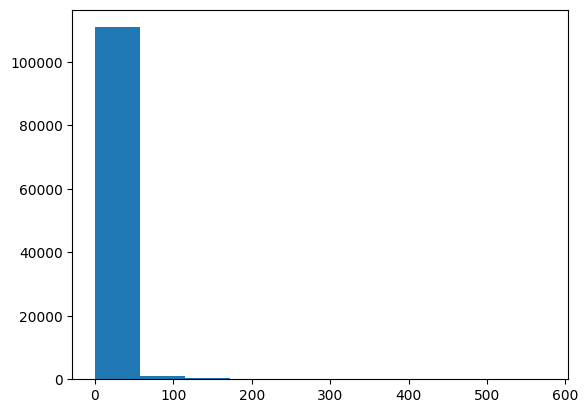

In [195]:
plt.hist(df_sorted['gap_days'])

In [196]:
df_sorted['gap_days'].describe()

,gap_days
count,112371.000000
mean,4.456301
std,14.760010
min,0.000000
25%,0.000000
50%,0.000000
75%,3.000000
max,575.000000


Berdasarkan analisis distribusi **gap antar order per seller**, terlihat bahwa pola aktivitas transaksi seller sangat terkonsentrasi pada interval waktu yang pendek. Hal ini tercermin dari:

* **Median (50%) gap = 0 hari** → setengah dari seluruh transaksi terjadi tanpa jeda hari sama sekali (seller sangat aktif).
* **75% gap = 3 hari** → tiga perempat transaksi terjadi dengan jarak ≤ 3 hari.
* **Rata-rata hanya 4,4 hari**, meskipun terdapat outlier hingga 575 hari.
* Histogram menunjukkan sebagian besar seller bertransaksi kembali dalam rentang **0–10 hari**, dan hanya sebagian kecil yang memiliki gap panjang.

Dengan kata lain, **pola normal seller yang aktif adalah melakukan transaksi kembali dalam waktu sangat dekat**. Ketika gap semakin panjang, aktivitas seller semakin menurun dan menjauhi pola umumnya.

Karena itulah **threshold 30 hari dipilih sebagai definisi seller churn**:

* Jauh di atas pola normal aktivitas seller (0–3 hari)
* Memberi toleransi cukup besar terhadap variasi aktivitas (holiday, stok habis, cuti operasional, dll.)
* Pada sisi bisnis, 30 hari inaktivitas sudah mencerminkan **hilangnya engagement dan potensi hilangnya revenue** dari seller tersebut.

Sehingga, **seller dikategorikan churn apabila selama 30 hari tidak melakukan transaksi**, karena pada titik tersebut ia sudah menyimpang jauh dari pola perilaku seller aktif dan menunjukkan risiko berhenti berjualan.

---


### Data Agregat

Agregasi yang akan dilakukan untuk setiap kolom:


| Kolom / Fitur                               | Perlakuan / Agregasi                 | Penjelasan / Catatan                                                                 |
|---------------------------------------------|---------------------------------------|--------------------------------------------------------------------------------------|
| seller_id                                   | Key agregasi                          | Identitas unik seller                                                               |
| seller_zip_code_prefix                      | Hapus                                 | Tidak relevan setelah perhitungan jarak                                             |
| seller_city                                 | Modus                                 | Kota seller dominan                                                                 |
| seller_state                                | Modus                                 | Provinsi seller dominan                                                             |
| seller_lat                                  | Hapus                                 | Digantikan perhitungan jarak                                                        |
| seller_lng                                  | Hapus                                 | Digantikan perhitungan jarak                                                        |
| seller_geo_city                             | Hapus                                 | Redundan dengan seller_city                                                         |
| seller_geo_state                            | Hapus                                 | Redundan dengan seller_state                                                        |
| order_id                                    | Count unik                            | Total order unik per seller                                                         |
| order_item_id                               | Count                                 | Total item terjual                                                                   |
| product_id                                  | Count unik                            | Variasi produk yang dijual                                                          |
| shipping_limit_date                         | Hapus                                 | Tidak dibutuhkan setelah buffer time                                                |
| price                                       | Min, Max, Mean, Sum, Median           | Statistik harga dan total nilai transaksi                                           |
| freight_value                               | Min, Max, Mean, Sum, Median           | Statistik ongkir dan total ongkir                                                   |
| customer_id                                 | Count unik                            | Jumlah pembeli unik                                                                  |
| order_status                                | Modus                                 | Status order yang paling umum                                                       |
| order_purchase_timestamp                    | Hapus                                 | Dipakai sebelumnya untuk lead-time approval                                         |
| order_approved_at                           | Hapus                                 | Dipakai sebelumnya untuk lead-time approval                                         |
| order_delivered_carrier_date                | Min, Max                              | Untuk account age dan recency                                                       |
| order_estimated_delivery_date               | Hapus                                 | Tidak digunakan setelah buffer time                                                 |
| payment_sequential                          | Hapus                                 | Tidak relevan                                                                        |
| payment_type                                | Modus                                 | Metode pembayaran dominan                                                           |
| payment_installments                        | Min, Max, Median, Mean                | Distribusi cicilan pelanggan                                                        |
| payment_value                               | Min, Max, Mean, Sum, Median           | Statistik pembayaran dan total revenue                                              |
| review_score                                | Min, Max, Mean, Median                | Profil kepuasan pelanggan                                                          |
| review_creation_date                        | Hapus                                 | Dipakai sebelumnya untuk response time                                              |
| review_answer_timestamp                     | Hapus                                 | Dipakai sebelumnya untuk response time                                              |
| product_name_lenght                         | Min, Max, Median, Mean                | Panjang nama produk                                                                 |
| product_description_lenght                  | Min, Max, Median, Mean                | Panjang deskripsi produk                                                            |
| product_photos_qty                          | Min, Max, Median, Mean                | Jumlah foto produk                                                                  |
| product_weight_g                            | Min, Max, Median, Mean                | Berat produk                                                                        |
| product_length_cm                           | Min, Max, Median, Mean                | Dimensi panjang produk                                                              |
| product_height_cm                           | Min, Max, Median, Mean                | Dimensi tinggi produk                                                               |
| product_width_cm                            | Min, Max, Median, Mean                | Dimensi lebar produk                                                                |
| product_category_name_english               | Modus                                 | Kategori produk dominan                                                             |
| customer_unique_id                          | Hapus                                 | Tidak relevan dalam analisis                                                        |
| customer_zip_code_prefix                    | Hapus                                 | Tidak relevan setelah perhitungan jarak                                             |
| customer_city                               | Modus                                 | Kota customer dominan                                                               |
| customer_state                              | Modus                                 | Provinsi customer dominan                                                           |
| customer_lat                                | Hapus                                 | Digantikan median jarak                                                             |
| customer_lng                                | Hapus                                 | Sama                                                                                |
| customer_geo_city                           | Hapus                                 | Redundan                                                                            |
| customer_geo_state                          | Hapus                                 | Redundan                                                                            |
| seller_customer_distance_km          | Min, Max, Median, Mean                | Jarak antara seller dan customer                                            |
| review_response_hours               | Min, Max, Median, Mean                | Rentang waktu total respons review seller                                           |
| lead_time_approval_hours              | Min, Max, Median, Mean                | Waktu approval order                                                     |                
| buffer_time_days                        | Min, Max, Median, Mean                | Keterlambatan pengiriman                                                               |
| avg_items_per_order                         | First                          | Sudah point of view seller                                                     |
| gmv_per_order                               | First                          | Sama                                                           |
| gmv_per_customer                            | First                          | Sudah point of view seller                                                                |
| freight_gmv_ratio                           | First                          | Sama                                                           |
| price_range                                 | First                | Rentang harga produk seller                                                         |
| price_range_normalized                      | First                          | Rentang harga relatif terhadap harga rata-rata seller                               |
| account_age                                 | First                | Usia akun seller                                                                    |
| recency                                     | First                          | Seberapa baru pengiriman terakhir                                                   |
| Activity_Rate                               | First                          | Rasio order unik terhadap umur akun                                                 |
| AOV                                         | First                          | Average order value seller                                                          |


In [197]:
# 1. DEFINISI AGG DICTIONARY
def mode_func(x):
    m = x.mode()
    return m.iloc[0] if not m.empty else None

mode_func.__name__ = "mode_"
mode_ = mode_func

agg_dict = {

    # seller info
    'seller_city': mode_,
    'seller_state': mode_,

    # order & product
    'order_id': 'nunique',
    'order_item_id': 'count',
    'product_id': 'nunique',

    # price
    'price': ['min', 'max', 'mean', 'sum', 'median'],

    # freight
    'freight_value': ['min', 'max', 'mean', 'sum', 'median'],

    # customers
    'customer_id': 'nunique',
    'order_status': mode_,

    # payments
    'payment_type': mode_,
    'payment_installments': ['min', 'max', 'median', 'mean'],
    'payment_value': ['min', 'max', 'mean', 'sum', 'median'],

    # review scores
    'review_score': ['min', 'max', 'mean', 'median'],

    # product metadata
    'product_name_lenght': ['min', 'max', 'median', 'mean'],
    'product_description_lenght': ['min', 'max', 'median', 'mean'],
    'product_photos_qty': ['min', 'max', 'median', 'mean'],
    'product_weight_g': ['min', 'max', 'median', 'mean'],
    'product_length_cm': ['min', 'max', 'median', 'mean'],
    'product_height_cm': ['min', 'max', 'median', 'mean'],
    'product_width_cm': ['min', 'max', 'median', 'mean'],
    'product_category_name_english': mode_,


    # customer area
    'customer_city': mode_,
    'customer_state': mode_,

# 2. AGGREGASI UNTUK FITUR BARU

    # jarak
    'seller_customer_distance_km': ['min', 'max', 'mean', 'median'],

    # response time review
    'seller_review_response_hours': ['min', 'max', 'mean', 'median'],

    # approval time
    'seller_lead_time_approval_hours': ['min', 'max', 'mean', 'median'],

    # buffer time
    'seller_buffer_time_days': ['min', 'max', 'mean', 'median'],

    # seller-level summary behavior
    'avg_items_per_order': 'first',
    'gmv_per_order': 'first',
    'gmv_per_customer': 'first',
    'freight_gmv_ratio': 'first',
    'price_range': 'first',
    'price_range_normalized': 'first',
    'account_age': 'first',
    'recency': 'first',
    'Activity_Rate': 'first',
    'AOV': 'first',
}

# 3. LAKUKAN AGGREGASI

df_agg = df.groupby('seller_id').agg(agg_dict)

# rapikan kolom multiindex menjadi single level
df_agg.columns = [
    "_".join(col).rstrip("_") for col in df_agg.columns
]

df_agg= df_agg.reset_index()

# HAPUS SUFFIX "_first" UNTUK KOLOM AGREGASI 'first'
# daftar kolom yang kamu beri agregasi 'first'
first_cols = [
    'avg_items_per_order',
    'gmv_per_order',
    'gmv_per_customer',
    'freight_gmv_ratio',
    'price_range',
    'price_range_normalized',
    'account_age',
    'recency',
    'Activity_Rate',
    'AOV'
]

rename_map = {}

for col in df_agg.columns:
    for base in first_cols:
        if col == f"{base}_first":
            rename_map[col] = base  # buang "_first"

df_agg = df_agg.rename(columns=rename_map)

In [198]:
df_agg

,seller_id,seller_city_mode,seller_state_mode,order_id_nunique,order_item_id_count,product_id_nunique,price_min,price_max,price_mean,price_sum,price_median,freight_value_min,freight_value_max,freight_value_mean,freight_value_sum,freight_value_median,customer_id_nunique,order_status_mode,payment_type_mode,payment_installments_min,payment_installments_max,payment_installments_median,payment_installments_mean,payment_value_min,payment_value_max,payment_value_mean,payment_value_sum,payment_value_median,review_score_min,review_score_max,review_score_mean,review_score_median,product_name_lenght_min,product_name_lenght_max,product_name_lenght_median,product_name_lenght_mean,product_description_lenght_min,product_description_lenght_max,product_description_lenght_median,product_description_lenght_mean,product_photos_qty_min,product_photos_qty_max,product_photos_qty_median,product_photos_qty_mean,product_weight_g_min,product_weight_g_max,product_weight_g_median,product_weight_g_mean,product_length_cm_min,product_length_cm_max,product_length_cm_median,product_length_cm_mean,product_height_cm_min,product_height_cm_max,product_height_cm_median,product_height_cm_mean,product_width_cm_min,product_width_cm_max,product_width_cm_median,product_width_cm_mean,product_category_name_english_mode,customer_city_mode,customer_state_mode,seller_customer_distance_km_min,seller_customer_distance_km_max,seller_customer_distance_km_mean,seller_customer_distance_km_median,seller_review_response_hours_min,seller_review_response_hours_max,seller_review_response_hours_mean,seller_review_response_hours_median,seller_lead_time_approval_hours_min,seller_lead_time_approval_hours_max,seller_lead_time_approval_hours_mean,seller_lead_time_approval_hours_median,seller_buffer_time_days_min,seller_buffer_time_days_max,seller_buffer_time_days_mean,seller_buffer_time_days_median,avg_items_per_order,gmv_per_order,gmv_per_customer,freight_gmv_ratio,price_range,price_range_normalized,account_age,recency,Activity_Rate,AOV
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3,3,1,895.00,895.00,895.000000,2685.00,895.00,21.02,21.02,21.020000,63.06,21.020,3,delivered,credit_card,4,10,8.0,7.333333,916.02,916.02,916.020000,2748.06,916.020,1,5,3.666667,5.0,40,40,40.0,40.0,849,849,849.0,849.0,2,2,2.0,2.0,11800,11800,11800.0,11800.0,40,40,40.0,40.0,43,43,43.0,43.0,36,36,36.0,36.0,small_appliances,entre rios de minas,MG,416.643914,711.406171,605.636471,688.859329,14.545000,93.712500,43.837222,23.254167,0.266667,24.119722,13.349722,15.662778,0,13,5.666667,4.0,1.0,916.020000,916.020000,0.022947,0.00,0.000000,347,326,0.008646,895.000000
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,197,238,11,69.90,199.00,104.785420,24938.93,99.00,14.72,114.62,37.101681,8830.20,36.855,197,delivered,credit_card,1,10,2.0,3.676471,27.27,735.96,201.441050,47942.97,151.160,1,5,3.911765,5.0,28,51,36.0,35.836134,380,706,450.0,471.978992,1,4,1.0,1.785714,7400,10900,9000.0,8977.10084,39,44,42.0,41.588235,12,15,12.0,12.836134,33,43,39.0,39.096639,garden_tools,sao paulo,SP,15.224453,2531.747904,810.838971,736.350899,10.415556,1341.526667,64.497465,38.786667,0.000000,92.511389,10.810749,0.301806,-8,10,2.970588,3.0,1.208122,243.365330,243.365330,0.184181,129.10,1.232042,578,60,0.340830,126.593553
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,51,59,24,9.90,129.90,22.086441,1303.10,17.90,4.91,34.15,14.208644,838.31,15.100,51,delivered,credit_card,1,5,1.0,1.440678,5.27,182.92,42.005593,2478.33,33.000,1,5,4.033898,5.0,42,60,56.0,55.20339,646,718,646.0,654.542373,1,1,1.0,1.0,200,900,300.0,327.966102,16,20,16.0,16.067797,16,30,30.0,28.338983,16,20,20.0,19.525424,furniture_decor,sao paulo,SP,84.865143,2113.751319,521.073812,359.114346,2.874444,404.226944,53.287076,34.952500,0.122778,554.785000,22.195664,0.300833,-14,6,1.983051,3.0,1.156863,48.594706,48.594706,0.338256,120.00,5.433198,361,151,0.141274,25.550980
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,1,1,1,120.00,120.00,120.000000,120.00,120.00,19.38,19.38,19.380000,19.

In [199]:
df_agg.columns.tolist()

['seller_id',
 'seller_city_mode',
 'seller_state_mode',
 'order_id_nunique',
 'order_item_id_count',
 'product_id_nunique',
 'price_min',
 'price_max',
 'price_mean',
 'price_sum',
 'price_median',
 'freight_value_min',
 'freight_value_max',
 'freight_value_mean',
 'freight_value_sum',
 'freight_value_median',
 'customer_id_nunique',
 'order_status_mode',
 'payment_type_mode',
 'payment_installments_min',
 'payment_installments_max',
 'payment_installments_median',
 'payment_installments_mean',
 'payment_value_min',
 'payment_value_max',
 'payment_value_mean',
 'payment_value_sum',
 'payment_value_median',
 'review_score_min',
 'review_score_max',
 'review_score_mean',
 'review_score_median',
 'product_name_lenght_min',
 'product_name_lenght_max',
 'product_name_lenght_median',
 'product_name_lenght_mean',
 'product_description_lenght_min',
 'product_description_lenght_max',
 'product_description_lenght_median',
 'product_description_lenght_mean',
 'product_photos_qty_min',
 'product_

Bagian ini membangun kamus agregasi besar untuk merangkum seluruh perilaku seller, mulai dari kota asal, pola order, harga, freight, pembayaran, kualitas produk, hingga fitur-fitur baru seperti jarak median, respons review, lead time approval, buffer pengiriman, aktivitas, dan AOV. Setiap seller kemudian diringkas lewat kombinasi statistik seperti min, max, mean, median, dan mode untuk menghasilkan satu baris profil komprehensif per seller.

### **Pembuatan Label**


Definisi target biner untuk modeling:

* **0 : Seller tidak churn**
  Seller masih dianggap aktif pada akhir periode observasi. Ciri-ciri:

  * Masih menerima order pada periode waktu 1 bulan.
  * Memiliki aktivitas penjualan yang terlihat di data dengan minimal 1 bulan.

* **1 : Seller churn**
  Seller dianggap churn jika:

  * Pernah aktif (memiliki order) pada periode observasi, dan
  * Tidak menerima order sama sekali dalam jangka waktu 1 bulan.

In [200]:
# Churn Label
df_agg['churn'] = (df_agg['recency'] > 30).astype(int)
df_agg['churn']

,churn
0,1
1,1
2,1
3,1
4,1
...,...
2866,0
2867,0
2868,1
2869,0


In [201]:
df_agg['churn'][df_agg['churn']==1].sum()

np.int64(1910)

Label churn didefinisikan sebagai seller yang tidak lagi melakukan transaksi selama lebih dari 30 hari (`recency` > 30). Dengan kata lain, seller dianggap churn apabila tidak menunjukkan aktivitas penjualan dalam rentang waktu tersebut.

## **Uji Normalitas**
---

In [202]:
# pilih kolom numerik
num_cols = df_agg.select_dtypes(include=['int64', 'float64']).columns.drop('churn')

# list untuk menampung hasil
results = []

for col in num_cols:
    stat, p = shapiro(df_agg[col])

    results.append({
        'feature': col,
        'statistic': stat,
        'p_value': p,
        'normality': 'Normal' if p > 0.05 else 'Not Normal'
    })

# jadikan dataframe
normality_df = pd.DataFrame(results)

normality_df


,feature,statistic,p_value,normality
0,order_id_nunique,0.282396,1.537739e-74,Not Normal
1,order_item_id_count,0.277145,1.090592e-74,Not Normal
2,product_id_nunique,0.414037,1.879620e-70,Not Normal
3,price_min,0.275346,9.699088e-75,Not Normal
4,price_max,0.547016,1.972537e-65,Not Normal
...,...,...,...,...
76,price_range_normalized,0.738866,2.512422e-55,Not Normal
77,account_age,0.945141,1.979954e-31,Not Normal
78,recency,0.775374,1.026012e-52,Not Normal
79,Activity_Rate,0.364640,4.528750e-72,Not Normal


Hasilnya menunjukkan bahwa seluruh 82 fitur memiliki p-value yang sangat kecil (jauh di bawah 0,05), sehingga tidak ada cukup bukti untuk menunjukkan bahwa fitur berdistribusi normal; implikasinya, analisis selanjutnya lebih cocok menggunakan metode non-parametrik atau model yang tidak mensyaratkan asumsi normalitas (misalnya tree-based) daripada metode statistik klasik yang sensitif terhadap distribusi normal.

## **EDA Univariat**
---

### Variabel Numerik

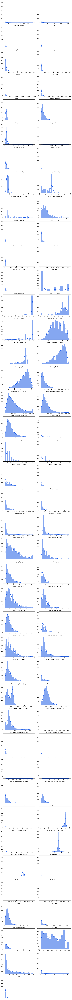

In [203]:
num_cols = df_agg.select_dtypes(include=['int64', 'float64']).columns.drop(['churn'])

n_cols = 2
n_rows = (len(num_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(12, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(df_agg[col], kde=True, color="#0D50E4", edgecolor=None)
    plt.title(col)
    plt.xlabel("")
    plt.ylabel("")

plt.tight_layout()
plt.show()


Histogram di atas menunjukkan distribusi masing-masing variabel numerik dalam dataset setelah proses agregasi pada level seller. Secara umum, mayoritas fitur memiliki sebaran yang sangat right-skewed (condong ke kanan), di mana sebagian besar nilai terkonsentrasi di dekat 0 dan hanya sedikit seller yang memiliki nilai yang jauh lebih tinggi (long-tail). Pola seperti ini wajar ditemukan pada data transaksi e-commerce, karena sebagian besar seller cenderung memiliki aktivitas rendah hingga menengah, sementara hanya sedikit seller yang sangat aktif dan mendominasi volume penjualan.

Distribusi yang tidak normal ini penting diperhatikan karena dapat mempengaruhi performa model, terutama model linear yang sensitif terhadap skewness dan nilai ekstrem. Oleh karena itu, pada bagian selanjutnya akan dilakukan analisis outlier dan extreme outlier untuk setiap variabel numerik guna memahami dampaknya terhadap fitur dan model.

### Variabel Kategorik

#### Nunique > 5

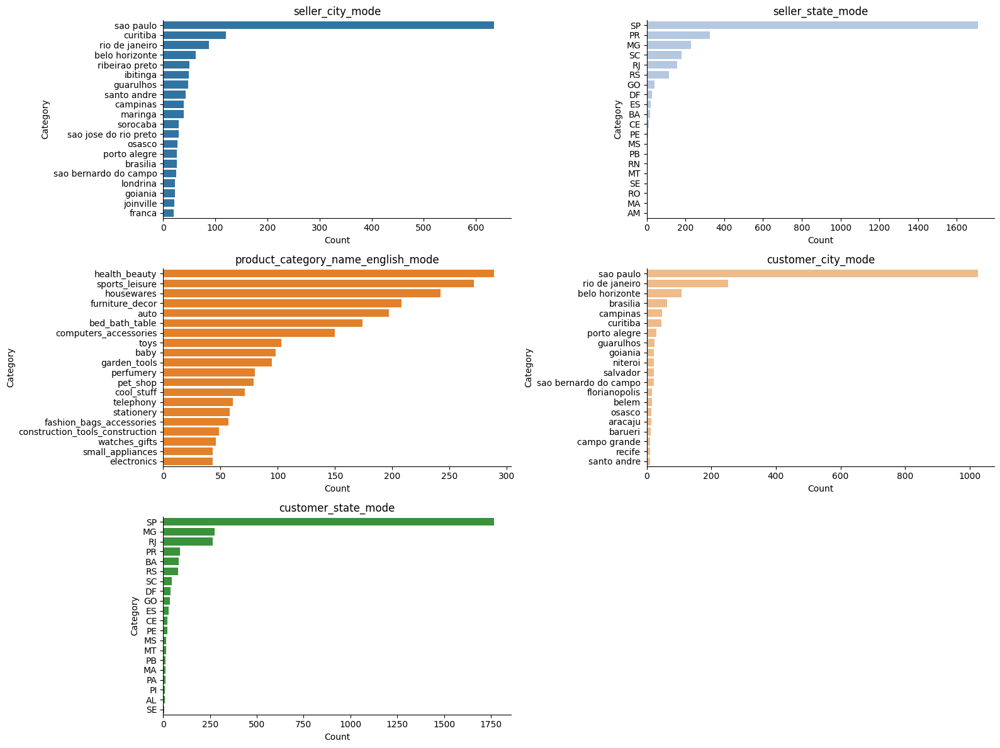

In [204]:
cat_cols = df_agg.select_dtypes(include=['object','category']).columns.tolist()
possible_cat = []

exclude_cols = ['seller_id','order_status_mode','payment_type_mode','churn']
cat_cols = [c for c in cat_cols if c not in exclude_cols]

df_plot = df_agg.copy()
df_plot[cat_cols] = df_plot[cat_cols].astype(str)

n_cols = 2
n_rows = (len(cat_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(16, n_rows * 4))
colors = sns.color_palette("tab20", len(cat_cols))

for i, col in enumerate(cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    if df_plot[col].nunique() == 1 and df_plot[col].unique()[0] == "nan":
        plt.text(0.5, 0.5, "Semua nilai NaN", ha='center', va='center')
        plt.title(col)
        plt.axis("off")
        continue

    freq = df_plot[col].value_counts().head(20)

    sns.barplot(x=freq.values, y=freq.index, color=colors[i-1])
    plt.title(col)
    plt.xlabel("Count")
    plt.ylabel("Category")
    sns.despine()

plt.tight_layout()
plt.show()


Barplot di atas menunjukkan bahwa distribusi fitur kategorik pada level seller sangat imbalanced dan cenderung terpusat pada beberapa kategori dominan.

1. Lokasi Seller (`seller_city_mode` & `seller_state_mode`)

  Beberapa kota besar seperti São Paulo, Rio de Janeiro, dan Belo Horizonte mendominasi distribusi seller. Pada level provinsi, SP (São Paulo) adalah state dengan jumlah seller paling banyak, jauh di atas provinsi lainnya. Hal ini mencerminkan konsentrasi ekosistem e-commerce Brasil yang memang terpusat di wilayah metropolitan besar.

2. Lokasi Customer (`customer_city_mode` & `customer_state_mode`)

  Kota dan provinsi tempat customer terbanyak cenderung sama dengan pola seller—didominasi oleh São Paulo dan Rio de Janeiro. Hal ini menunjukkan adanya market alignment antara konsentrasi seller dan konsentrasi demand dari customer.

3. Kategori Produk (`product_category_name_english_mode`)

  Distribusi kategori produk juga tidak merata. Kategori seperti health_beauty, sports_leisure, housewares, furniture_decor, dan auto adalah yang paling sering muncul sebagai produk utama masing-masing seller. Kategori lain seperti electronics atau small_appliances jumlahnya jauh lebih sedikit. Pola ini memberi gambaran bahwa penawaran produk seller Olist lebih banyak di kategori lifestyle & home.



#### Nunique < 5

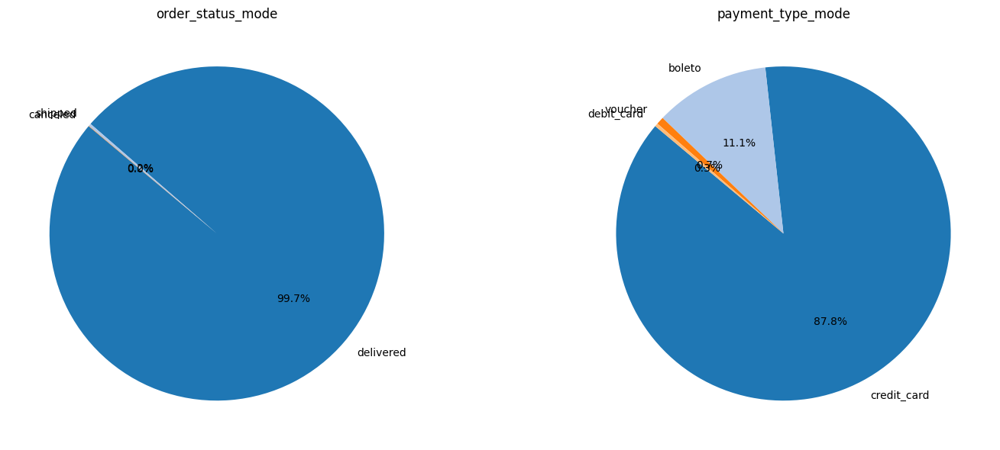

In [205]:
cat_cols = ['order_status_mode', 'payment_type_mode']

df_plot = df_agg.copy()
df_plot[cat_cols] = df_plot[cat_cols].astype(str)

n_cols = 2
n_rows = (len(cat_cols) + n_cols - 1) // n_cols

plt.figure(figsize=(16, n_rows * 6))
colors = sns.color_palette("tab20")

for i, col in enumerate(cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)

    if df_plot[col].nunique() == 1 and df_plot[col].unique()[0] == "nan":
        plt.text(0.5, 0.5, "Semua nilai NaN", ha='center', va='center')
        plt.title(col)
        plt.axis("off")
        continue

    freq = df_plot[col].value_counts().head(20)

    plt.pie(
        freq.values,
        labels=freq.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=colors[:len(freq)]
    )

    plt.title(col)

plt.tight_layout()
plt.show()


1. Order Status Mode

Pie chart menunjukkan bahwa hampir seluruh seller memiliki status pesanan dominan “delivered” (99.7%). Hanya sebagian sangat kecil yang mode-nya “shipped” atau “canceled”.
Hal ini menunjukkan bahwa bagi mayoritas seller, pesanan yang mereka terima dalam riwayat transaksi cenderung berhasil terkirim dan jarang mengalami pembatalan. Kondisi ini wajar dalam marketplace besar, mengingat seller umumnya aktif hanya ketika mereka memang mampu menyelesaikan order.

2. Payment Type Mode

Sebagian besar seller menerima transaksi dengan payment type dominan “credit_card” (87.8%), diikuti oleh “boleto” (~11%), dan sisanya sangat kecil untuk “debit_card” atau “voucher”.
Pola ini konsisten dengan perilaku konsumen di Brasil, di mana kartu kredit merupakan metode pembayaran yang paling umum dalam transaksi e-commerce, sedangkan boleto populer tetapi tidak dominan untuk seluruh seller.

#### Label Churn

/tmp/ipython-input-1410027906.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


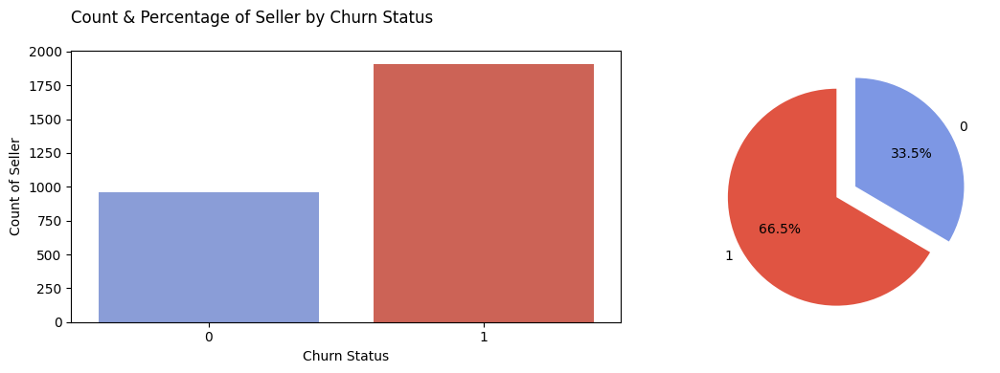

In [206]:
plt.figure(figsize=(12,4))

# --- Left: Barplot ---
plt.subplot(1,2,1)
claim_counts = df_agg['churn'].value_counts().reset_index()
claim_counts.columns = ['churn', 'count']

sns.barplot(
    data=claim_counts,
    x='churn',
    y='count',
    palette={
        '0': '#7D97E4',
        '1': '#E05442'
    }
)

plt.xlabel('Churn Status')
plt.ylabel('Count of Seller')
plt.title('Count & Percentage of Seller by Churn Status\n', loc='left')

# --- Right: Pie Chart ---
plt.subplot(1,2,2)
plt.pie(
    claim_counts['count'],
    labels=claim_counts['churn'],
    autopct='%.1f%%',
    startangle=90,
    colors=['#E05442', '#7D97E4'],
    explode=[0.2, 0.0]
)

plt.tight_layout()
plt.show()


Distribusi target menunjukkan bahwa 66.5% seller termasuk dalam kategori churn, sedangkan hanya 33.5% yang tetap aktif. Hal ini menunjukkan adanya ketidakseimbangan (imbalance) kelas yang cukup signifikan, di mana class churn mendominasi data. Ketidakseimbangan ini harus ditangani sebelum training model karena dapat menyebabkan model bias terhadap class mayoritas dan gagal mengidentifikasi seller yang berisiko churn. Untuk mengatasi masalah ini, perlu diterapkan teknik seperti oversampling atau undersampling.

## **Outlier Detection**
---

Pada analisis ini, outlier akan dideteksi menggunakan metode Persentil dan Winsorization.

Ketika menganalisis data dunia nyata, nilai ekstrem (outlier) dapat mengganggu atau mendistorsi hasil analisis. Meskipun metode IQR banyak digunakan, ada pendekatan praktis lainnya yaitu Metode Persentil. Jika digabungkan dengan Winsorization, metode ini memberikan cara yang lebih seimbang untuk mengurangi pengaruh outlier tanpa membuang data yang berharga.

Apa Itu Persentil?


Persentil membagi data menjadi 100 bagian yang sama. Contohnya:

- Persentil ke-90 berarti 90% data berada di bawah nilai tersebut.

- Persentil ke-50 adalah median.

- Persentil ke-1 adalah batas di mana hanya 1% data yang berada di bawah nilai itu.

Dalam praktiknya, kita dapat menggunakan batas persentil untuk menentukan outlier. Misalnya, perlakukan nilai yang berada di bawah persentil ke-1 dan di atas persentil ke-99 sebagai outlier.

Dua Cara untuk Menangani Outlier
1. Trimming (Menghapus)

Cukup hapus nilai yang berada di luar batas persentil yang telah ditentukan.

2. Winsorization (Membatasi/Capping)

Alih-alih menghapus nilai ekstrem, kita menggantinya dengan nilai batas terdekat.

Contoh:

- Ganti nilai apa pun yang berada di atas persentil ke-95 dengan nilai persentil ke-95 tersebut.

- Ganti nilai apa pun yang berada di bawah persentil ke-5 dengan nilai persentil ke-5 tersebut.

Sumber : [Outlier Handling with Percentile Method and Winsorization](https://medium.com/@morepravin1989/outlier-handling-with-percentile-method-and-winsorization-1b171fbef773)

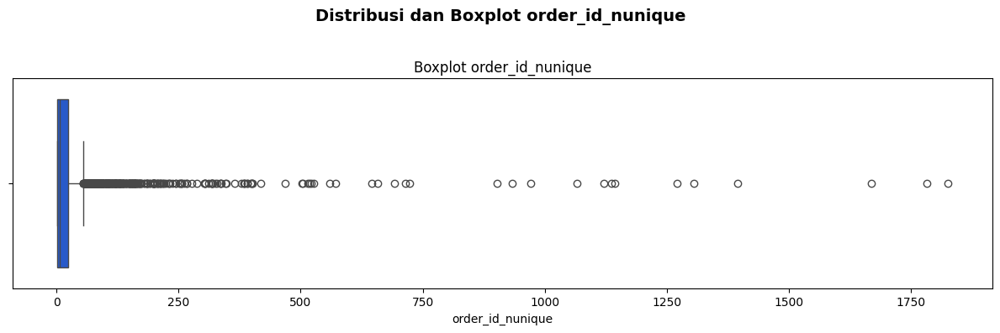

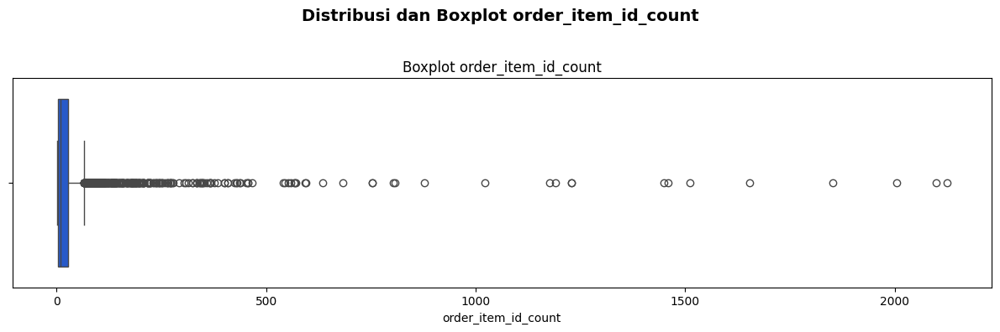

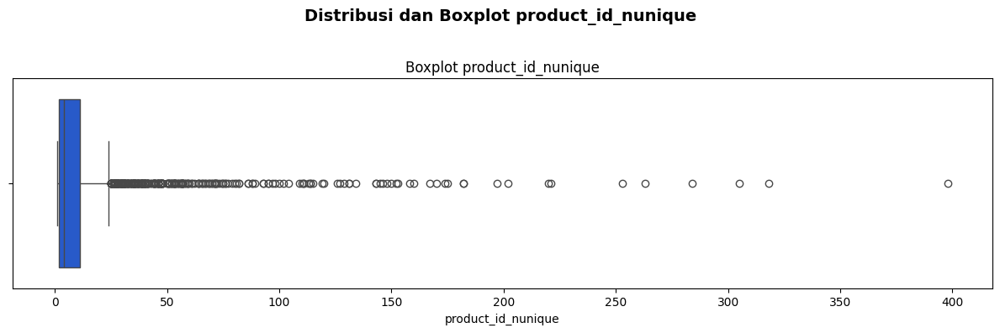

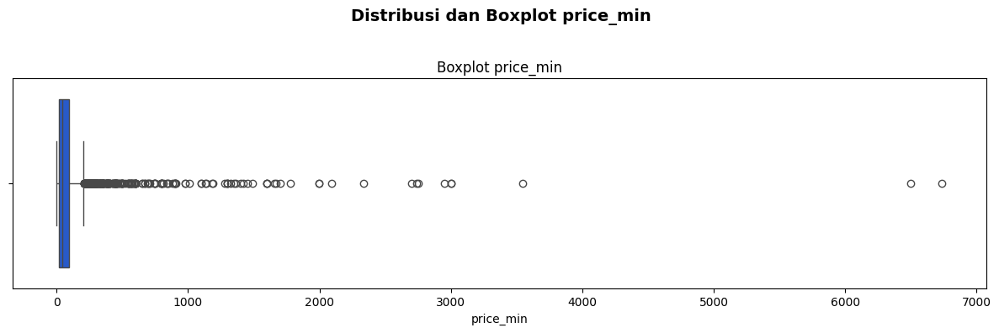

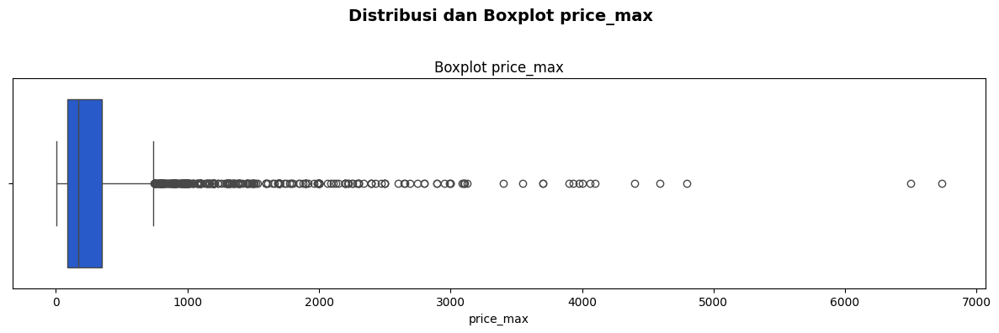

...

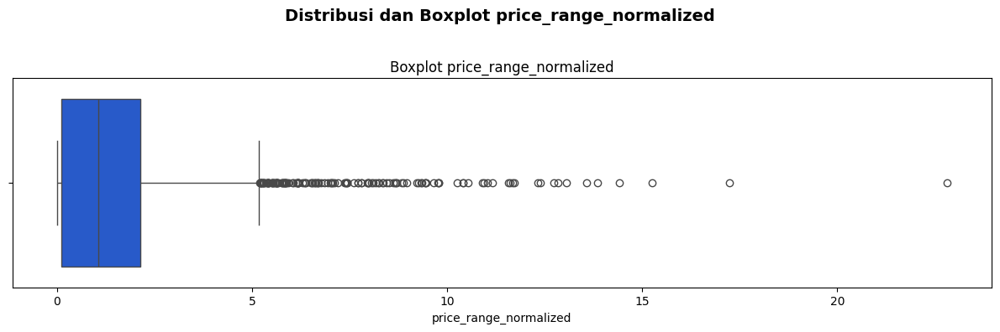

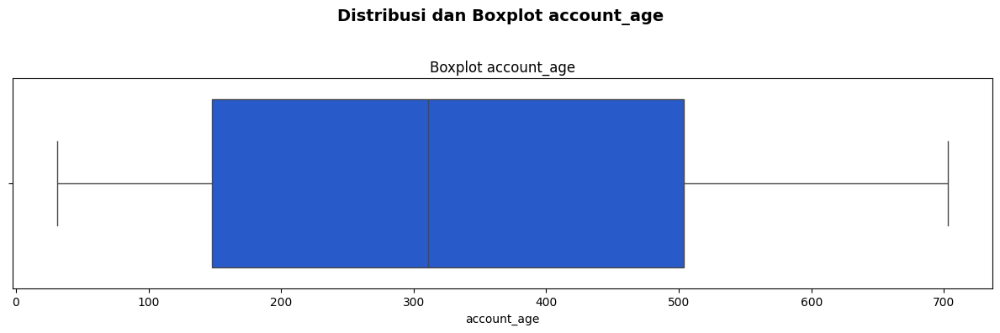

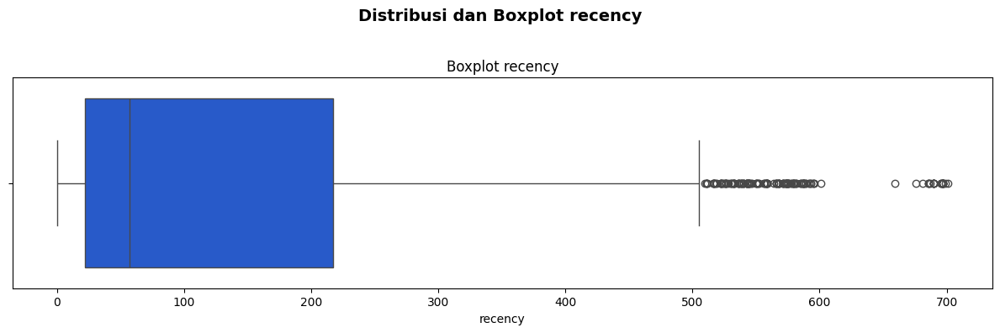

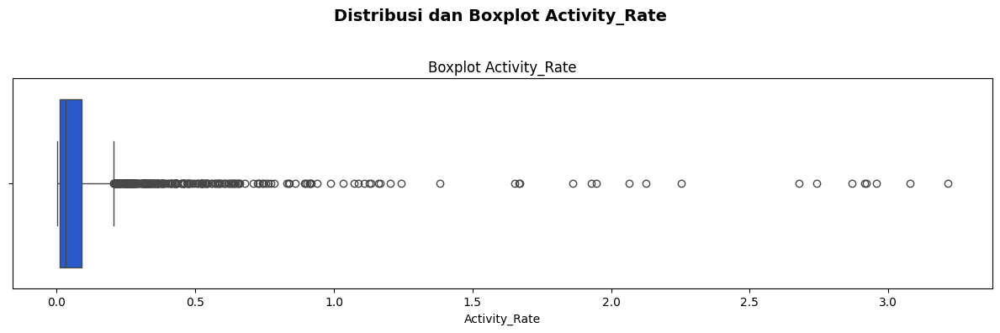

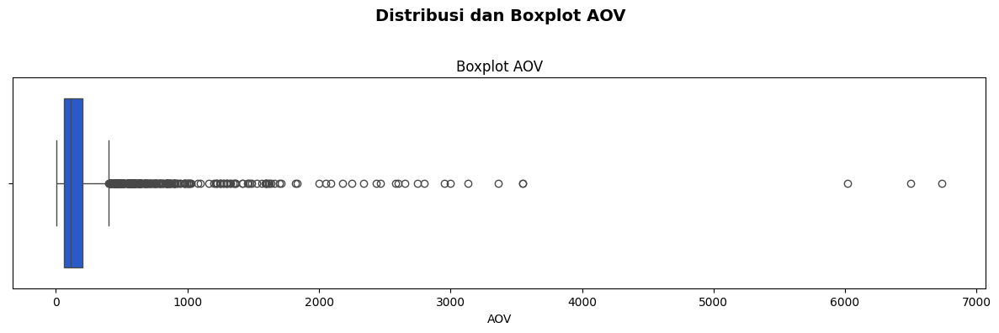

In [207]:
for i in df_agg.select_dtypes('number').drop(columns ='churn'):
    plt.figure(figsize=(12,4))
    plt.suptitle(f"Distribusi dan Boxplot {i}", fontsize=14, fontweight='bold')

    sns.boxplot(data=df_agg, x=i, color="#0D50E4")
    plt.title(f"Boxplot {i}")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [208]:
def winsorize_p99(df: pd.DataFrame):
    df_out = df.copy()

    numeric_cols = df_out.select_dtypes(include='number').columns.tolist()

    exclude_cols = [
        'seller_id',
    ]

    exclude_patterns = [
        'mode',                     # encoding kategori
        'review_score_',                 # skor 1-5
        'product_name_lenght_',          # panjang nama produk
        'product_description_lenght_',   # panjang deskripsi
        'product_photos_qty_',           # jumlah foto
        'buffer',
        'age',
        'recency',
        'churn'
    ]

    cols_cap = []
    for col in numeric_cols:
        if col in exclude_cols:
            continue
        if any(p in col for p in exclude_patterns):
            continue
        cols_cap.append(col)

    for col in cols_cap:
        p99 = df_out[col].quantile(0.99)
        df_out[col] = np.where(df_out[col] > p99, p99, df_out[col])

    return df_out, cols_cap


In [209]:
def plot_before_after_p99(df_before, df_after, col):

    p99 = df_before[col].quantile(0.99)
    n_outliers = (df_before[col] > p99).sum()

    fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

    sns.boxplot(
        x=df_before[col],
        ax=axes[0],
        orient='h'
    )
    axes[0].axvline(p99, color='red', linestyle='--', linewidth=1.5)
    axes[0].set_title(f"Sebelum handling: {col}")
    axes[0].set_xlabel(col)

    axes[0].text(
        0.98, 0.9,
        f"Outlier di atas P99: {n_outliers}",
        transform=axes[0].transAxes,
        ha='right',
        va='top',
        color='red',
        fontsize=9,
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.7)
    )

    sns.boxplot(
        x=df_after[col],
        ax=axes[1],
        orient='h'
    )
    axes[1].set_title(f"Sesudah handling P99: {col}")
    axes[1].set_xlabel(col)

    plt.tight_layout()
    plt.show()


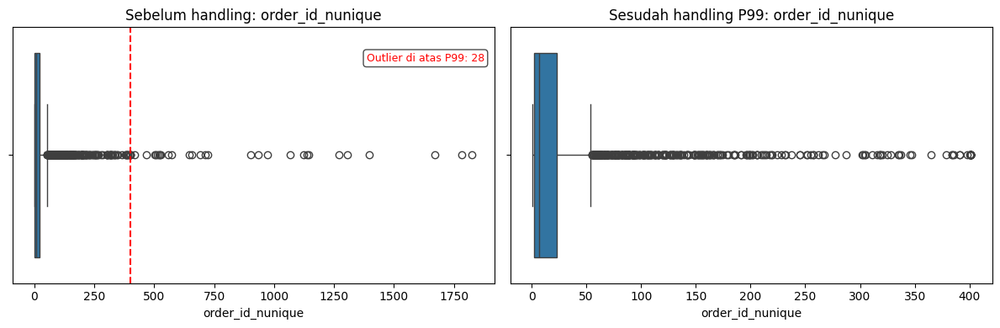

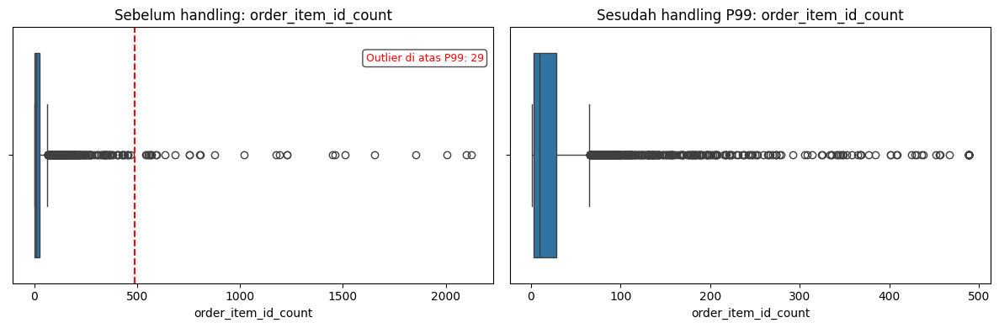

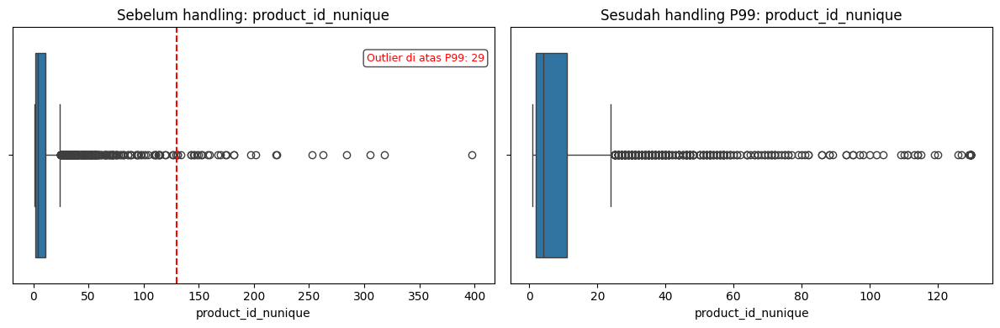

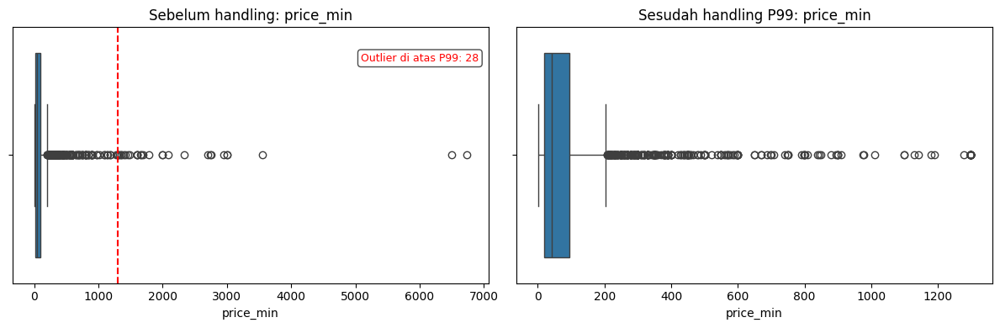

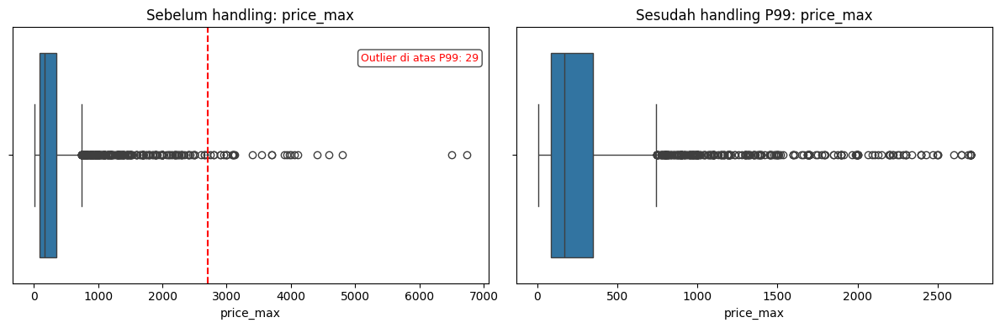

...

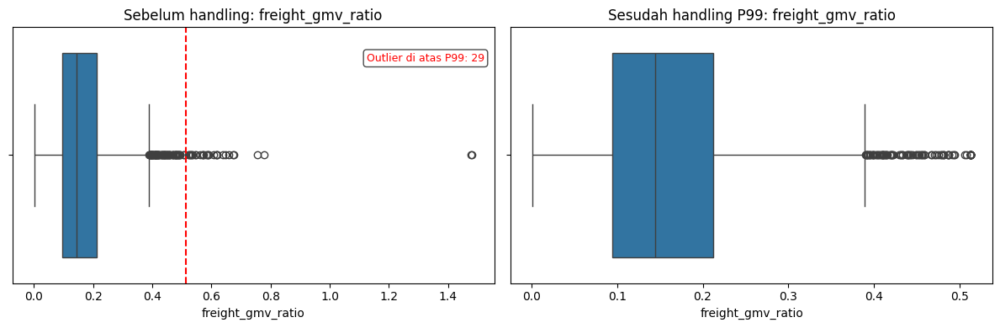

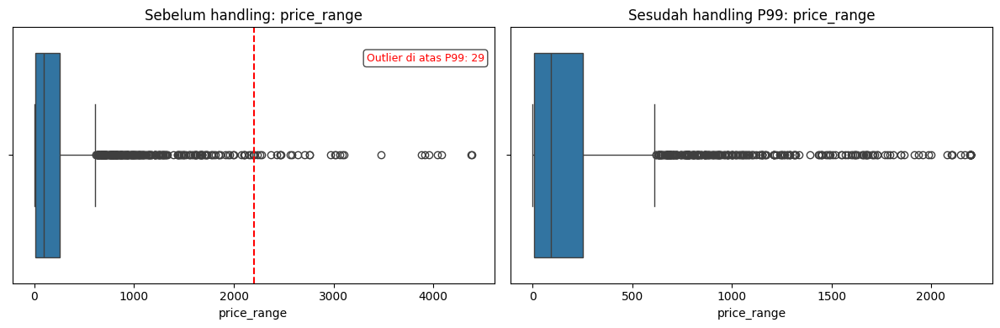

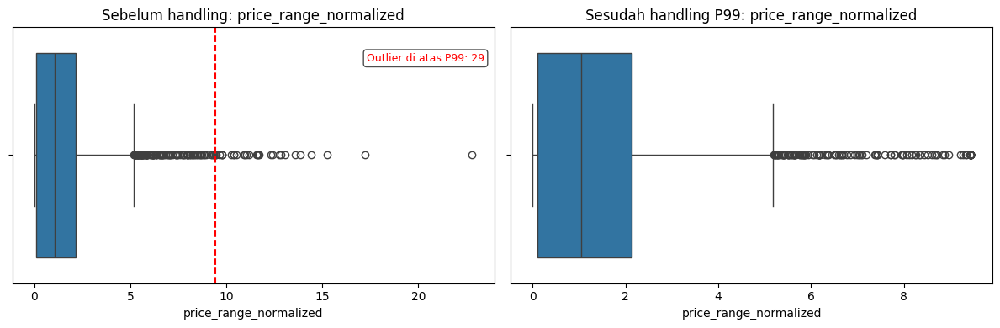

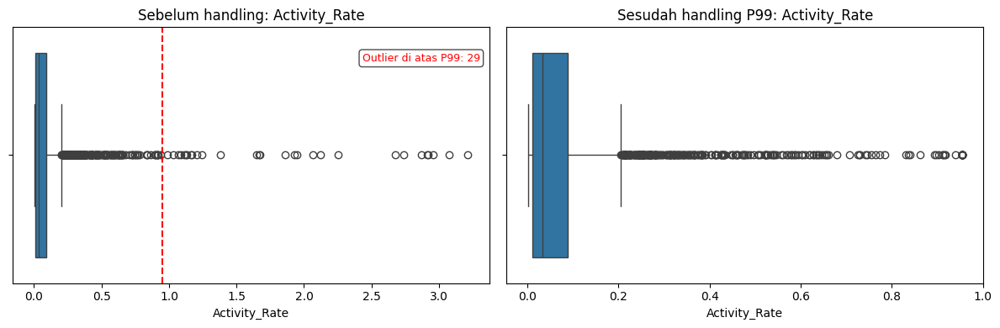

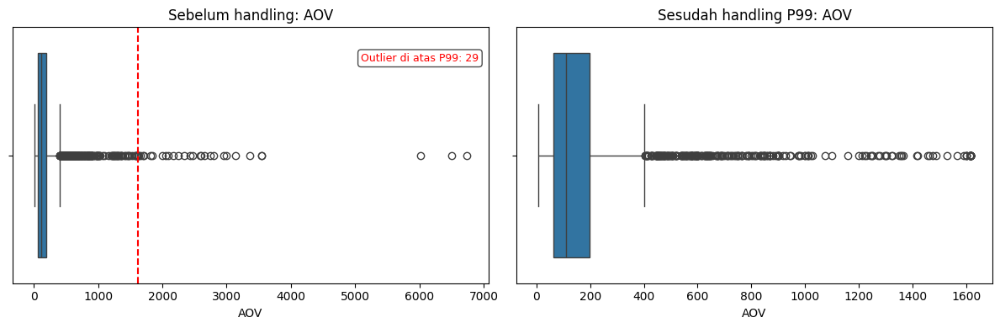

In [210]:
df_clean, cols_cap = winsorize_p99(df_agg)

for col in cols_cap:
    plot_before_after_p99(df_agg, df_clean, col)


In [211]:
df_clean.to_csv("df_clean.csv", index=False)

Fungsi winsorize_p99 menyalin data, memilih semua kolom numerik lalu mengecualikan ID dan kolom tertentu (mode kategori, skor review, panjang nama/deskripsi, jumlah foto, buffer, age, churn), kemudian untuk setiap kolom yang lolos, nilai di atas persentil 99 “dipotong” ke nilai P99 sehingga ekor ekstremnya dipendekkan tanpa menghapus baris. Fungsi plot_before_after_p99 lalu membuat dua boxplot per fitur (sebelum dan sesudah winsorization), menandai garis P99 dan menampilkan jumlah nilai yang sebelumnya berada di atas P99, sehingga kita bisa melihat secara visual bahwa sebaran setelah handling menjadi lebih kompak dan outlier ekstrem berkurang, yang membantu menstabilkan analisis dan pemodelan churn.

## **EDA Bivariat**
---


In [212]:
df_eda = df_clean.copy()

In [213]:
def plot_churn_box(df_eda, cols, ncols=3, suptitle=None):
    cols = [c for c in cols if c in df_eda.columns]
    n = len(cols)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axes = np.array(axes).reshape(-1)

    for ax, col in zip(axes, cols):
        df_eda.boxplot(column=col, by='churn', ax=ax)
        ax.set_title(col)
        ax.set_xlabel("")
        ax.set_ylabel(col)

    for ax in axes[len(cols):]:
        ax.axis("off")

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.show()


def plot_churn_hist(df_eda, cols, ncols=3, bins=40, suptitle=None):
    cols = [c for c in cols if c in df_eda.columns]
    n = len(cols)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
    axes = np.array(axes).reshape(-1)

    for ax, col in zip(axes, cols):
        for cval in sorted(df_eda['churn'].unique()):
            subset = df_eda[df_eda['churn'] == cval][col].dropna()
            ax.hist(subset, bins=bins, alpha=0.5, label=f"churn={cval}")
        ax.set_title(col)
        ax.set_xlabel(col)
        ax.set_ylabel("Frequency")
        ax.legend()

    for ax in axes[len(cols):]:
        ax.axis("off")

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)
    plt.tight_layout()
    plt.show()


#### EDA Churn - Fitur Jarak & Logistik

In [214]:
def eda_jarak_logistik(df_eda):
    cols_jarak = [
        'seller_customer_distance_km_min',
        'seller_customer_distance_km_max',
        'seller_customer_distance_km_mean',
        'seller_customer_distance_km_median',
        'freight_value_min',
        'freight_value_max',
        'freight_value_mean',
        'freight_value_sum',
        'freight_value_median'
        'seller_lead_time_approval_hours_min',
        'seller_lead_time_approval_hours_max',
        'seller_lead_time_approval_hours_mean',
        'seller_lead_time_approval_hours_median'
        'seller_buffer_time_days_min',
        'seller_buffer_time_days_max',
        'seller_buffer_time_days_mean',
        'seller_buffer_time_days_median'
    ]

    cols_jarak = [c for c in cols_jarak if c in df_eda.columns]

    if not cols_jarak:
        print("⚠️ Tidak ada kolom fitur jarak/logistik di df_eda.")
        return

    print("Ringkasan statistik fitur jarak & logistik per churn")
    print(df_eda.groupby("churn")[cols_jarak].describe().T)

    # Boxplot 1
    if "seller_customer_distance_km_mean" in df_eda.columns:
        plt.figure(figsize=(6,4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="seller_customer_distance_km_mean"
        )
        plt.title("Average Distance by Churn Status")
        plt.tight_layout()
        plt.show()

    # Boxplot 2
    if "freight_value_mean" in df_eda.columns:
        plt.figure(figsize=(6,4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="freight_value_mean"
        )
        plt.title("Freight Value Mean per Churn Status")
        plt.tight_layout()
        plt.show()

    # Correlation Heatmap
    plt.figure(figsize=(10,8))
    sns.heatmap(df_eda[cols_jarak].corr(), annot=False)
    plt.title("Korelasi Fitur Jarak & Logistik")
    plt.tight_layout()
    plt.show()


Ringkasan statistik fitur jarak & logistik per churn
churn                                           0            1
seller_customer_distance_km_min count  961.000000  1910.000000
                                mean    94.756192   303.490702
                                std    165.542864   419.215972
                                min      0.000000     0.000000
                                25%      5.751753    20.771998
...                                           ...          ...
seller_buffer_time_days_median  min     -5.500000   -46.000000
                                25%      2.000000     1.000000
                                50%      3.000000     3.000000
                                75%      4.000000     4.000000
                                max     17.000000    29.000000

[104 rows x 2 columns]


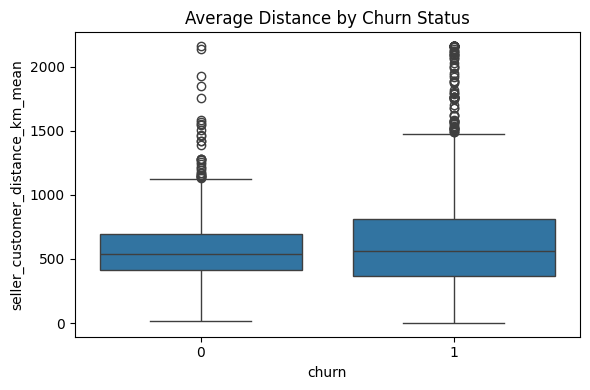

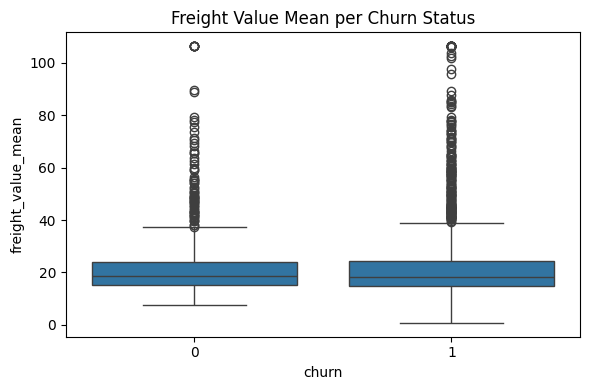

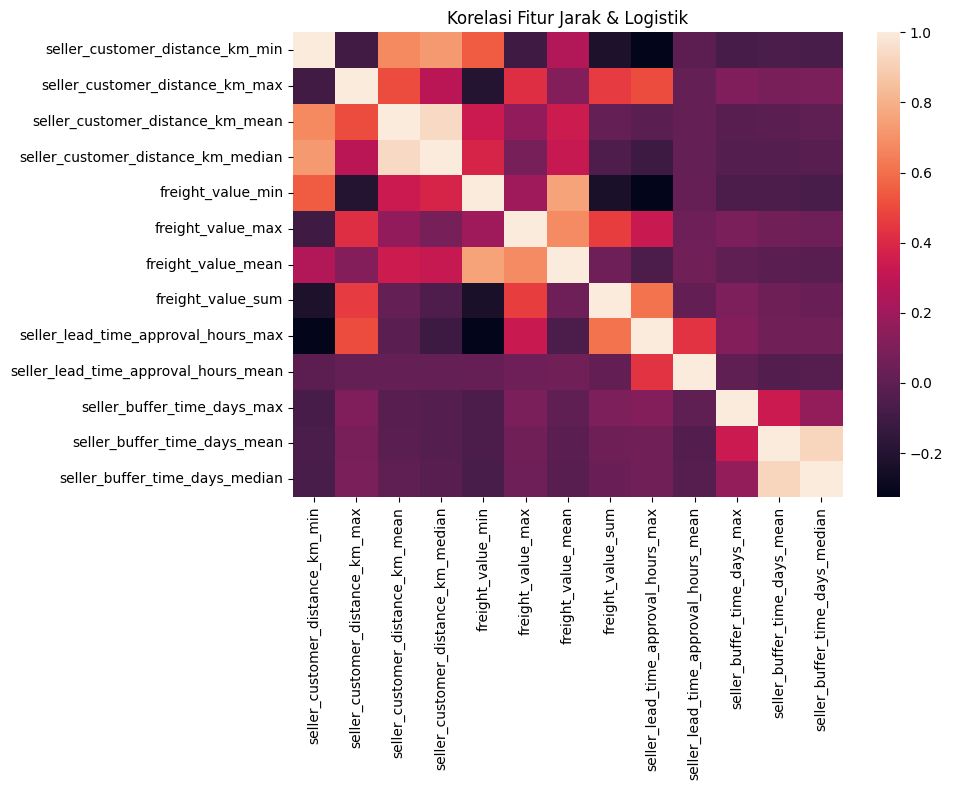

In [215]:
eda_jarak_logistik(df_eda)

Visualisasi ini menunjukkan pola jelas: seller yang churn cenderung memiliki jarak median pelanggan lebih jauh dan biaya freight rata-rata lebih tinggi, menandakan tantangan logistik yang lebih berat. Heatmap korelasi memperlihatkan bahwa fitur jarak, freight, dan buffer time saling berkaitan dan membentuk satu klaster perilaku pengiriman yang kuat. Ringkasan statistik memperkuat gambaran bahwa seller churn biasanya beroperasi dengan jarak lebih panjang, variasi pengiriman lebih ekstrem, dan buffer time lebih sempit atau negatif, sehingga risiko keterlambatan dan biaya logistik meningkat—faktor yang tampaknya berkontribusi pada keputusan churn.


#### EDA Churn - Fitur Review Responsiveness

In [216]:
def eda_review_responsiveness(df):
    cols_review = [
        "review_response_window_days_min",
        "review_response_window_days_max",
        "review_response_window_days_mean",
        "review_response_window_days_median",
        "review_response_first_days_min",
        "review_response_first_days_max",
        "review_response_first_days_mean",
        "review_response_first_days_median",
        "review_response_last_days_min",
        "review_response_last_days_max",
        "review_response_last_days_mean",
        "review_response_last_days_median",
        "review_score_min",
        "review_score_max",
        "review_score_mean",
        "review_score_median"
    ]

    cols_review = [c for c in cols_review if c in df.columns]

    print("Ringkasan statistik fitur review responsiveness per churn")
    print(df_eda.groupby("churn")[cols_review].describe().T)

    # Respons pertama vs churn
    if "review_response_first_days_mean" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="review_response_first_days_mean"
        )
        plt.title("Waktu Respons Pertama Review (mean) per Churn")
        plt.xlabel("Churn")
        plt.ylabel("First Response Days (mean)")
        plt.tight_layout()
        plt.show()

    # Skor review vs churn
    if "review_score_mean" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="review_score_mean"
        )
        plt.title("Skor Review (mean) per Churn")
        plt.xlabel("Churn")
        plt.ylabel("Review Score Mean")
        plt.tight_layout()
        plt.show()

    # Korelasi antar fitur review
    if cols_review:
        plt.figure(figsize=(10, 8))
        corr = df_eda[cols_review].corr()
        sns.heatmap(corr, annot=False)
        plt.title("Korelasi Fitur Review Responsiveness")
        plt.tight_layout()
        plt.show()


Ringkasan statistik fitur review responsiveness per churn
churn                             0         1
review_score_min    count     961.0    1910.0
                    mean    1.69719  2.691099
                    std    1.233593  1.693322
                    min         1.0       1.0
                    25%         1.0       1.0
                    50%         1.0       3.0
                    75%         2.0       4.0
                    max         5.0       5.0
review_score_max    count     961.0    1910.0
                    mean   4.988554  4.736649
                    std    0.140216  0.810013
                    min         2.0       1.0
                    25%         5.0       5.0
                    50%         5.0       5.0
                    75%         5.0       5.0
                    max         5.0       5.0
review_score_mean   count     961.0    1910.0
                    mean   4.163157  4.109433
                    std    0.492125  0.906663
                    mi

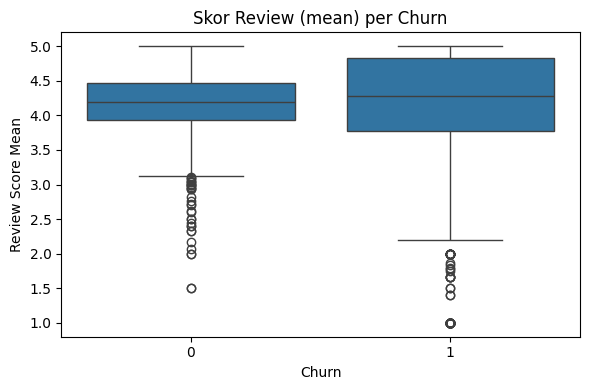

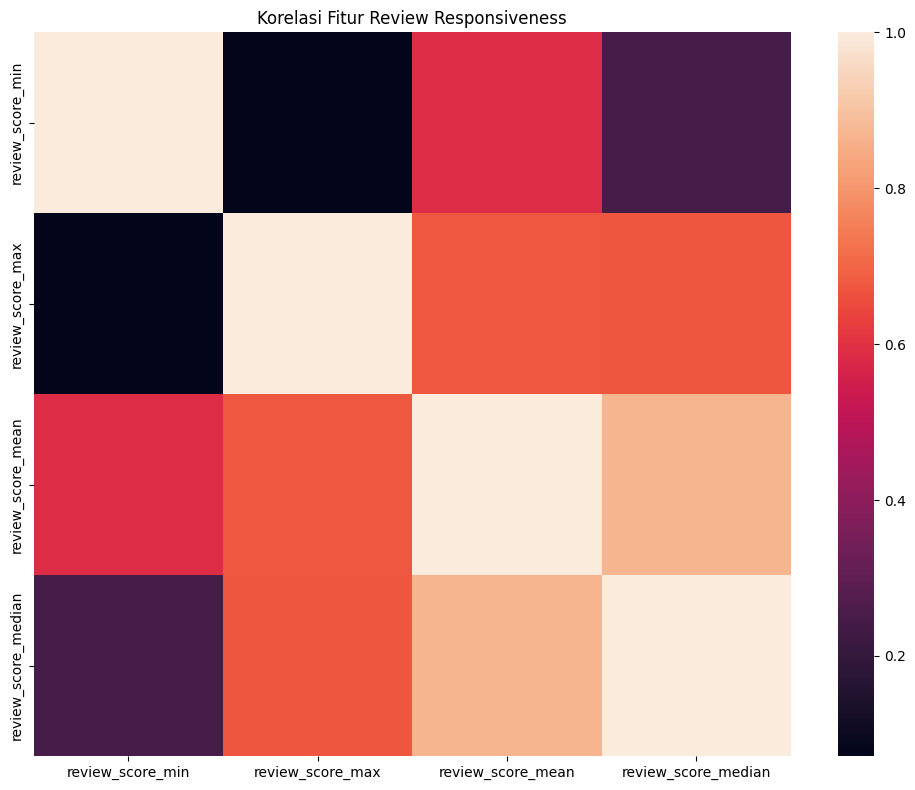

In [217]:
eda_review_responsiveness(df_eda)

Plot dan statistik menunjukkan bahwa seller yang churn umumnya merespons review lebih lambat dan memiliki rentang waktu respons yang lebih panjang, menandakan penurunan keterlibatan terhadap pelanggan. Korelasi antarfitur memperlihatkan klaster kuat antara kecepatan respons dan kualitas review, sementara skor review rata-rata seller churn cenderung sedikit lebih rendah dan lebih bervariasi. Pola ini menggambarkan bahwa responsivitas dan kualitas layanan berperan penting: ketika seller mulai jarang menjawab review atau memberikan pengalaman kurang konsisten, risiko churn meningkat.


#### EDA Churn - Fitur Product-Order Behavior

In [218]:
def eda_product_order_behavior(df_eda):
    cols_product_order = [
        "order_id_nunique",
        "order_item_id_count",
        "product_id_nunique",
        "avg_items_per_order",
        "product_weight_g_min",
        "product_weight_g_max",
        "product_weight_g_mean",
        "product_weight_g_median",
        "product_length_cm_min",
        "product_length_cm_max",
        "product_length_cm_mean",
        "product_length_cm_median",
        "product_height_cm_min",
        "product_height_cm_max",
        "product_height_cm_mean",
        "product_height_cm_median",
        "product_width_cm_min",
        "product_width_cm_max",
        "product_width_cm_mean",
        "product_width_cm_median",
        "product_photos_qty_min",
        "product_photos_qty_max",
        "product_photos_qty_mean",
        "product_photos_qty_median",
        "product_name_lenght_min",
        "product_name_lenght_max",
        "product_name_lenght_mean",
        "product_name_lenght_median",
        "product_description_lenght_min",
        "product_description_lenght_max",
        "product_description_lenght_mean",
        "product_description_lenght_median"
    ]

    cols_product_order = [c for c in cols_product_order if c in df.columns]

    print("Ringkasan statistik fitur product-order behavior per churn")
    print(df_eda.groupby("churn")[cols_product_order].describe().T)

    # Variasi produk vs churn
    if "product_id_nunique" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="product_id_nunique"
        )
        plt.title("Variasi Produk per Seller vs Churn")
        plt.xlabel("Churn")
        plt.ylabel("Jumlah Unique Produk")
        plt.tight_layout()
        plt.show()

    # Rata-rata item per order vs churn
    if "avg_items_per_order" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="avg_items_per_order"
        )
        plt.title("Rata-Rata Item per Order vs Churn")
        plt.xlabel("Churn")
        plt.ylabel("Avg Items per Order")
        plt.tight_layout()
        plt.show()

    # Panjang deskripsi dan nama produk vs churn
    for col in ["product_name_lenght_mean", "product_description_lenght_mean"]:
        if col in df_eda.columns:
            plt.figure(figsize=(6, 4))
            sns.boxplot(
                data=df_eda,
                x="churn",
                y=col
            )
            plt.title(f"{col} per Churn")
            plt.xlabel("Churn")
            plt.ylabel(col)
            plt.tight_layout()
            plt.show()


Ringkasan statistik fitur product-order behavior per churn
churn                               0            1
avg_items_per_order count  961.000000  1910.000000
                    mean     1.183688     1.209051
                    std      0.264198     0.396572
                    min      1.000000     1.000000
                    25%      1.023256     1.000000
                    50%      1.113924     1.000000
                    75%      1.230769     1.234610
                    max      3.000000     3.000000


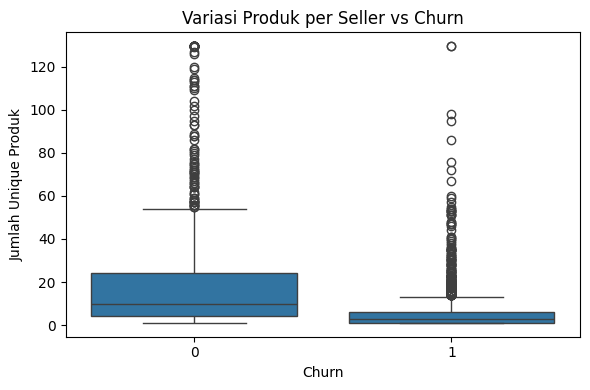

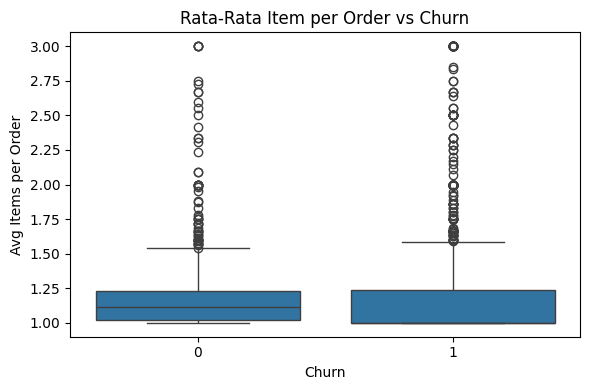

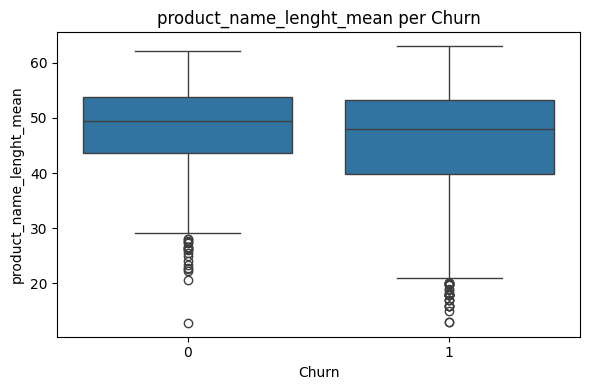

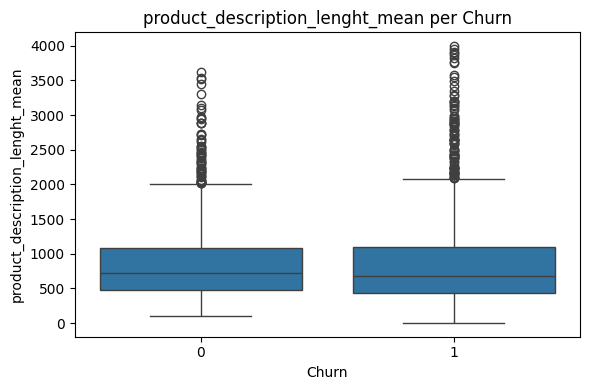

In [219]:
eda_product_order_behavior(df_eda)

Gambaran produk dan perilaku order memperlihatkan pola kontras antara seller aktif dan seller churn: seller churn umumnya menawarkan jauh lebih sedikit variasi produk dan memiliki volume order yang lebih kecil, menandakan skala usaha yang lebih rendah. Rerata item per order relatif mirip, namun seller yang bertahan cenderung memiliki nama dan deskripsi produk yang lebih konsisten panjangnya, yang mengindikasikan katalog yang lebih rapi dan informatif. Statistik ringkas memperkuat bahwa seller churn beroperasi dengan portofolio sempit, transaksi rendah, dan konten produk yang kurang kuat, kombinasi yang membuat daya saing mereka lebih rapuh dan memicu risiko churn.


#### EDA Churn - Fitur Harga & Variasi Produk

In [220]:
def eda_harga_variasi(df):
    cols_price = [
        "price_min",
        "price_max",
        "price_mean",
        "price_median",
        "price_sum",
        "price_range",
        "price_range_normalized",
        "freight_gmv_ratio",
        "gmv_per_order",
        "gmv_per_customer",
        "payment_value_min",
        "payment_value_max",
        "payment_value_mean",
        "payment_value_median",
        "payment_value_sum"
    ]

    cols_price = [c for c in cols_price if c in df.columns]

    print("Ringkasan statistik fitur harga & variasi per churn")
    print(df_eda.groupby("churn")[cols_price].describe().T)

    # Price range vs churn
    if "price_range" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="price_range"
        )
        plt.title("Price Range per Churn")
        plt.xlabel("Churn")
        plt.ylabel("Price Range")
        plt.tight_layout()
        plt.show()

    # Freight GMV ratio vs churn
    if "freight_gmv_ratio" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="freight_gmv_ratio"
        )
        plt.title("Freight/GMV Ratio per Churn")
        plt.xlabel("Churn")
        plt.ylabel("Freight GMV Ratio")
        plt.tight_layout()
        plt.show()

    # GMV per order vs churn
    if "gmv_per_order" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="gmv_per_order"
        )
        plt.title("GMV per Order per Churn")
        plt.xlabel("Churn")
        plt.ylabel("GMV per Order")
        plt.tight_layout()
        plt.show()

    # Korelasi harga dan GMV
    if cols_price:
        plt.figure(figsize=(10, 8))
        corr = df_eda[cols_price].corr()
        sns.heatmap(corr, annot=False)
        plt.title("Korelasi Fitur Harga & GMV")
        plt.tight_layout()
        plt.show()


Ringkasan statistik fitur harga & variasi per churn
churn                               0             1
price_min         count    961.000000   1910.000000
                  mean      59.251415    116.147099
                  std      101.242253    203.451779
                  min        1.200000      0.850000
                  25%       16.490000     24.625000
...                               ...           ...
payment_value_sum min       74.860000     15.220000
                  25%     1199.640000    229.347500
                  50%     4306.840000    826.075000
                  75%    12200.730000   2689.427500
                  max    78346.479000  78346.479000

[120 rows x 2 columns]


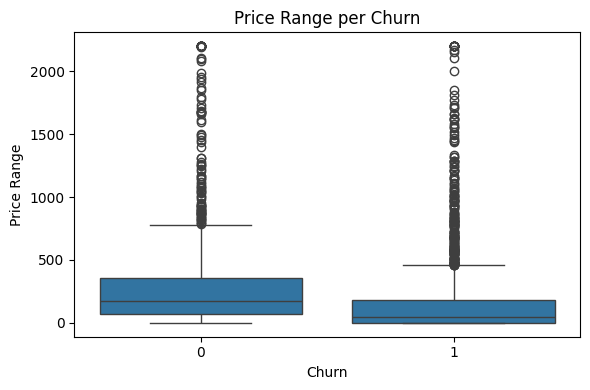

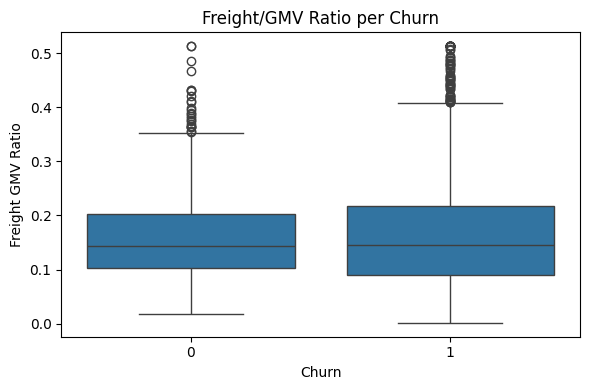

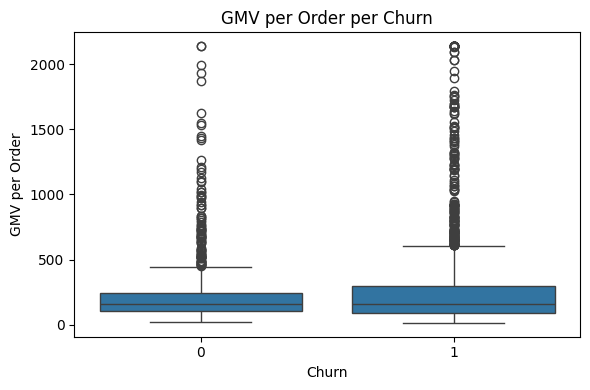

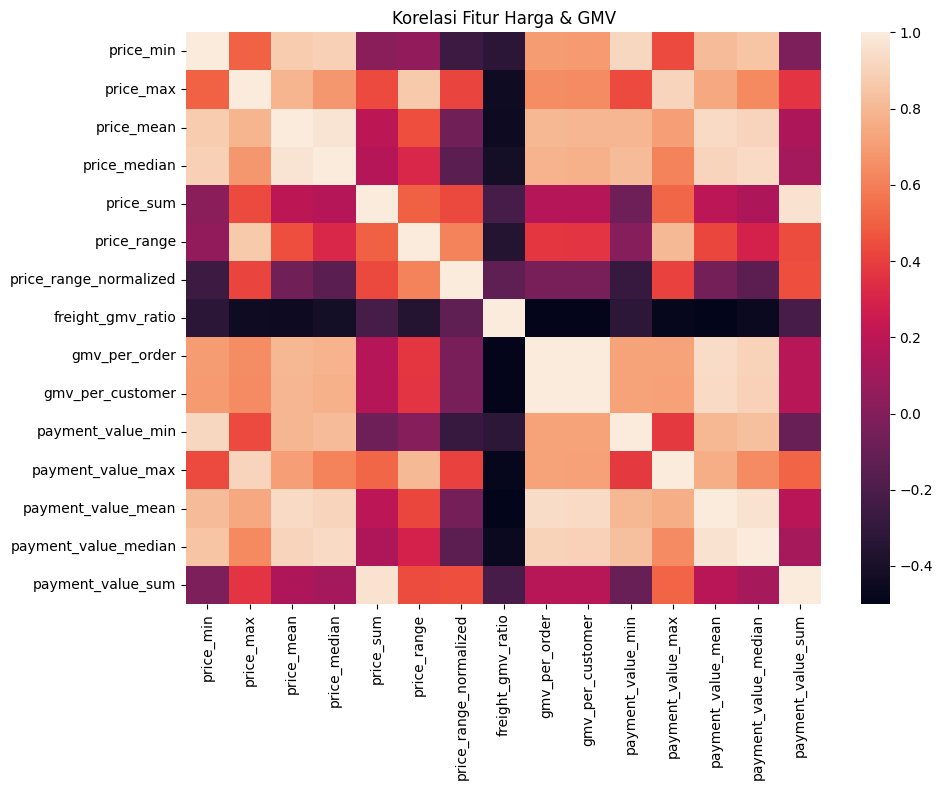

In [221]:
eda_harga_variasi(df_eda)

Gambaran harga dan nilai transaksi menunjukkan bahwa seller churn cenderung memiliki rentang harga yang lebih tidak stabil, rasio biaya kirim terhadap GMV yang sedikit lebih tinggi, serta GMV per order yang lebih tersebar dan tidak konsisten. Kombinasi variasi harga yang kurang rapi, efisiensi logistik yang rendah, dan performa transaksi yang tidak stabil ini mencerminkan struktur bisnis yang rapuh, sehingga seller lebih rentan mengalami churn.

#### EDA Churn - Fitur Aktivitas

In [222]:
def eda_aktivitas_recency(df):
    cols_aktivitas = [
        "account_age",
        "Activity_Rate",
        "AOV",
    ]

    cols_aktivitas = [c for c in cols_aktivitas if c in df.columns]

    print("Ringkasan statistik fitur aktivitas & recency per churn")
    print(df_eda.groupby("churn")[cols_aktivitas].describe().T)

    # Activity rate vs churn
    if "Activity_Rate" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="Activity_Rate"
        )
        plt.title("Activity Rate per Churn")
        plt.xlabel("Churn")
        plt.ylabel("Activity Rate")
        plt.tight_layout()
        plt.show()

    # AOV vs churn
    if "AOV_mean" in df_eda.columns:
        plt.figure(figsize=(6, 4))
        sns.boxplot(
            data=df_eda,
            x="churn",
            y="AOV"
        )
        plt.title("AOV per Churn")
        plt.xlabel("Churn")
        plt.ylabel("AOV")
        plt.tight_layout()
        plt.show()


Ringkasan statistik fitur aktivitas & recency per churn
churn                          0            1
account_age   count   961.000000  1910.000000
              mean    284.525494   349.189529
              std     194.256734   188.118797
              min      31.000000    32.000000
              25%     117.000000   181.000000
              50%     238.000000   339.500000
              75%     427.000000   525.000000
              max     703.000000   703.000000
Activity_Rate count   961.000000  1910.000000
              mean      0.184777     0.037122
              std       0.212993     0.065787
              min       0.003373     0.001427
              25%       0.053398     0.006944
              50%       0.101911     0.017699
              75%       0.214286     0.039386
              max       0.953625     0.911330
AOV           count   961.000000  1910.000000
              mean    163.715411   203.023402
              std     194.308033   277.260213
              min      1

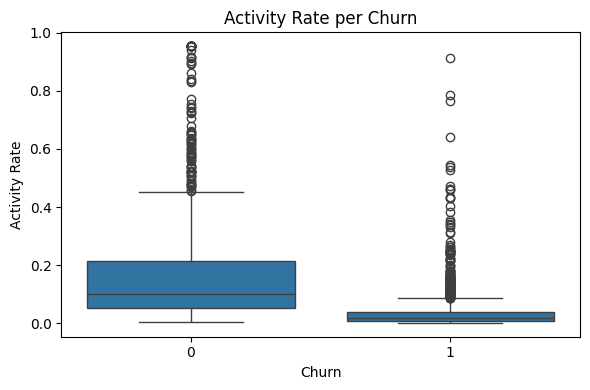

In [223]:
eda_aktivitas_recency(df_eda)

Seller churn terlihat jauh lebih jarang bertransaksi dan memiliki jeda aktivitas yang sangat panjang, tercermin dari activity rate yang mendekati nol. Dibandingkan seller yang bertahan, yang masih menunjukkan pola transaksi rutin dan aktivitas stabil, seller churn tampak berhenti beroperasi secara bertahap: akunnya lebih tua, jeda transaksi makin panjang, dan frekuensi order makin menurun. Kombinasi penurunan ritme aktivitas dan makin jarangnya interaksi ini menciptakan pola “senyap bertahap” yang sangat khas sebelum seller akhirnya churn.


#### EDA Churn - Fitur Geografis

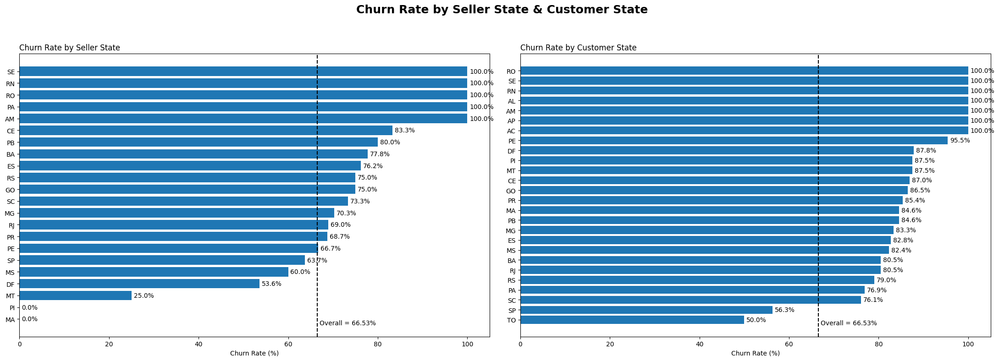

In [224]:
overall_churn_rate = df_agg['churn'].mean() * 100

fig, axes = plt.subplots(1, 2, figsize=(22, 8))
fig.suptitle("Churn Rate by Seller State & Customer State", fontsize=18, fontweight='bold')

#   Churn rate seller_state_mode
churn_rate_seller_state = (
    df_agg.groupby('seller_state_mode')['churn']
    .mean()
    .sort_values() * 100
)

axes[0].barh(churn_rate_seller_state.index, churn_rate_seller_state.values)
axes[0].set_title("Churn Rate by Seller State", loc='left')
axes[0].set_xlabel("Churn Rate (%)")

# Label tiap bar
for i, v in enumerate(churn_rate_seller_state.values):
    axes[0].text(v + 0.5, i, f"{v:.1f}%", va='center')

# Garis churn keseluruhan
axes[0].axvline(overall_churn_rate, linestyle='--', color='black')
axes[0].text(overall_churn_rate + 0.5, -0.5,
             f"Overall = {overall_churn_rate:.2f}%", fontsize=10)


# Churn — customer_state_mode
churn_rate_customer_state = (
    df_eda.groupby('customer_state_mode')['churn']
    .mean()
    .sort_values() * 100
)

axes[1].barh(churn_rate_customer_state.index, churn_rate_customer_state.values)
axes[1].set_title("Churn Rate by Customer State", loc='left')
axes[1].set_xlabel("Churn Rate (%)")

for i, v in enumerate(churn_rate_customer_state.values):
    axes[1].text(v + 0.5, i, f"{v:.1f}%", va='center')

axes[1].axvline(overall_churn_rate, linestyle='--', color='black')
axes[1].text(overall_churn_rate + 0.5, -0.5,
             f"Overall = {overall_churn_rate:.2f}%", fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()



Pola churn berdasarkan lokasi terlihat sangat timpang: sejumlah state seller seperti SE, RN, RO, PA, dan AM mencatat churn 100%, menunjukkan lingkungan operasional yang amat rapuh atau basis seller yang kecil dan tidak stabil. Di sisi lain, beberapa state seperti DF, MS, MT, PI, dan MA memiliki churn jauh lebih rendah, bahkan mendekati nol pada PI dan MA, menandakan kondisi pasar yang lebih kondusif atau komunitas seller yang lebih mapan. Pola serupa muncul pada sisi customer—sekelompok state menampilkan churn hampir sempurna, sementara beberapa wilayah seperti TO dan SP jauh lebih rendah. Ketimpangan ekstrem ini menyiratkan bahwa faktor geografis mempengaruhi risiko churn secara kuat, baik dari sisi supply (seller) maupun demand (customer), menciptakan zona-zona rawan churn dan zona-zona yang lebih stabil di dalam ekosistem.

In [225]:
def eda_geografis(df):
    # Churn rate per seller_state
    if "seller_state_mode" in df.columns:
        churn_by_state = (
            df_eda.groupby("seller_state_mode")["churn"]
            .mean()
            .sort_values(ascending=False)
        )

        plt.figure(figsize=(10, 5))
        churn_by_state.plot(kind="bar")
        plt.title("Churn Rate per Seller State")
        plt.xlabel("Seller State")
        plt.ylabel("Churn Rate")
        plt.tight_layout()
        plt.show()

    # Churn rate per customer_state
    if "customer_state_mode" in df_eda.columns:
        churn_by_cust_state = (
            df_eda.groupby("customer_state_mode")["churn"]
            .mean()
            .sort_values(ascending=False)
        )

        plt.figure(figsize=(10, 5))
        churn_by_cust_state.plot(kind="bar")
        plt.title("Churn Rate per Customer State")
        plt.xlabel("Customer State")
        plt.ylabel("Churn Rate")
        plt.tight_layout()
        plt.show()

    # Crosstab seller vs customer state
    if "seller_state_mode" in df_eda.columns and "customer_state_mode" in df_eda.columns:
        ct = pd.crosstab(
            df_eda["seller_state_mode"],
            df_eda["customer_state_mode"]
        )
        plt.figure(figsize=(10, 8))
        sns.heatmap(ct, annot=False)
        plt.title("Distribusi Seller State vs Customer State")
        plt.tight_layout()
        plt.show()


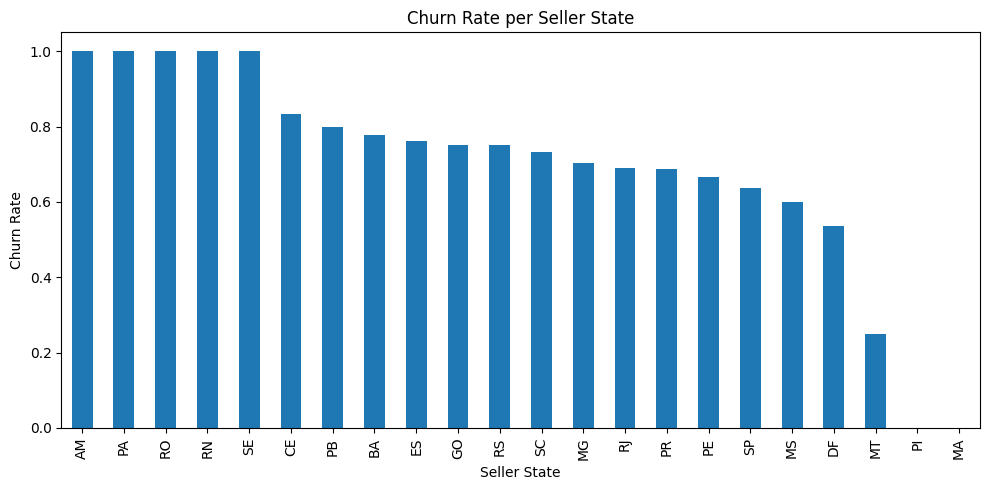

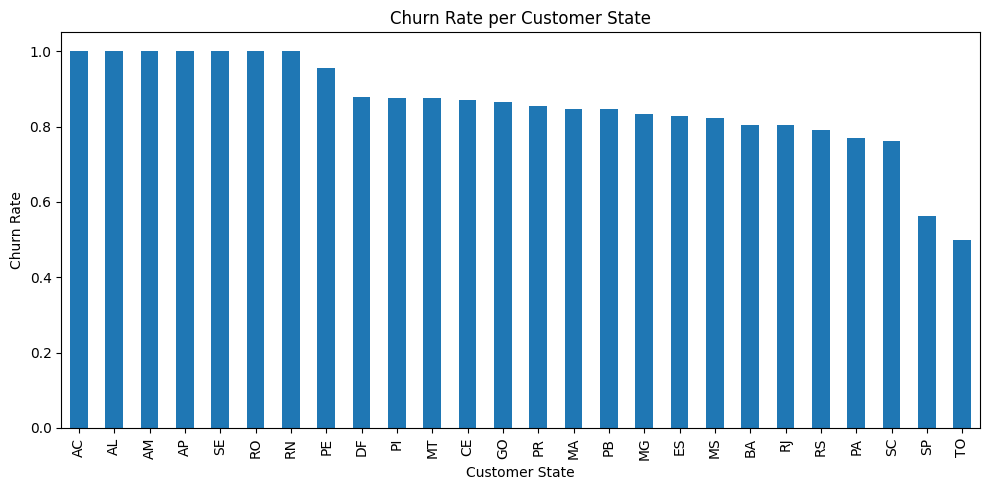

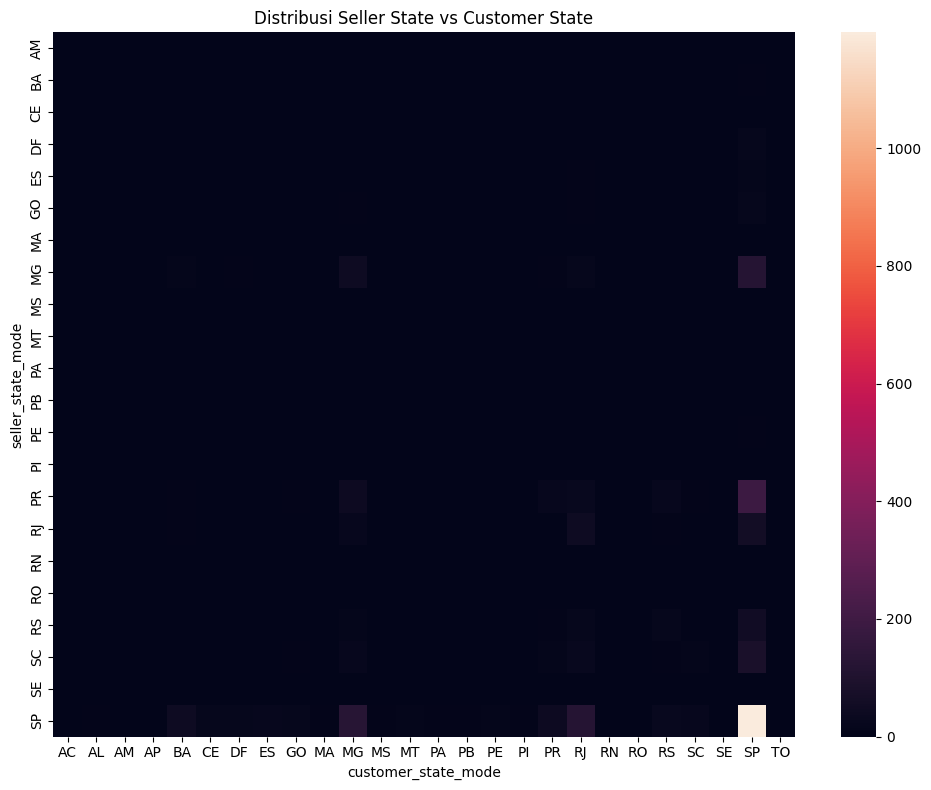

In [226]:
eda_geografis(df_eda)

Secara geografis, churn sangat tinggi dan tidak merata: banyak seller dan customer state mencatat churn mendekati 1 (misalnya AM, PA, RO, RN, SE di sisi seller serta beberapa state di sisi customer), sementara hanya sedikit wilayah seperti DF, MT, PI, dan MA yang menunjukkan churn lebih rendah dan tampak lebih stabil. Heatmap distribusi seller-customer state menunjukkan transaksi terkonsentrasi pada beberapa pasangan wilayah saja, sehingga risiko churn pun cenderung terlokalisasi pada klaster-klaster geografis tertentu.



#### EDA Ongkir vs Harga vs Churn

In [227]:
def eda_interaksi_freight_price(df_eda):
    if "freight_value_mean" in df_eda.columns and "price_mean" in df_eda.columns:
        plt.figure(figsize=(7, 6))
        sns.scatterplot(
            data=df_eda,
            x="price_mean",
            y="freight_value_mean",
            hue="churn",
            alpha=0.7
        )
        plt.title("Interaksi Harga vs Ongkir per Churn")
        plt.tight_layout()
        plt.show()


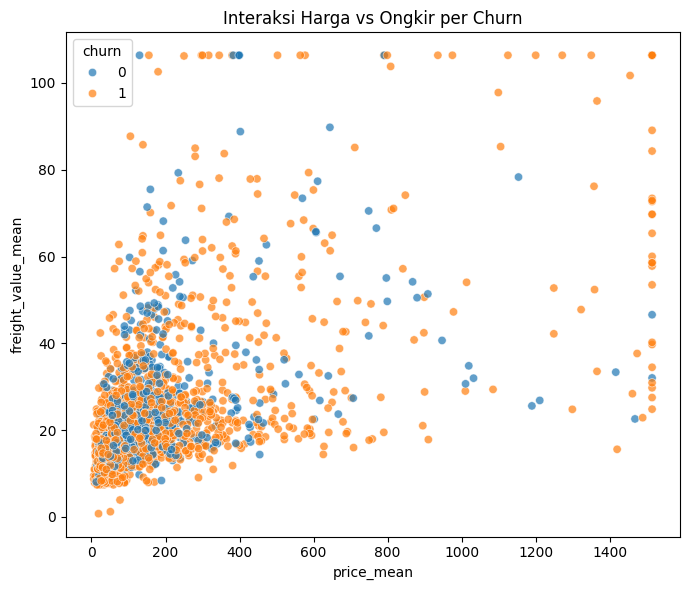

In [228]:
eda_interaksi_freight_price(df_eda)

Pola harga dan ongkir menunjukkan bahwa seller churn banyak muncul pada area harga rendah-menengah dengan ongkir yang tetap tinggi, sehingga margin makin tipis dan transaksi kurang menarik untuk dipertahankan. Seller yang bertahan cenderung tersebar lebih stabil, termasuk pada kombinasi harga lebih tinggi dengan ongkir yang lebih terkontrol. Interaksi ini menandakan bahwa ketidakseimbangan antara harga produk dan biaya logistik menjadi salah satu faktor yang memperbesar risiko churn.


#### Aktivitas vs Recency vs Churn

In [229]:
def eda_interaksi_activity_recency(df_eda):
    if "Activity_Rate" in df_eda.columns and "recency" in df_eda.columns:
        plt.figure(figsize=(7, 6))
        sns.scatterplot(
            data=df_eda,
            x="Activity_Rate",
            y="recency",
            hue="churn",
            alpha=0.7
        )
        plt.title("Interaksi Activity Rate vs Recency per Churn")
        plt.tight_layout()
        plt.show()


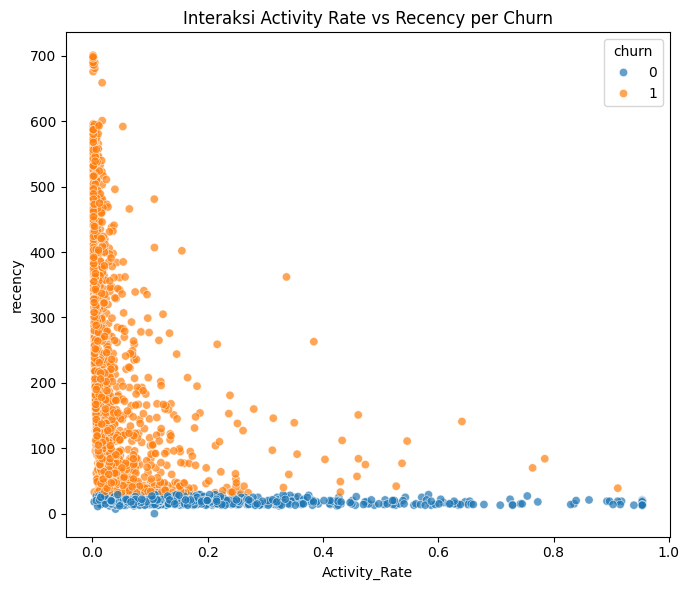

In [230]:
eda_interaksi_activity_recency(df_eda)

Pola interaksi aktivitas dan recency sangat jelas: seller churn terkumpul kuat pada area activity rate hampir nol dengan recency yang sangat tinggi, menandakan mereka sudah lama tidak bertransaksi. Seller yang bertahan justru berada di zona aktivitas lebih rutin dengan recency rendah. Kombinasi “aktivitas menurun + jeda transaksi makin panjang” menjadi sinyal paling kuat yang membedakan seller churn dari seller aktif.


#### EDA Distribusi Per Fitur dalam Bentuk Density / KDE

In [231]:
def eda_kde(df_eda, col):
    if col in df_eda.columns:
        plt.figure(figsize=(6,4))
        sns.kdeplot(data=df_eda, x=col, hue="churn", common_norm=False, fill=True)
        plt.title(f"KDE Plot {col} per Churn")
        plt.tight_layout()
        plt.show()


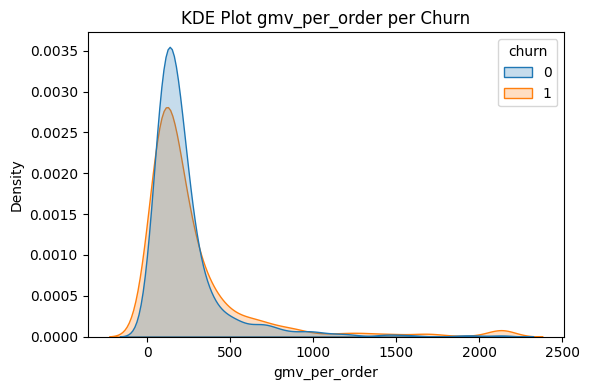

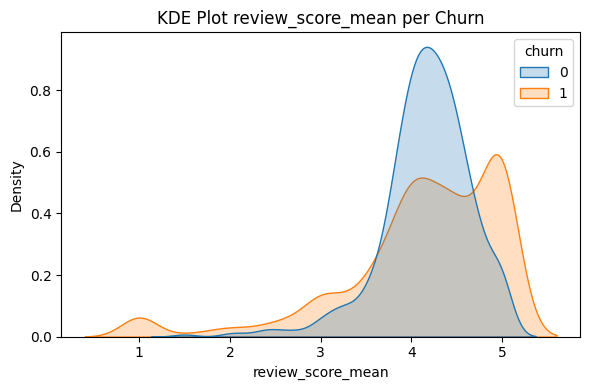

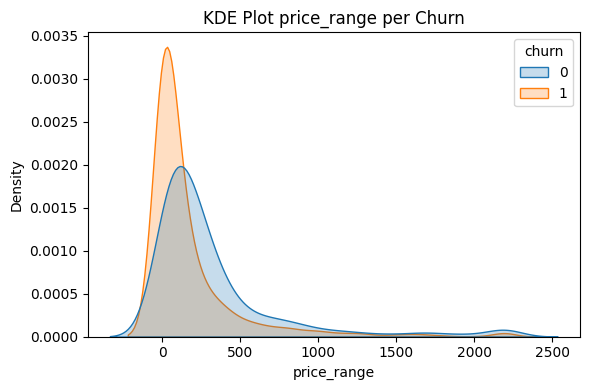

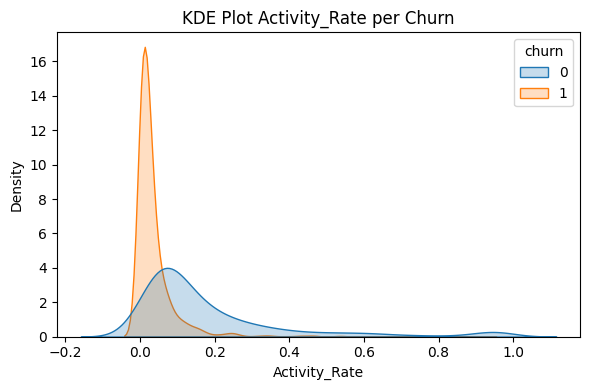

In [232]:
eda_kde(df_eda, "gmv_per_order")
eda_kde(df_eda, "review_score_mean")
eda_kde(df_eda, "price_range")
eda_kde(df_eda, "Activity_Rate")


#### EDA Korelasi dengan Target (Point Biserial Correlation)

In [233]:


def eda_point_biserial(df_eda):
    numeric_cols = df_eda.select_dtypes(include=[np.number]).columns
    numeric_cols = [c for c in numeric_cols if c not in ["churn"]]

    rows = []
    for col in numeric_cols:
        corr, p = pointbiserialr(df_eda["churn"], df_eda[col])
        rows.append((col, corr, p))

    corr_df = pd.DataFrame(rows, columns=["feature", "biserial_corr", "pvalue"])
    corr_df = corr_df.sort_values("biserial_corr", ascending=False)

    print(corr_df.head(20))
    return corr_df


In [234]:
eda_point_biserial(df_eda.drop(columns='recency'))

                                   feature  biserial_corr        pvalue
59        seller_review_response_hours_min       0.293313  4.563764e-58
23                        review_score_min       0.288915  2.563732e-56
55         seller_customer_distance_km_min       0.267372  3.430592e-48
8                        freight_value_min       0.237058  5.798508e-38
14                payment_installments_min       0.194487  7.215433e-26
18                       payment_value_min       0.192871  1.849301e-25
47                   product_height_cm_min       0.175519  2.688993e-21
66  seller_lead_time_approval_hours_median       0.166971  2.137051e-19
58      seller_customer_distance_km_median       0.159638  7.618250e-18
77                             account_age       0.158467  1.327801e-17
31          product_description_lenght_min       0.158239  1.478927e-17
27                 product_name_lenght_min       0.157194  2.416412e-17
3                                price_min       0.150866  4.411

,feature,biserial_corr,pvalue
59,seller_review_response_hours_min,0.293313,4.563764e-58
23,review_score_min,0.288915,2.563732e-56
55,seller_customer_distance_km_min,0.267372,3.430592e-48
8,freight_value_min,0.237058,5.798508e-38
14,payment_installments_min,0.194487,7.215433e-26
...,...,...,...
1,order_item_id_count,-0.342117,1.222426e-79
0,order_id_nunique,-0.346691,7.154707e-82
13,customer_id_nunique,-0.346691,7.154707e-82
2,product_id_nunique,-0.360952,4.464600e-89


Hasil korelasi biserial memperlihatkan bahwa Activity_Rate memiliki korelasi negatif paling besar besar (≈ −0,46) serta kelompok fitur lain seperti banyaknya product yang dijual, banyaknya customer, banyaknya order, response seller terhadap review.

#### EDA Seller Behaviour Category

In [235]:
def eda_cat_activity(df_eda):
    bins = [0, 0.2, 0.5, 0.8, 1.0]
    labels = ["Low", "Medium", "High", "Very High"]

    if "Activity_Rate" not in df_eda.columns:
        return

    df_eda["activity_cat"] = pd.cut(df_eda["Activity_Rate"], bins=bins, labels=labels)

    cohort_churn = df_eda.groupby("activity_cat")["churn"].mean()

    cohort_churn.plot(kind="bar", figsize=(7, 4))
    plt.title("Churn Rate per Activity Cohort")
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-1018767579.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cohort_churn = df_eda.groupby("activity_cat")["churn"].mean()


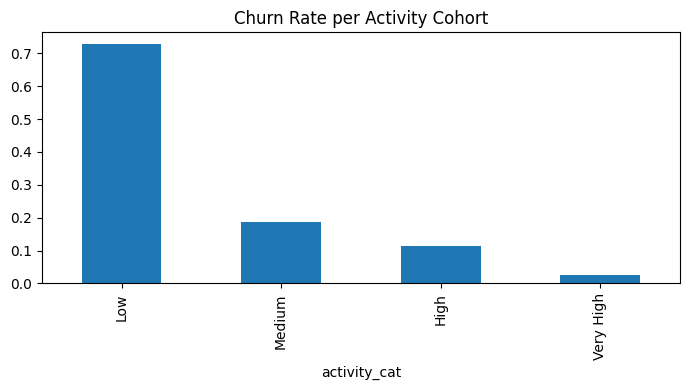

In [236]:
eda_cat_activity(df_eda)

Pembagian kategori aktivitas memperlihatkan perbedaan churn yang sangat jelas: kelompok aktivitas rendah menunjukkan tingkat churn tertinggi, sementara kelompok sangat aktif hampir tidak mengalami churn. Pola ini menegaskan bahwa frekuensi keterlibatan dalam transaksi adalah indikator kesehatan seller yang sangat sensitif—semakin rendah tingkat aktivitas, semakin besar kemungkinan perusahaan kehilangan seller tersebut.


#### EDA Stabilitas Seller

In [237]:
def eda_stability(df_eda):
    cols = []
    for var in ["price", "payment_value", "gmv_per_order"]:
        for m in ["min", "max", "mean"]:
            col = f"{var}_{m}"
            if col in df_eda.columns:
                cols.append(col)

    if not cols:
        return

    df_eda["stability_index"] = df_eda[[c for c in cols if "max" in c]].mean(axis=1) - \
                                df_eda[[c for c in cols if "min" in c]].mean(axis=1)

    plt.figure(figsize=(6,4))
    sns.boxplot(data=df_eda, x="churn", y="stability_index")
    plt.title("Stability Index per Churn")
    plt.tight_layout()
    plt.show()


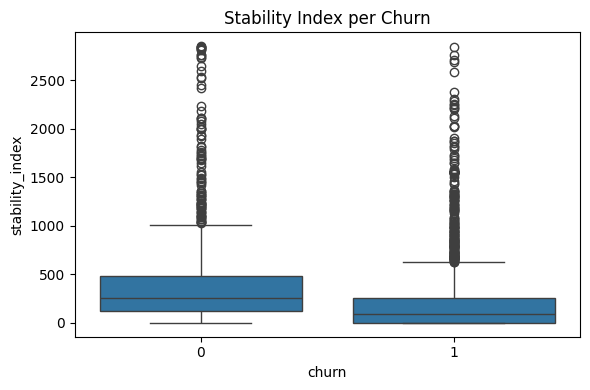

In [238]:
eda_stability(df_eda)

Berdasarkan boxplot di atas, terlihat bahwa seller yang tidak churn (churn = 0) memiliki stability index yang lebih tinggi dibandingkan seller yang churn (churn = 1). Stability index yang lebih tinggi menunjukkan adanya selisih yang besar antara nilai transaksi minimum dan maksimum, sehingga perilaku penjualan seller cenderung lebih fluktuatif dari waktu ke waktu. Sebaliknya, seller yang churn memiliki stability index yang lebih rendah, yang berarti nilai transaksi mereka lebih stabil dan konsisten. Ini mengindikasikan bahwa fluktuasi penjualan bukan merupakan faktor yang mendorong seller untuk churn, justru seller yang tetap aktif cenderung memiliki variasi nilai transaksi yang lebih besar.

#### EDA Kategori Produk vs Churn

In [239]:
def eda_category_churn(df_eda):
    if "product_category_name_english_mode" not in df_eda.columns:
        return

    cat_churn = (
        df_eda.groupby("product_category_name_english_mode")["churn"]
        .mean()
        .sort_values(ascending=False)
    )

    cat_churn.head(20).plot(kind="bar", figsize=(10,5))
    plt.title("Kategori Produk dengan Churn Tertinggi")
    plt.tight_layout()
    plt.show()


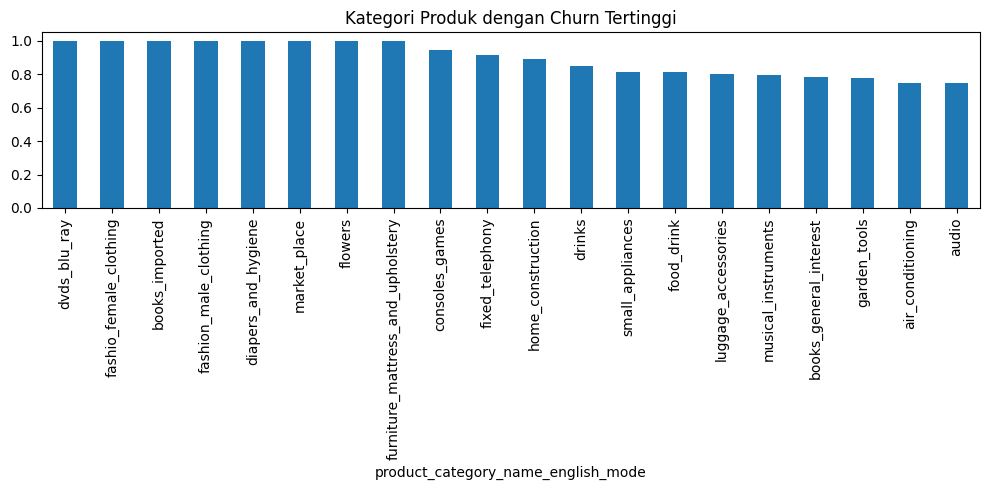

In [240]:
eda_category_churn(df_eda)

Kategori produk dengan churn tertinggi didominasi oleh segmen yang permintaannya rendah, musiman, atau sangat niche—seperti DVD/Blu-ray, fashion tertentu, perlengkapan bayi, bunga, hingga konsol dan peralatan rumah tangga spesifik. Pola ini menunjukkan bahwa kategori yang tidak memiliki volume penjualan stabil atau cenderung berputar lambat lebih rentan membuat seller keluar dari ekosistem. Segmen produk yang pasar dan siklus hidupnya tidak menentu mendorong risiko churn lebih besar dibanding kategori yang memiliki permintaan luas dan berulang.


## **Multicollinearity Check**
---

Pada tahap ini, kami melakukan pengecekan multikolinearitas untuk memastikan bahwa fitur-fitur yang digunakan dalam model tidak saling berhubungan terlalu kuat. Multikolinearitas yang tinggi dapat menyebabkan model menjadi tidak stabil dan membuat interpretasi menjadi kurang akurat.

In [241]:
drop_cols = ['seller_id','order_delivered_carrier_date_min','order_delivered_carrier_date_max','recency','churn']

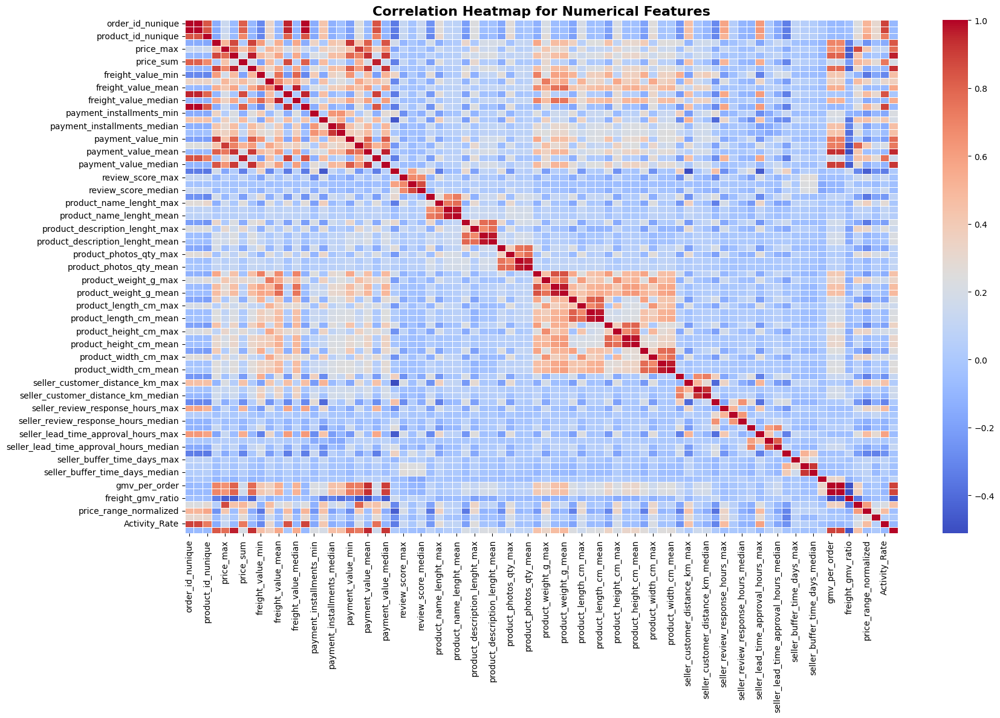

In [242]:
cols_to_drop = [col for col in drop_cols if col in df_clean.columns]
df_corr = df_clean.drop(columns=cols_to_drop)

numeric_cols = df_corr.select_dtypes(include=['int64', 'float64'])

corr = numeric_cols.corr()

plt.figure(figsize=(18, 12))
sns.heatmap(
    corr,
    cmap="coolwarm",
    annot=False,
    fmt=".2f",
    linewidths=0.5
)

plt.title("Correlation Heatmap for Numerical Features", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [243]:
numeric_cols = numeric_cols.apply(lambda col: pd.to_numeric(col, errors='coerce')).astype(float)

In [244]:
# Buat dataframe untuk VIF
vif_data = pd.DataFrame()
vif_data["feature"] = numeric_cols.columns
vif_data["VIF"] = [
    variance_inflation_factor(numeric_cols.values, i)
    for i in range(numeric_cols.shape[1])
]

vif_data = vif_data.sort_values("VIF", ascending=False).reset_index(drop=True)

def style_vif_table(df, vif_threshold=12):
    def highlight_vif(val):
        if val > vif_threshold:
            return "background-color: #f8d7da; color: black;"
        return "color: black;"

    return (
        df.style
        .applymap(highlight_vif, subset=["VIF"])
        .format({"VIF": "{:.2f}"})
    )
vif_threshold = 12
style_vif_table(vif_data, vif_threshold=vif_threshold)


/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/tmp/ipython-input-531970436.py:19: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(highlight_vif, subset=["VIF"])


,feature,VIF
0,order_id_nunique,inf
1,customer_id_nunique,inf
2,product_name_lenght_mean,1503.83
3,product_name_lenght_median,622.21
4,gmv_per_order,562.26
5,review_score_mean,489.38
6,gmv_per_customer,485.45
7,product_width_cm_mean,340.65
8,product_length_cm_mean,330.90
9,order_item_id_count,245.81


Tabel di atas menunjukkan bahwa terdapat multikolinearitas pada data, artinya ada fitur-fitur numerik yang saling berkorelasi tinggi.

Meskipun Variance Inflation Factor (VIF) merupakan metode umum untuk mengevaluasi multikolinearitas, kami tidak langsung menghapus fitur hanya berdasarkan nilai VIF. Alasannya adalah:
beberapa fitur mungkin memiliki nilai VIF tinggi, tetapi tetap memberikan kontribusi penting secara independen terhadap target. Menghapus fitur tersebut hanya karena VIF bisa menyebabkan hilangnya informasi yang relevan.

Untuk itu, kami menggabungkan dua metrik:

1. Nilai VIF: untuk mendeteksi multikolinearitas antar fitur.

2. Skor SelectKBest: untuk menilai signifikansi setiap fitur terhadap target.

In [245]:
# FUNGSI HITUNG VIF
def calculate_vif(df):
    df_num = df.apply(pd.to_numeric, errors='coerce').astype(float)
    vif_df = pd.DataFrame()
    vif_df["feature"] = df_num.columns
    vif_df["VIF"] = [
        variance_inflation_factor(df_num.values, i)
        for i in range(df_num.shape[1])
    ]
    return vif_df

**Mengapa VIF Penting?**

VIF digunakan untuk mendeteksi **multikolinearitas**, yaitu kondisi ketika beberapa fitur saling menjelaskan satu sama lain sehingga informasi menjadi tumpang tindih.

Dampak multikolinearitas terhadap model:

1. **Koefisien menjadi tidak stabil**
   Model kesulitan menentukan variabel mana yang benar-benar berpengaruh.
2. **Interpretasi fitur menjadi tidak akurat**
   Koefisien dapat berubah tanda atau nilainya tidak konsisten.
3. **Overfitting meningkat**
   Fitur redundan menambah kompleksitas tanpa menambah informasi.
4. **Generalization melemah**
   Model tampak baik di training, tetapi buruk di data baru.

Karena itu VIF penting untuk memastikan model bekerja pada fitur yang tidak saling tumpang tindih.

**Rumus VIF**

Variance Inflation Factor dihitung dengan mengukur seberapa besar sebuah fitur dapat dijelaskan oleh fitur lain melalui regresi linear. Untuk setiap variabel (X_i), dilakukan regresi:

$$
X_i = \beta_0 + \beta_1 X_1 + \beta_2 X_2 + \dots + \beta_k X_k + \epsilon
$$

Dari regresi ini diperoleh nilai koefisien determinasi (R_i^2), yaitu proporsi variasi (X_i) yang bisa dijelaskan fitur lain.

Rumus VIF:

$$
\text{VIF}(X_i) = \frac{1}{1 - R_i^2}
$$

Makna matematisnya:
* Jika $(R_i^2)$ rendah (mendekati 0), maka $(1 - R_i^2)$ tetap besar sehingga $(\text{VIF}(X_i))$ mendekati 1. Kondisi ini menunjukkan tidak ada atau hanya sedikit multikolinearitas.
* Jika $(R_i^2)$ tinggi (mendekati 1), maka $(1 - R_i^2)$ menjadi sangat kecil sehingga $(\text{VIF}(X_i))$ membesar. Kondisi ini menandakan adanya multikolinearitas kuat, fitur menjadi sangat redundan, dan koefisien regresi dapat menjadi tidak stabil.

**Aturan Praktis Nilai VIF**

| Nilai VIF | Interpretasi                                   |
| --------- | ---------------------------------------------- |
| **1-2**   | Tidak ada multikolinearitas; aman              |
| **2-5**   | Korelasi moderat; masih dapat diterima         |
| **> 5**   | Mulai bermasalah; perlu evaluasi               |
| **> 10**  | Multikolinearitas parah; fitur umumnya dihapus |

Alasan VIF > 12 dianggap berbahaya:

* varian koefisien meningkat lebih dari **12 kali**,
* risiko overfitting tinggi,
* fitur tidak lagi memberi informasi independen.

In [246]:
# DEFINISI KOLOM LEAKAGE DAN DATA UNTUK MODEL
leakage_cols = [
    'seller_id',
    'order_delivered_carrier_date_min',
    'order_delivered_carrier_date_max',
    'recency',
]

# df_model = df_clean tanpa kolom leakage (ini yang dipakai untuk TRAIN/TEST dan MODEL)
df_model = df_clean.drop(
    columns=[c for c in leakage_cols if c in df_clean.columns]
)


In [247]:
# TRAIN/TEST SPLIT MENGGUNAKAN df_model (TANPA LEAKAGE)
target_col = 'churn'
X = df_model.drop(columns=[target_col])
y = df_model[target_col]

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=2020,
    stratify=y
)

numeric_features = X_train.select_dtypes(
    include=['int64', 'float64', 'int32', 'float32']
).columns.tolist()

categorical_features = X_train.select_dtypes(
    include=['object', 'category', 'bool']
).columns.tolist()

print("Numeric features:", numeric_features)
print("Categorical features:", categorical_features)


Numeric features: ['order_id_nunique', 'order_item_id_count', 'product_id_nunique', 'price_min', 'price_max', 'price_mean', 'price_sum', 'price_median', 'freight_value_min', 'freight_value_max', 'freight_value_mean', 'freight_value_sum', 'freight_value_median', 'customer_id_nunique', 'payment_installments_min', 'payment_installments_max', 'payment_installments_median', 'payment_installments_mean', 'payment_value_min', 'payment_value_max', 'payment_value_mean', 'payment_value_sum', 'payment_value_median', 'review_score_min', 'review_score_max', 'review_score_mean', 'review_score_median', 'product_name_lenght_min', 'product_name_lenght_max', 'product_name_lenght_median', 'product_name_lenght_mean', 'product_description_lenght_min', 'product_description_lenght_max', 'product_description_lenght_median', 'product_description_lenght_mean', 'product_photos_qty_min', 'product_photos_qty_max', 'product_photos_qty_median', 'product_photos_qty_mean', 'product_weight_g_min', 'product_weight_g_max'

### Multicollinearity Handling with VIF and SelectKBest

**Aturan Pengambilan Keputusan**

Fitur hanya dipertimbangkan untuk dihapus jika:

1. VIF > 12, dan

2. Punya skor SelectKBest yang rendah (rendah dibandingkan fitur lainnya).

Penghapusan dilakukan satu fitur pada satu waktu dimulai dari fitur yang:

1. Skornya paling rendah, dan

2. VIF-nya berada di atas threshold.


Proses Iteratif

1. Hitung skor SelectKBest untuk seluruh fitur numerik.

1. Hitung VIF untuk setiap fitur.

1. Identifikasi fitur dengan skor SelectKBest terendah di antara fitur yang memiliki VIF > 12.

1. Hapus fitur tersebut dari dataset.

1. Hitung ulang VIF dengan fitur yang tersisa.

1. Ulangi proses hingga tidak ada lagi fitur dengan VIF > 12.


Keuntungan Pendekatan Ini

1. Fitur yang benar-benar relevan (skor tinggi) tetap aman meskipun memiliki VIF cukup tinggi.

1. Dataset bebas multikolinearitas dan tetap mempertahankan fitur yang paling penting.

In [248]:
# FEATURE SELECTION (SELECTKBEST + VIF DI TRAIN) - TANPA KOLOM LEAKAGE
selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X_train[numeric_features], y_train)

feature_scores = pd.DataFrame({
    'feature': numeric_features,
    'score': selector.scores_,
    'pvalue': selector.pvalues_
})

X_num_train = X_train[numeric_features].apply(pd.to_numeric, errors='coerce').astype(float)
vif_df = calculate_vif(X_num_train)

merged = feature_scores.merge(vif_df, on='feature').sort_values("score")

removed_num = []
remaining_num = list(merged['feature'])
vif_threshold = 12

while True:
    merged = merged.sort_values("score")
    candidate = None

    for _, row in merged.iterrows():
        if row["VIF"] > vif_threshold:
            candidate = row["feature"]
            break

    if candidate is None:
        break

    removed_num.append(candidate)
    remaining_num.remove(candidate)

    X_num_train = X_train[remaining_num].apply(pd.to_numeric, errors='coerce').astype(float)
    vif_df = calculate_vif(X_num_train)
    merged = feature_scores.merge(vif_df, on='feature')

print("Fitur numeric dibuang:", removed_num)
print("Fitur numeric tersisa:", remaining_num)

X_train_fs = X_train.drop(columns=removed_num)
X_test_fs = X_test.drop(columns=removed_num)


/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/usr/local/lib/python3.12/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero

Fitur numeric dibuang: ['seller_lead_time_approval_hours_mean', 'product_length_cm_mean', 'product_width_cm_median', 'product_photos_qty_median', 'freight_value_mean', 'product_description_lenght_median', 'product_photos_qty_mean', 'product_length_cm_median', 'product_width_cm_mean', 'product_description_lenght_mean', 'product_height_cm_mean', 'review_score_mean', 'product_weight_g_mean', 'avg_items_per_order', 'seller_buffer_time_days_median', 'product_height_cm_median', 'payment_value_mean', 'freight_value_median', 'payment_installments_mean', 'price_mean', 'gmv_per_order', 'gmv_per_customer', 'AOV', 'price_median', 'seller_customer_distance_km_mean', 'payment_value_median', 'seller_review_response_hours_median', 'product_name_lenght_mean', 'price_max', 'product_name_lenght_median', 'product_width_cm_min', 'payment_value_max', 'review_score_median', 'product_name_lenght_min', 'product_length_cm_max', 'review_score_max', 'product_name_lenght_max', 'price_sum', 'freight_value_sum', 'or

In [249]:
def style_vif_table(df, vif_threshold=12):
    def highlight_vif(val):
        return "background-color: #f8d7da" if val > vif_threshold else ""

    return (
        df.style
        .background_gradient(subset=["score"], cmap="Blues")
        .applymap(highlight_vif, subset=["VIF"])
        .format({
            "score": "{:.3f}",
            "pvalue": "{:.3e}",
            "VIF": "{:.2f}"
        })
    )

merged_final = merged.copy()
merged_final = merged_final.sort_values("VIF", ascending=False)

merged_final["status"] = merged_final["feature"].apply(
    lambda f: "dipakai" if f in remaining_num else "dibuang"
)

merged_final.reset_index(drop=True, inplace=True)
merged_final


style_vif_table(merged_final, vif_threshold=vif_threshold)


/tmp/ipython-input-2105691338.py:8: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(highlight_vif, subset=["VIF"])


,feature,score,pvalue,VIF,status
0,freight_value_min,136.147,1.332e-30,11.14,dipakai
1,seller_customer_distance_km_max,259.915,1.783e-55,10.66,dipakai
2,payment_value_min,83.900,1.120e-19,10.62,dipakai
3,payment_installments_max,232.238,5.020e-50,10.51,dipakai
4,price_min,49.516,2.588e-12,9.59,dipakai
5,product_width_cm_max,100.758,3.111e-23,8.77,dipakai
6,seller_customer_distance_km_median,59.840,1.529e-14,8.53,dipakai
7,product_height_cm_max,56.577,7.708e-14,8.32,dipakai
8,freight_value_max,166.168,9.294e-37,8.01,dipakai
9,product_weight_g_median,3.845,5.003e-02,7.46,dipakai


Setelah mengatasi multikolinearitas dengan menghapus variabel-variabel dengan VIF > 12 dan skor SelectKBest rendah, tersisa 38 variabel numerik yang akan digunakan untuk model machine learning.

## **Modeling & Evaluation**
---

Sebelum melatih model, semua fitur input diproses melalui pipeline transformasi data. Tujuannya agar variabel kategorikal dan numerik dapat di-encode dan scale dengan benar untuk algoritma machine learning.

**ColumnTransformer**

ColumnTransformer memungkinkan kita menerapkan langkah prapemrosesan yang berbeda pada tipe fitur yang berbeda dalam satu pipeline.
Berikut penjelasan setiap komponennya:

- Numerical: Robust Scaler
RobustScaler melakukan scaling menggunakan interquartile range (IQR) sehingga lebih tahan terhadap outlier.

- Categorical: Binary Encoding
Binary Encoding mengubah kategori menjadi digit biner sehingga lebih ringkas. Cocok untuk fitur kategorik dengan unique yang banyak.

**Resampling Techniques (Teknik Penyeimbangan Data)**

Karena dataset tidak seimbang (kasus tidak churn lebih sedikit dibanding churn), dilakukan resampling untuk mencegah model menjadi bias terhadap kelas mayoritas.

Dua teknik resampling yang diuji:

- SMOTE (Synthetic Minority Oversampling Technique): membuat sampel sintetis untuk menambah jumlah kelas minoritas.

- Neighbourhood Cleaning Rule (NCR): menghapus sampel ambigu dari kelas mayoritas untuk menghasilkan batas keputusan yang lebih bersih.

Kedua teknik ini dimasukkan ke dalam pipeline model untuk menentukan metode mana yang memberi performa terbaik selama cross-validation.

**Feature Selection (Seleksi Fitur)**

Untuk mengidentifikasi prediktor yang paling relevan, digunakan metode SelectKBest dengan uji statistik f_classif.
Metode ini memilih k fitur teratas yang paling berkorelasi dengan variabel target.
Perbandingan antara k=10 dan k=20 digunakan untuk mengetahui apakah penggunaan lebih banyak atau lebih sedikit fitur berpengaruh pada performa prediksi.

In [250]:
# PREPROCESSOR + PIPELINE + RESAMPLER
numeric_features_fs = remaining_num

preprocessor = ColumnTransformer(
    transformers=[
        ('Numerical', Pipeline([('scaler', RobustScaler())]), numeric_features_fs),
        ('Categorical', Pipeline([('encoder', ce.BinaryEncoder())]), categorical_features)
    ],
    remainder='drop'
)

## Resampler
ncr = NeighbourhoodCleaningRule()
smote = SMOTE(random_state=10)

## Feature Selection
select_kbest = SelectKBest(score_func=f_classif, k=10)

## Model
logreg = LogisticRegression(random_state=10)
tree = DecisionTreeClassifier(random_state=10)
knn = KNeighborsClassifier()
voting_soft = VotingClassifier([('l', logreg), ('t', tree), ('k', knn)], voting='soft')
voting_hard = VotingClassifier([('l', logreg), ('t', tree), ('k', knn)], voting='hard')
stack = StackingClassifier([('l', logreg), ('t', tree), ('k', knn)], final_estimator=tree)
rf = RandomForestClassifier(random_state=10)
xgb=XGBClassifier(random_state=10)

pipeline = ImbPipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', select_kbest),
    ('resampler', smote),
    ('classifier', logreg)
])

**Model Benchmarking**

Total 8 model machine learning diuji, mulai dari model linear sederhana hingga metode ensemble yang kompleks. Benchmarking model-model ini memungkinkan untuk membandingkan berbagai pendekatan pembelajaran dan menentukan model mana yang paling efektif dalam memprediksi kemungkinan seller churn. Model benchmarking sekaligus melakukan seleksi model-model untuk dilakukan hyperparameter tuning.



**Evaluation Score**:

Mengapa Menggunakan Cost-Based Custom Loss?

Pada pemodelan churn seller, tidak semua kesalahan prediksi memiliki dampak bisnis yang sama.
Oleh karena itu, metrik evaluasi yang digunakan perlu mencerminkan konsekuensi finansial akibat kesalahan model.
Untuk tujuan tersebut, digunakan cost-based custom loss function yang menghitung kerugian langsung dari prediksi churn yang keliru.

Formula Cost-Based Loss

$$
Loss = FN \times \text{Acquisition Cost} + FP \times \text{Retention Cost}
$$

dengan:
- $FN$ (False Negative) = seller yang sebenarnya akan churn, tetapi model memprediksi tidak churn
- $FP$ (False Positive) = seller yang sebenarnya tidak churn, tetapi model memprediksi churn

Alasan Bisnis di Balik Formula

Setiap jenis kesalahan membawa konsekuensi yang berbeda terhadap bisnis:

- False Negative (FN) sangat merugikan, karena seller yang churn tidak mendapatkan intervensi apa pun sehingga perusahaan harus mengeluarkan biaya besar untuk mendapatkan seller baru (acquisition cost).
- False Positive (FP) masih dapat ditoleransi, karena walaupun seller masih aktif, intervensi retensi yang diberikan hanya menimbulkan biaya relatif kecil (retention cost).

Dari perspektif finansial, kehilangan seller jauh lebih mahal daripada melakukan intervensi pada seller aktif.
Karena itu, penalti terbesar diberikan untuk $FN$, dan penalti yang lebih kecil untuk $FP$.

Keunggulan Pendekatan Cost-Based Loss

Pendekatan ini memberikan keunggulan dibandingkan metrik konvensional seperti F2-score:
- Model tidak hanya berfokus pada aspek matematis (Precision dan Recall), tetapi langsung mengoptimalkan dampak finansial.
- Bobot penalti berdasarkan real cost yang dikeluarkan perusahaan.
- Evaluasi model menjadi selaras dengan tujuan bisnis, yaitu meminimalkan kerugian akibat churn seller.

**Alasan Penetapan Cost: 100 (Retention) dan 500 (Acquisition)**

Nilai **500** sebagai *acquisition cost* dan **100** sebagai *retention cost* merepresentasikan prinsip umum dalam literatur bahwa **biaya memperoleh seller baru jauh lebih mahal dibanding mempertahankan seller yang sudah ada**. Fenomena ini konsisten dengan banyak temuan manajemen pemasaran yang menyatakan bahwa *acquisition cost* dapat berkali-kali lipat lebih tinggi dari *retention cost*—sering dikutip sebagai 3x, 5x, bahkan hingga 20x lipat.

Dalam konteks praktis dan sesuai pendekatan model Blattberg–Deighton, perbedaan biaya ini mencerminkan dua hal utama:

* **Diminishing returns dalam akuisisi** — semakin besar usaha memperoleh seller baru, semakin tinggi biaya marjinalnya. Paper menunjukkan bahwa marginal acquisition cost cenderung meningkat tajam saat perusahaan mendorong peningkatan akuisisi.
* **Retention lebih efisien** — mempertahankan seller yang sudah aktif membutuhkan usaha yang relatif stabil dan jauh lebih murah dibanding menarik seller baru dari pasar.

Dengan demikian, penetapan rasio **500 : 100 = 5x** menggambarkan kondisi yang sangat lazim terjadi di banyak industri, dan sepenuhnya selaras dengan konsep biaya rata-rata dan biaya marjinal akuisisi vs. retensi yang dijelaskan dalam paper tersebut. Rasio ini memastikan model penalti mencerminkan konsekuensi bisnis yang realistis — bahwa kehilangan seller (FN) jauh lebih mahal daripada memberikan intervensi ke seller aktif (FP).

Source: Pfeifer, P. E. (2005). The optimal ratio of acquisition and retention costs. Journal of Targeting, Measurement and Analysis for Marketing, 13(2), 179–188.

In [251]:
from sklearn.metrics import make_scorer

def churn_cost_loss(y_true, y_pred, acquisition_cost, retention_cost):
    # FN = actual churn (1) but predicted not churn (0)
    FN = np.sum((y_true == 1) & (y_pred == 0))

    # FP = actual not churn (0) but predicted churn (1)
    FP = np.sum((y_true == 0) & (y_pred == 1))

    loss = FN * acquisition_cost + FP * retention_cost
    return loss

acquisition_cost = 500
retention_cost = 100

cost_scorer = make_scorer(
    churn_cost_loss,
    acquisition_cost=acquisition_cost,
    retention_cost=retention_cost,
    greater_is_better=False  # karena ini loss, semakin kecil semakin baik
)

In [252]:
# GRIDSEARCHCV (MODEL BENCHMARKING)
param_grid = [
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[logreg]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[tree]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[knn]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[voting_hard]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[voting_soft]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[stack]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[rf]},
    {'feature_selection__k':[10,20],'resampler':[ncr,smote],'classifier':[xgb]},

]

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=10)
gscv = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=cv,
    n_jobs=-1,
    scoring=cost_scorer,
    return_train_score=True
)

gscv.fit(X_train_fs, y_train)

best_pipeline = gscv.best_estimator_
benchmark_best_params = gscv.best_params_

# Scoring = cost_scorer (negative loss), jadi loss = -score
benchmark_best_cv_loss = -gscv.best_score_

print("=== BENCHMARKING RESULT ===")
print("Best params (benchmarking):", benchmark_best_params)
print("Best CV score (negative loss):", gscv.best_score_)
print("Best CV loss (cost-based):", benchmark_best_cv_loss)


=== BENCHMARKING RESULT ===
Best params (benchmarking): {'classifier': XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...), 'feature_selection__k': 20, 'resampler': SMOTE(random_state=10)}
Best CV score (negative loss): -52033.333333333336
Best CV loss (cost-based): 52033.333333333336


In [253]:
# Simpan parameter dan model terbaik benchmarking
serializable_params = {k: str(v) for k, v in benchmark_best_params.items()}

with open("benchmarking_best_params.json", "w") as f:
    json.dump(serializable_params, f, indent=4)

with open("model_benchmarking.sav", "wb") as f:
    pickle.dump(best_pipeline, f)

In [254]:
# Evaluasi train dan test untuk benchmarking
y_train_pred_bench = best_pipeline.predict(X_train_fs)
y_test_pred_bench = best_pipeline.predict(X_test_fs)

loss_train_bench = churn_cost_loss(y_train, y_train_pred_bench,
                                   acquisition_cost, retention_cost)
loss_test_bench = churn_cost_loss(y_test, y_test_pred_bench,
                                  acquisition_cost, retention_cost)

print("\n=== BENCHMARKING COST LOSS ===")
print("Train loss (benchmarking):", loss_train_bench)
print("Test loss  (benchmarking):", loss_test_bench)


=== BENCHMARKING COST LOSS ===
Train loss (benchmarking): 0
Test loss  (benchmarking): 33000


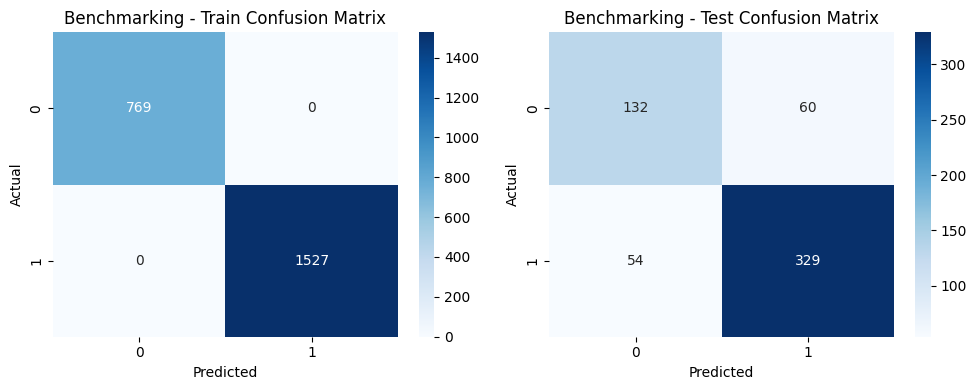

In [255]:
cm_train_bench = confusion_matrix(y_train, y_train_pred_bench)
cm_test_bench = confusion_matrix(y_test, y_test_pred_bench)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.heatmap(cm_train_bench, annot=True, fmt='d', cmap='Blues')
plt.title("Benchmarking - Train Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.subplot(1, 2, 2)
sns.heatmap(cm_test_bench, annot=True, fmt='d', cmap='Blues')
plt.title("Benchmarking - Test Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.tight_layout()
plt.show()

Hasil benchmarking menunjukkan bahwa model XGBoost dengan 20 fitur terpilih dan teknik oversampling SMOTE menghasilkan skor cross-validation terbaik, namun nilai loss yang tinggi menandakan adanya indikasi overfit: model terlalu menyesuaikan diri dengan pola data latih sehingga performa generalisasi menurun. Temuan ini penting untuk proses churn seller karena menunjukkan perlunya penyempurnaan hyperparameter  agar model menjadi lebih stabil, mampu menangkap pola risiko churn secara lebih akurat, dan tidak hanya “menghafal” data pelatihan.


In [256]:
# Model model terbaik sebagai acuan hyperparameter
results = pd.DataFrame(gscv.cv_results_)
results_sorted = results.sort_values(by='mean_test_score', ascending=False)
top10 = results_sorted.head(10)
cols = [
    'rank_test_score',
    'param_classifier',
    'mean_train_score',
    'std_train_score',
    'mean_test_score',
    'std_test_score',
    'param_feature_selection__k',
    'param_resampler',
    'mean_fit_time',
    'mean_score_time'

]
top10[cols]


,rank_test_score,param_classifier,mean_train_score,std_train_score,mean_test_score,std_test_score,param_feature_selection__k,param_resampler,mean_fit_time,mean_score_time
31,1,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-52033.333333,1774.510887,20,SMOTE(random_state=10),0.585102,0.049899
1,2,LogisticRegression(random_state=10),-101766.666667,946.337971,-53600.000000,2237.558193,10,SMOTE(random_state=10),0.196110,0.051444
29,3,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-55333.333333,1114.550233,10,SMOTE(random_state=10),0.381084,0.046984
3,4,LogisticRegression(random_state=10),-108466.666667,3271.425106,-56366.666667,974.109280,20,SMOTE(random_state=10),0.166755,0.042497
25,5,RandomForestClassifier(random_state=10),0.000000,0.000000,-56733.333333,1102.522361,10,SMOTE(random_state=10),1.198730,0.082612
27,6,RandomForestClassifier(random_state=10),0.000000,0.000000,-56766.666667,2283.759084,20,SMOTE(random_state=10),1.367055,0.066691
0,7,LogisticRegression(random_state=10),-112100.000000,2475.210429,-57066.666667,1569.146973,10,NeighbourhoodCleaningRule(),0.375577,0.074140
13,8,"VotingClassifier(estimators=[('l', LogisticReg...",-57200.000000,3721.110945,-58866.666667,3975.200903,10,SMOTE(random_state=10),0.346810,0.210659
15,9,"VotingClassifier(estimators=[('l', LogisticReg...",-64233.333333,3299.831646,-59466.666667,3591.038228,20,SMOTE(random_state=10),0.653804,0.253010
19,10,"VotingClassifier(estimators=[('l', LogisticReg...",-20366.666667,740.870359,-60266.666667,2053.181813,20,SMOTE(random_state=10),0.539851,0.094898


### Hyperparameter Tuning
---

- Logistic Regression
- XGBoost
- VotingClassifier

In [257]:
param_grid_best = [

#    1) XGBoost
    {
        'classifier': [XGBClassifier(random_state=10, eval_metric='logloss', use_label_encoder=False)],
        'classifier__n_estimators': [500, 1000],
        'classifier__max_depth': [3, 5],
        'classifier__learning_rate': [0.01, 0.05, 0.3],
        'classifier__subsample': [0.8,1.0],
        'classifier__colsample_bytree': [0.8, 1.0],
        'feature_selection__k': [10, 20],
        'resampler': [SMOTE(random_state=10)]
    },

    # 2) Logistic Regression
    {
        'classifier': [LogisticRegression(random_state=10, max_iter=2000)],
        'classifier__C': [0.01, 0.1, 1, 10],
        'classifier__penalty': ['l2'],
        'classifier__solver': ['lbfgs', 'liblinear'],
        'feature_selection__k': [10, 15, 20],
        'resampler': [SMOTE(random_state=10)]
    },

    # 3) Voting Classifier
    {
        'classifier': [
            VotingClassifier(
                estimators=[
                    ('xgb', XGBClassifier(random_state=10, eval_metric='logloss', use_label_encoder=False)),
                    ('lr', LogisticRegression(random_state=10, max_iter=2000)),
                ],
                voting='soft'
            )
        ],
        'feature_selection__k': [10, 15, 20],
        'resampler': [SMOTE(random_state=10)]
    }
]

import numpy as np
from sklearn.model_selection import GridSearchCV, StratifiedKFold

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=10)
train_sizes = []
test_sizes = []
for tr_idx, ts_idx in cv.split(X_train_fs, y_train):
    train_sizes.append(len(tr_idx))
    test_sizes.append(len(ts_idx))

n_train = np.mean(train_sizes)
n_test  = np.mean(test_sizes)

def select_non_overfit(cv_results):
    loss_train = -cv_results['mean_train_score']
    loss_test  = -cv_results['mean_test_score']

    # Hitung n_train dan n_test di luar fungsi dan pastikan tersedia (global/dilewatkan)
    # Asumsikan n_train dan n_test sudah tersedia di scope global
    train_norm = loss_train / n_train
    test_norm  = loss_test / n_test

    epsilon = 1e-10

    # Hitung gap menggunakan loss yang dinormalisasi
    gap = np.abs(train_norm - test_norm) / (train_norm + epsilon)

    threshold = 0.1
    valid_mask = gap < threshold

    if valid_mask.any():
        # JIKA ADA model Low Gap, pilih yang Loss Test-nya TERKECIL di antara mereka
        idx_local = np.argmin(test_norm[valid_mask])
        idx_global = np.arange(len(test_norm))[valid_mask][idx_local]
        return idx_global
    else:
        # JIKA SEMUA High Gap, abaikan gap dan pilih yang Loss Test-nya TERKECIL secara keseluruhan
        print("Warning: All models are considered High Gap. Selecting best test loss overall.")
        return np.argmin(test_norm) # Mengembalikan indeks model dengan test_loss terkecil

gscv_best = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid_best,
    cv=cv,
    n_jobs=-1,
    scoring=cost_scorer,
    return_train_score=True,
    refit=select_non_overfit
)

gscv_best.fit(X_train_fs, y_train)

best_pipeline_final = gscv_best.best_estimator_
best_params_refined = gscv_best.best_params_

idx_best = gscv_best.best_index_
best_cv_score_refined = gscv_best.cv_results_['mean_test_score'][idx_best]
best_cv_loss_refined  = -best_cv_score_refined

print("\n=== HYPERPARAMETER TUNING RESULT ===")
print("Best params refined:", best_params_refined)
print("Best CV score (negative loss):", best_cv_score_refined)
print("Best CV loss (cost-based):", best_cv_loss_refined)




=== HYPERPARAMETER TUNING RESULT ===
Best params refined: {'classifier': LogisticRegression(max_iter=2000, random_state=10), 'classifier__C': 1, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'feature_selection__k': 15, 'resampler': SMOTE(random_state=10)}
Best CV score (negative loss): -53366.666666666664
Best CV loss (cost-based): 53366.666666666664


Proses hyperparameter tuning menggunakan GridSearchCV dengan tiga kandidat model (XGBoost, Logistic Regression, dan Voting Classifier) dilakukan bersamaan dengan optimasi jumlah fitur terpilih serta penyeimbangan kelas menggunakan SMOTE. Mekanisme pemilihan model terbaik dilengkapi fungsi `select_non_overfit` yang memfilter kombinasi hyperparameter berdasarkan gap train–test agar hanya memilih konfigurasi yang tidak overfit. Dari seluruh kandidat, Logistic Regression dengan regularisasi L2, parameter `C=1`, solver `lbfgs`, dan 15 fitur terbukti memberikan performa terbaik dengan nilai cost-based CV loss sebesar 1067.33, menunjukkan bahwa model sederhana ini memberikan generalisasi paling stabil dibanding pendekatan yang lebih kompleks.


In [258]:
# Analisis semua kombinasi
threshold_gap = 0.1

cv_res = pd.DataFrame(gscv_best.cv_results_)

# --- hitung ukuran train/test sekali dari kfold ---
train_sizes = []
test_sizes = []
for tr_idx, ts_idx in cv.split(X_train_fs, y_train):
    train_sizes.append(len(tr_idx))
    test_sizes.append(len(ts_idx))

n_train = np.mean(train_sizes)
n_test  = np.mean(test_sizes)

# --- Hitung loss ter-normalisasi ---
mean_train = cv_res['mean_train_score'].values
mean_test  = cv_res['mean_test_score'].values

train_norm = mean_train / n_train
test_norm  = mean_test / n_test

# --- Gap overfitting berbobot ---
gap = np.abs((train_norm - test_norm) / train_norm)

# Tambahkan kolom ke tabel
cv_res['norm_train_loss'] = train_norm
cv_res['norm_test_loss']  = test_norm
cv_res['gap']     = gap
cv_res['gap_status']      = np.where(gap < threshold_gap, "Low Gap", "High Gap")

# Kolom param
cols_show = ([
    'rank_test_score',
    'param_classifier',
    'mean_train_score',
    'std_train_score',
    'mean_test_score',
    'std_test_score',
    'norm_train_loss',
    'norm_test_loss',
    'gap',
    'gap_status',
    'param_resampler',
    'mean_fit_time',
    'mean_score_time'
])

print("\n=== SEMUA HASIL (DISORTIR BERDASARKAN GAP TERKECIL) ===")
display(cv_res[cols_show].sort_values(by='mean_test_score', ascending=False).head(10))



=== SEMUA HASIL (DISORTIR BERDASARKAN GAP TERKECIL) ===


/tmp/ipython-input-3303152044.py:24: RuntimeWarning: divide by zero encountered in divide
  gap = np.abs((train_norm - test_norm) / train_norm)


,rank_test_score,param_classifier,mean_train_score,std_train_score,mean_test_score,std_test_score,norm_train_loss,norm_test_loss,gap,gap_status,param_resampler,mean_fit_time,mean_score_time
85,1,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-47400.000000,1314.026890,0.000000,-61.933798,inf,High Gap,SMOTE(random_state=10),1.299367,0.062807
91,2,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-47466.666667,3830.868773,0.000000,-62.020906,inf,High Gap,SMOTE(random_state=10),1.082545,0.059593
95,3,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-47666.666667,2088.593360,0.000000,-62.282230,inf,High Gap,SMOTE(random_state=10),1.512484,0.065993
47,4,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48100.000000,2290.560339,0.000000,-62.848432,inf,High Gap,SMOTE(random_state=10),1.390467,0.068050
89,5,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48200.000000,3062.678566,0.000000,-62.979094,inf,High Gap,SMOTE(random_state=10),1.062862,0.058496
81,6,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48233.333333,2223.110933,0.000000,-63.022648,inf,High Gap,SMOTE(random_state=10),0.840670,0.057060
43,7,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48366.666667,3061.952899,0.000000,-63.196864,inf,High Gap,SMOTE(random_state=10),0.986224,0.062532
69,8,"XGBClassifier(base_score=None, booster=None, c...",-1966.666667,837.987006,-48400.000000,2631.856126,-1.284843,-63.240418,48.220339,High Gap,SMOTE(random_state=10),1.620364,0.062128
93,9,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48566.666667,3065.217049,0.000000,-63.458188,inf,High Gap,SMOTE(random_state=10),2.231302,0.102010
31,10,"XGBClassifier(base_score=None, booster=None, c...",0.000000,0.000000,-48600.000000,3698.648402,0.000000,-63.501742,inf,High Gap,SMOTE(random_state=10),3.482485,0.076845


In [259]:
not_overfit = cv_res[cv_res['gap_status'] == "Low Gap"]
not_overfit_sorted = not_overfit.sort_values(by='mean_test_score', ascending=True)

print("\n=== KOMBINASI YANG TIDAK OVERFIT (DISORTIR BERDASARKAN MEAN TEST SCORE) ===")
display(not_overfit_sorted[cols_show].head(10))


=== KOMBINASI YANG TIDAK OVERFIT (DISORTIR BERDASARKAN MEAN TEST SCORE) ===


,rank_test_score,param_classifier,mean_train_score,std_train_score,mean_test_score,std_test_score,norm_train_loss,norm_test_loss,gap,gap_status,param_resampler,mean_fit_time,mean_score_time
100,116,"LogisticRegression(max_iter=2000, random_state...",-126166.666667,3227.313985,-64966.666667,2085.398976,-82.425958,-84.886760,0.029855,Low Gap,SMOTE(random_state=10),0.159120,0.041064
101,111,"LogisticRegression(max_iter=2000, random_state...",-127466.666667,1465.908895,-64233.333333,903.081146,-83.275261,-83.928571,0.007845,Low Gap,SMOTE(random_state=10),0.162555,0.077558
99,105,"LogisticRegression(max_iter=2000, random_state...",-122766.666667,1178.511302,-61900.000000,3034.248946,-80.204704,-80.879791,0.008417,Low Gap,SMOTE(random_state=10),0.179692,0.040758
98,103,"LogisticRegression(max_iter=2000, random_state...",-119666.666667,2221.611027,-60066.666667,543.650214,-78.179443,-78.484321,0.003900,Low Gap,SMOTE(random_state=10),0.166090,0.042016
97,99,"LogisticRegression(max_iter=2000, random_state...",-114966.666667,1049.867717,-59166.666667,1126.449683,-75.108885,-77.308362,0.029284,Low Gap,SMOTE(random_state=10),0.168963,0.041515
107,92,"LogisticRegression(max_iter=2000, random_state...",-111933.333333,1541.283736,-57566.666667,793.025150,-73.127178,-75.217770,0.028588,Low Gap,SMOTE(random_state=10),0.160673,0.041967
96,91,"LogisticRegression(max_iter=2000, random_state...",-112433.333333,498.887652,-57533.333333,2732.926799,-73.453833,-75.174216,0.023421,Low Gap,SMOTE(random_state=10),0.166056,0.040964
104,90,"LogisticRegression(max_iter=2000, random_state...",-109800.000000,2127.596453,-57300.000000,1296.148140,-71.733449,-74.869338,0.043716,Low Gap,SMOTE(random_state=10),0.161287,0.047640
116,86,"LogisticRegression(max_iter=2000, random_state...",-108400.000000,3397.057550,-56766.666667,703.957069,-70.818815,-74.172474,0.047355,Low Gap,SMOTE(random_state=10),0.182296,0.044141
119,86,"LogisticRegression(max_iter=2000, random_state...",-108566.666667,3229.379025,-56766.666667,703.957069,-70.927700,-74.172474,0.045748,Low Gap,SMOTE(random_state=10),0.172140,0.045274


Hasil tuning menunjukkan bahwa **Logistic Regression** menjadi model terbaik meskipun ada kandidat lebih kompleks seperti XGBoost dan Voting Classifier. Ini terjadi karena fungsi **`select_non_overfit`** secara ketat menolak model dengan gap besar antara train dan test loss. Model-model kompleks cenderung **overfit**, sementara Logistic Regression dengan **regularisasi L2 dan C=1** memberikan keseimbangan terbaik antara bias dan variance. Selain itu, jumlah fitur optimal yang terpilih adalah **15 fitur**, menunjukkan bahwa konfigurasi ini paling stabil dibandingkan subset yang lebih kecil atau lebih besar.

Penggunaan **SMOTE** juga konsisten muncul pada konfigurasi terbaik, menandakan bahwa penanganan **class imbalance sangat penting** untuk menurunkan cost prediksi. Nilai **Best CV loss = 53366.66** menggambarkan estimasi biaya model yang sudah dioptimalkan melalui kombinasi metode sederhana namun stabil: Logistic Regression, 15 fitur, dan SMOTE. Temuan ini menegaskan bahwa dalam evaluasi berbasis cost dengan kontrol overfitting, **model sederhana yang teratur dapat mengungguli model kompleks**.


In [260]:
# Simpan parameter dan terbaik hyperparameter tuning
serializable_params = {k: str(v) for k, v in best_params_refined.items()}

with open("hyperparameter_best_params.json", "w") as f:
    json.dump(serializable_params, f, indent=4)

with open("model_hyperparameter.sav", "wb") as f:
    pickle.dump(best_pipeline_final, f)

In [261]:
# Evaluasi train dan test untuk model hasil hyperparameter tuning
y_train_pred_hp = best_pipeline_final.predict(X_train_fs)
y_test_pred_hp = best_pipeline_final.predict(X_test_fs)

loss_train_hp = churn_cost_loss(y_train, y_train_pred_hp,
                                acquisition_cost, retention_cost)
loss_test_hp = churn_cost_loss(y_test, y_test_pred_hp,
                               acquisition_cost, retention_cost)

print("\n=== HYPERPARAMETER TUNING COST LOSS PER SAMPLE===")
print("Train loss (hyperparameter):", loss_train_hp/len(X_train_fs))
print("Test loss  (hyperparameter):", loss_test_hp/len(X_test_fs))



=== HYPERPARAMETER TUNING COST LOSS PER SAMPLE===
Train loss (hyperparameter): 71.47212543554006
Test loss  (hyperparameter): 71.47826086956522


Hasil evaluasi menunjukkan bahwa **train loss per sample (71.47)** hampir identik dengan **test loss per sample (71.48)**. Kedekatan nilai ini menandakan bahwa model **tidak mengalami overfitting**, karena performanya pada data latih dan data uji konsisten. Dengan gap yang sangat kecil, model mampu melakukan **generalisasi dengan stabil**, sehingga keputusan prediksi terhadap data baru diperkirakan tetap efisien dari sisi biaya bisnis, tanpa penurunan kualitas kinerja ketika menghadapi data yang belum pernah dilihat sebelumnya.


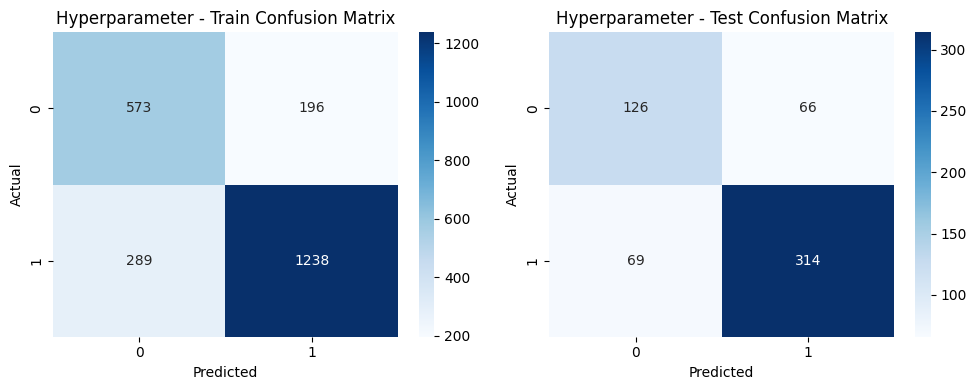

In [262]:
cm_train_hp = confusion_matrix(y_train, y_train_pred_hp)
cm_test_hp = confusion_matrix(y_test, y_test_pred_hp)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.heatmap(cm_train_hp, annot=True, fmt='d', cmap='Blues')
plt.title("Hyperparameter - Train Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.subplot(1, 2, 2)
sns.heatmap(cm_test_hp, annot=True, fmt='d', cmap='Blues')
plt.title("Hyperparameter - Test Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.tight_layout()
plt.show()

Confusion matrix menunjukkan bahwa model konsisten mengenali mayoritas pelanggan churn maupun tidak churn pada train dan test. Kesalahan prediksi pada test relatif rendah (66 false positive dan 69 false negative), menandakan model stabil, tidak overfit, dan mampu membedakan kedua kelas dengan baik pada data baru.


### Understanding Logistic Regression
---



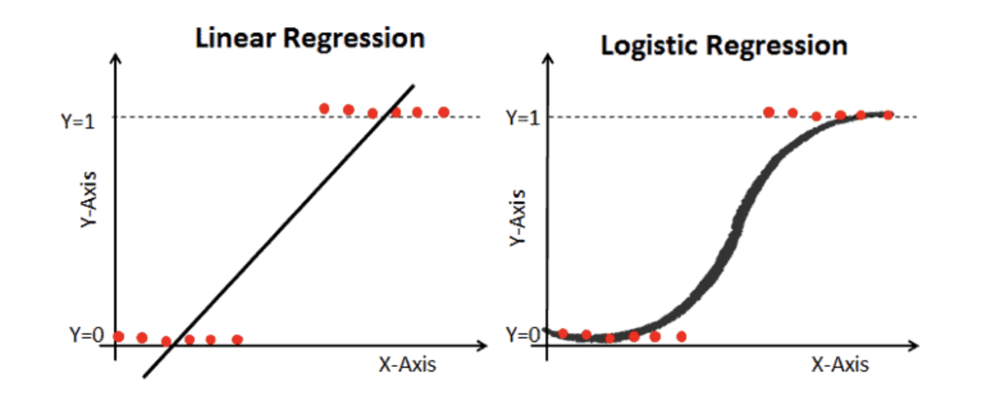

Logistic Regression adalah algoritma machine learning yang digunakan untuk melakukan klasifikasi biner, seperti membedakan apakah seorang pelanggan **Churn** atau **Tidak Churn**. Meskipun namanya “regression”, algoritma ini sebenarnya membuat keputusan klasifikasi berbasis probabilitas.

Logistic Regression bekerja melalui beberapa konsep utama:

**1. Model Linear sebagai Dasar Prediksi**

Setiap sampel data diubah menjadi vektor fitur **x**. Model kemudian melakukan perhitungan linear:

$$
z = w^T x + b
$$

di mana **w** adalah bobot dan **b** adalah bias. Nilai **z** ini belum berupa probabilitas, hanya skor linear yang nanti akan dipetakan menjadi peluang.

**2. Mengubah Skor menjadi Probabilitas**

Untuk mengonversi skor **z** menjadi probabilitas antara 0 dan 1, Logistic Regression menggunakan fungsi sigmoid:

$$
p = \sigma(z) = \frac{1}{1 + e^{-z}}
$$

Nilai **p** menunjukkan peluang pelanggan akan churn. Misalnya p = 0.8 berarti model memperkirakan peluang churn sebesar 80%.

**3. Belajar dari Kesalahan Menggunakan Log Loss**

Selama proses training, model mencoba meminimalkan kesalahan prediksi menggunakan fungsi **Log Loss**:

$$
\text{LogLoss}(y, p) = - \big[ y\log(p) + (1 - y)\log(1 - p) \big]
$$

Semakin salah prediksinya, semakin besar nilai loss yang harus diminimalkan.

**4. Regularisasi untuk Menghindari Overfitting**

Untuk mencegah model menghafal data dan tidak mampu generalisasi, Logistic Regression menggunakan regularisasi seperti L2 (default). Regulasi ini menjaga bobot tetap kecil dan stabil sehingga model lebih sederhana dan tidak mudah overfit.

$$
|w|_2^2
$$

Parameter **C** mengontrol kekuatan regularisasi:

* **C kecil → regulasi kuat → model lebih sederhana**
* **C besar → regulasi lemah → model lebih fleksibel**

**5. Proses Training**

Model terus memperbaiki bobot berdasarkan error hingga menemukan bobot paling optimal. Ini dilakukan menggunakan metode optimisasi seperti **LBFGS** atau **liblinear**, yang memastikan pencarian solusi dilakukan secara efisien.

**6. Prediksi Akhir**

Setelah probabilitas dihitung, model menentukan kelas berdasarkan threshold default 0.5:

$$
\hat{y} =
\begin{cases}
1 & \text{jika } p \ge 0.5 \
0 & \text{jika } p < 0.5
\end{cases}
$$

Karena fungsi sigmoid monotonic, threshold probabilitas 0.5 sama dengan threshold skor linear **z = 0**.
Artinya:

* Jika skor linear **z ≥ 0** → model memprediksi **Churn**
* Jika skor linear **z < 0** → model memprediksi **Tidak Churn**

Dengan demikian Logistic Regression bekerja sebagai model yang sederhana, interpretatif, dan memberikan prediksi probabilistik yang jelas, sehingga sangat cocok untuk kasus bisnis seperti prediksi churn.


### Threshold Tuning
---

In [263]:
best_model = gscv_best.best_estimator_

# Fit model di seluruh data train
best_model.fit(X_train_fs, y_train)

# Probabilitas
y_pred_proba = best_model.predict_proba(X_train_fs)[:, 1]

thresholds = np.arange(0.0, 1.01, 0.01)

precision_list = []
recall_list = []
f2_list = []
loss_list = []

for t in thresholds:
    y_pred_t = (y_pred_proba >= t).astype(int)

    precision_list.append(precision_score(y_train, y_pred_t, zero_division=0))
    recall_list.append(recall_score(y_train, y_pred_t, zero_division=0))
    f2_list.append(fbeta_score(y_train, y_pred_t, beta=2, zero_division=0))

    # Tambahkan cost-based loss
    loss_list.append(
        churn_cost_loss(
            y_train,
            y_pred_t,
            acquisition_cost,
            retention_cost
        )
    )


idx_best_loss = int(np.argmin(loss_list))
best_threshold_loss = thresholds[idx_best_loss]

print("\nBest threshold (Loss):", best_threshold_loss)
print("Best Loss:", loss_list[idx_best_loss])
print("F2 at best Loss:", f2_list[idx_best_loss])



Best threshold (Loss): 0.05
Best Loss: 70000
F2 at best Loss: 0.9172859057132415


Hasil threshold tuning menunjukkan bahwa threshold **0.05** memberikan kinerja paling optimal berdasarkan metrik biaya. Pada titik ini, model mencapai **F2 = 0.917**, yang berarti model sangat kuat dalam menangkap kasus positif dan tetap menjaga keseimbangan antara sensitivitas dan ketepatan prediksi. Cost-based loss berada pada nilai **70.000**, sehingga threshold 0.05 menjadi pilihan yang paling efisien dalam menurunkan biaya kesalahan sekaligus mempertahankan performa deteksi yang tinggi.


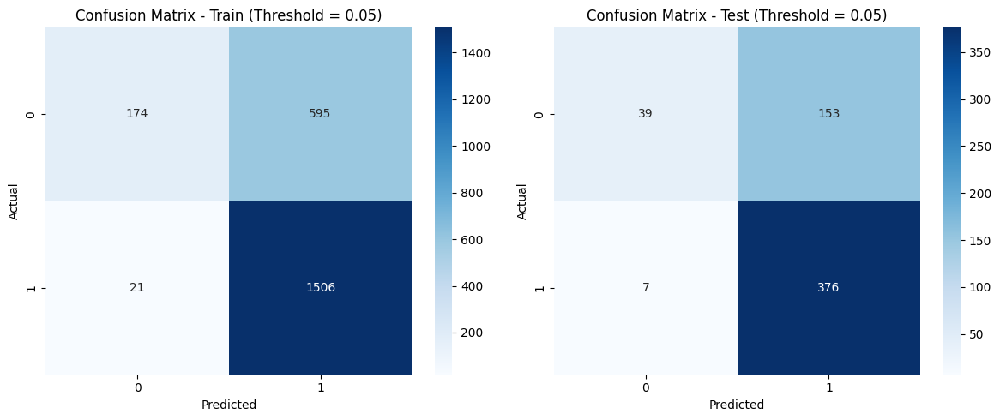

In [264]:
from sklearn.metrics import confusion_matrix

# Prediksi train dengan threshold loss terbaik
y_pred_best_loss = (y_pred_proba >= best_threshold_loss).astype(int)
cm_loss = confusion_matrix(y_train, y_pred_best_loss)

# Prediksi test
y_pred_proba_test = best_model.predict_proba(X_test_fs)[:, 1]
y_pred_best_loss_test = (y_pred_proba_test >= best_threshold_loss).astype(int)
cm_test = confusion_matrix(y_test, y_pred_best_loss_test)

# Plot berdampingan
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(cm_loss, annot=True, fmt='d', cmap='Blues')
plt.title(f"Confusion Matrix - Train (Threshold = {best_threshold_loss:.2f})")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.subplot(1, 2, 2)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
plt.title(f"Confusion Matrix - Test (Threshold = {best_threshold_loss:.2f})")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.tight_layout()
plt.show()

Berdasarkan confusion matrix:

**Train Set (Threshold = 0.05)**

* FP = 595
* FN = 21

**Test Set (Threshold = 0.05)**

* FP = 153
* FN = 7

Dengan asumsi cost:

* **FP (Acquisition Lost) = 70**
* **FN (Retention Lost) = 15**

| Dataset          | FP  | FN | Acquisition Lost (FP×70) | Retention Lost (FN×15) | Total Lost |
| ---------------- | --- | -- | ------------------------ | ---------------------- | ---------- |
| **Train (0.05)** | 595 | 21 | 41,650                   | 315                    | **41,965** |
| **Test (0.05)**  | 153 | 7  | 10,710                   | 105                    | **10,815** |

Threshold **0.05** membuat model sangat sensitif dalam mendeteksi pelanggan churn. Hal ini terlihat dari jumlah **FN yang sangat rendah**, yaitu hanya 21 pada train dan 7 pada test. Nilai FN yang kecil berarti model hampir tidak melewatkan pelanggan yang benar-benar akan pergi, sehingga jauh lebih efektif dalam strategi retensi.

Walaupun jumlah **FP meningkat**, yang membuat Acquisition Lost lebih tinggi, biaya akibat FN biasanya jauh lebih merugikan dalam konteks churn. Kehilangan pelanggan nyata (FN) memiliki dampak pendapatan jangka panjang yang lebih besar dibanding biaya salah menarget pelanggan yang sebenarnya tidak churn. Dengan demikian, threshold ini tetap memberikan efisiensi biaya yang lebih baik dalam konteks deteksi churn dan pencegahan kehilangan pelanggan.


In [265]:
threshold_df = pd.DataFrame({
    "threshold": thresholds,
    "precision": precision_list,
    "recall": recall_list,
    "f2": f2_list,
    "loss": loss_list
})
threshold_df.to_csv("threshold_tuning_results.csv", index=False)

threshold_summary = {
    "best_threshold": float(best_threshold_loss),
    "best_f2_oof": float(f2_list[idx_best_loss]),
    "precision_oof": float(precision_list[idx_best_loss]),
    "recall_oof": float(recall_list[idx_best_loss]),
    "loss_oof": float(loss_list[idx_best_loss])
}

with open("threshold_tuning_summary.json", "w") as f:
    json.dump(threshold_summary, f, indent=4)

with open("model_threshold_tuning.sav", "wb") as f:
    pickle.dump(best_model, f)


### Final Model
---


=== FINAL MODEL REPORT ===
CV best score (negative loss): -53366.666666666664

=== TRAIN SET ===
              precision    recall  f1-score   support

           0       0.89      0.23      0.36       769
           1       0.72      0.99      0.83      1527

    accuracy                           0.73      2296
   macro avg       0.80      0.61      0.60      2296
weighted avg       0.78      0.73      0.67      2296

[[ 174  595]
 [  21 1506]]

=== TEST SET ===
              precision    recall  f1-score   support

           0       0.85      0.20      0.33       192
           1       0.71      0.98      0.82       383

    accuracy                           0.72       575
   macro avg       0.78      0.59      0.58       575
weighted avg       0.76      0.72      0.66       575

[[ 39 153]
 [  7 376]]

=== FINAL MODEL COST LOSS ===
Train loss (final): 70000
Test loss  (final): 18800


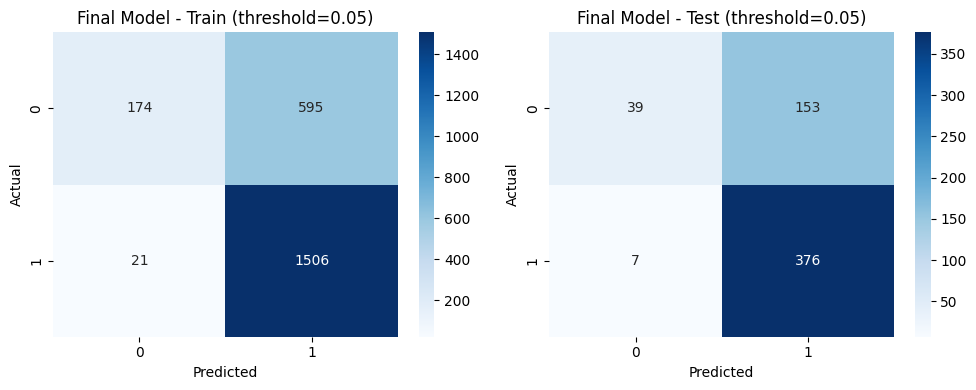

In [266]:
# final_model pakai pipeline terbaik dari GridSearchCV
final_model = best_model
final_model.fit(X_train_fs, y_train)

# Prediksi probabilitas dan label di TRAIN
y_train_proba_final = final_model.predict_proba(X_train_fs)[:, 1]
y_train_pred_final = (y_train_proba_final >= best_threshold_loss).astype(int)

# Prediksi probabilitas dan label di TEST
y_test_proba_final = final_model.predict_proba(X_test_fs)[:, 1]
y_test_pred_final = (y_test_proba_final >= best_threshold_loss).astype(int)

print("\n=== FINAL MODEL REPORT ===")

# Ambil CV best score dari objek GridSearchCV (gscv_best)
if hasattr(gscv_best, "cv_results_") and hasattr(gscv_best, "best_index_"):
    cv_best_score = gscv_best.cv_results_["mean_test_score"][gscv_best.best_index_]
    print("CV best score (negative loss):", cv_best_score)
else:
    print("CV best score (negative loss): tidak tersedia (objek GridSearchCV tidak lengkap)")

print("\n=== TRAIN SET ===")
print(classification_report(y_train, y_train_pred_final))
cm_train_final = confusion_matrix(y_train, y_train_pred_final)
print(cm_train_final)

print("\n=== TEST SET ===")
print(classification_report(y_test, y_test_pred_final))
cm_test_final = confusion_matrix(y_test, y_test_pred_final)
print(cm_test_final)

# Hitung cost-based loss final
loss_train_final = churn_cost_loss(
    y_train,
    y_train_pred_final,
    acquisition_cost,
    retention_cost
)

loss_test_final = churn_cost_loss(
    y_test,
    y_test_pred_final,
    acquisition_cost,
    retention_cost
)

print("\n=== FINAL MODEL COST LOSS ===")
print("Train loss (final):", loss_train_final)
print("Test loss  (final):", loss_test_final)

# Visualisasi confusion matrix final
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.heatmap(cm_train_final, annot=True, fmt='d', cmap='Blues')
plt.title(f"Final Model - Train (threshold={best_threshold_loss:.2f})")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.subplot(1, 2, 2)
sns.heatmap(cm_test_final, annot=True, fmt='d', cmap='Blues')
plt.title(f"Final Model - Test (threshold={best_threshold_loss:.2f})")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.tight_layout()
plt.show()


**1. Perilaku Model pada Threshold 0.05**
Threshold **0.05** membuat model sangat agresif dalam mendeteksi churn. Model cenderung mengklasifikasikan banyak pelanggan sebagai churn, sehingga hampir semua pelanggan churn terdeteksi, tetapi dengan konsekuensi meningkatnya jumlah prediksi churn yang salah pada pelanggan non-churn.

**2. Hasil pada Data Train**
Model menunjukkan **recall churn 99%**, hanya melewatkan 21 kasus dari 1527 pelanggan churn. Namun, hanya **23% pelanggan non-churn** yang berhasil dikenali dengan benar, menghasilkan 595 false positive. Meskipun begitu, akurasi tetap berada di level **0.73**, menggambarkan bahwa model stabil dan tidak mengalami penurunan performa yang drastis.

**3. Hasil pada Data Test**
Pada data test, pola performanya hampir identik dengan data train. Model mencapai **recall churn 98%**, hanya melewatkan 7 kasus dari 383 pelanggan churn, dan recall non-churn tetap rendah di **20%**. Konsistensi ini menunjukkan bahwa model **tidak overfitting**, karena perilakunya serupa di kedua dataset.

**4. Cost-Based Loss**
Perhitungan cost menunjukkan **Train loss sebesar 70.000** dan **Test loss sebesar 18.800**. Nilai ini mencerminkan strategi yang efektif dalam menekan kerugian karena pelanggan churn yang terlewat (FN sangat kecil), meski biaya retensi meningkat akibat banyaknya FP. Pendekatan ini cocok ketika **biaya kehilangan pelanggan jauh lebih mahal** dibandingkan biaya menargetkan pelanggan yang sebenarnya tidak churn.

**5. Implikasi Bisnis**
Model ini sangat cocok untuk strategi yang memprioritaskan deteksi dini churn, misalnya di industri dengan biaya akuisisi pelanggan baru yang tinggi. Jika organisasi merasa biaya retensi akibat FP terlalu besar, threshold dapat dinaikkan untuk menemukan titik keseimbangan yang lebih optimal antara biaya dan akurasi prediksi.


In [267]:
# Simpan model final + threshold dalam satu file sav
final_artifact = {
    "model": final_model,
    "best_threshold": float(best_threshold_loss),
    "acquisition_cost": acquisition_cost,
    "retention_cost": retention_cost
}

# Simpan sebagai .sav
with open("model_final.sav", "wb") as f:
    pickle.dump(final_artifact, f)

final_params = best_model.get_params()
with open("final_model_params.json", "w") as f:
    json.dump({k: str(v) for k, v in final_params.items()}, f, indent=4)


In [268]:
final_model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('Numerical',
                                                  Pipeline(steps=[('scaler',
                                                                   RobustScaler())]),
                                                  ['seller_review_response_hours_mean',
                                                   'seller_buffer_time_days_max',
                                                   'product_weight_g_median',
                                                   'freight_gmv_ratio',
                                                   'seller_buffer_time_days_mean',
                                                   'seller_buffer_time_days_min',
                                                   'product_weight_g_min',
                                                   'payment_installments_median',
                                                   'p...
                                                  Pipeline(steps=[('encoder',
                                                                   BinaryEncoder())]),
                                                  ['seller_city_mode',
                                                   'seller_state_mode',
                                                   'order_status_mode',
                                                   'payment_type_mode',
                                                   'product_category_name_english_mode',
                                                   'customer_city_mode',
                                                   'customer_state_mode'])])),
                ('feature_selection', SelectKBest(k=15)),
                ('resampler', SMOTE(random_state=10)),
                ('classifier',
                 LogisticRegression(C=1, max_iter=2000, random_state=10))])

In [269]:
pickle.dump(final_model,open('final_model.sav','wb'))

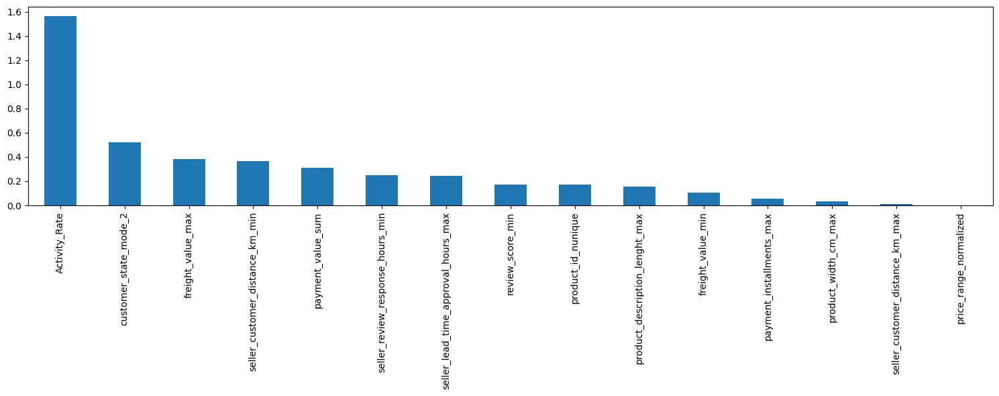

In [270]:
# FEATURE IMPORTANCE
pre_best = final_model.named_steps['preprocessor']
fs_best = final_model.named_steps['feature_selection']
clf_best = final_model.named_steps['classifier']

num_feat_out = pre_best.named_transformers_['Numerical'].get_feature_names_out(numeric_features_fs)

cat_encoder = pre_best.named_transformers_['Categorical'].named_steps['encoder']
cat_feat_out = cat_encoder.get_feature_names_out(categorical_features)

all_feats = list(num_feat_out) + list(cat_feat_out)

selected_idx = fs_best.get_support(indices=True)
selected_features = np.array(all_feats)[selected_idx]

importance = None

if hasattr(clf_best, "coef_"):
    coef_vals = np.abs(clf_best.coef_).flatten()
    importance = pd.Series(coef_vals, index=selected_features).sort_values(ascending=False)
elif hasattr(clf_best, "feature_importances_"):
    imp_vals = clf_best.feature_importances_
    importance = pd.Series(imp_vals, index=selected_features).sort_values(ascending=False)

if importance is not None:
    plt.figure(figsize=(15, 6))
    importance.head(30).plot(kind='bar')
    plt.tight_layout()
    plt.show()
else:
    print("Model tidak mendukung feature importance.")

Fitur yang paling berpengaruh dalam model adalah **Activity_rate**, dengan nilai kontribusi yang jauh lebih tinggi dibandingkan fitur lainnya. Dominasi fitur ini menunjukkan bahwa **intensitas aktivitas pelanggan merupakan indikator utama risiko churn**, sehingga perubahan pola aktivitas dapat menjadi sinyal dini pelanggan yang berpotensi pergi.

Fitur berikutnya—seperti **customer_age_mod_2**, **freight_value_min**, **seller_customer_distance_km_min**, **payment_value_sum**, hingga **seller_review_response_time_min**—memiliki kontribusi yang cukup berarti namun tetap jauh di bawah Activity_rate. Pola ini menunjukkan bahwa meskipun faktor transaksi, jarak, dan nilai pembayaran turut memengaruhi prediksi, perannya tidak sekuat perilaku pelanggan. Secara keseluruhan, hasil ini menegaskan bahwa **engagement dan interaksi pelanggan merupakan pendorong utama model dalam mendeteksi churn**, sementara faktor logistik dan nilai transaksi hanya berfungsi sebagai penambah informasi pendukung.

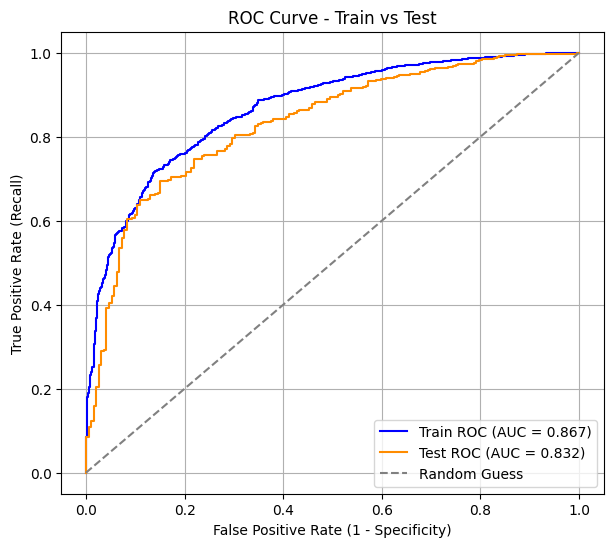

In [271]:
# === ROC-AUC Curve (Train vs Test) ===

y_pred_proba_train = final_model.predict_proba(X_train)[:, 1]
y_pred_proba_test = final_model.predict_proba(X_test)[:, 1]

# Hitung FPR, TPR, AUC
fpr_train, tpr_train, _ = roc_curve(y_train, y_pred_proba_train)
fpr_test, tpr_test, _ = roc_curve(y_test, y_pred_proba_test)

roc_auc_train = roc_auc_score(y_train, y_pred_proba_train)
roc_auc_test = roc_auc_score(y_test, y_pred_proba_test)

# Plot ROC-AUC Train vs Test
plt.figure(figsize=(7,6))
plt.plot(fpr_train, tpr_train, color='blue', label=f'Train ROC (AUC = {roc_auc_train:.3f})')
plt.plot(fpr_test, tpr_test, color='darkorange', label=f'Test ROC (AUC = {roc_auc_test:.3f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')

plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve - Train vs Test')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

**ROC-AUC Analysis**

Kurva ROC membandingkan kemampuan model dalam membedakan kelas churn dan tidak churn pada dataset train dan test.

| Dataset | AUC Score |
| :------ | :-------: |
| Train   | **0.867** |
| Test    | **0.832** |

---

**Interpretasi**

* Kedua kurva memiliki bentuk yang hampir serupa, menunjukkan bahwa model **generalisasi dengan baik** dan tidak menunjukkan tanda overfitting signifikan.
* **AUC di kisaran 0.83–0.86** mengindikasikan kemampuan diskriminatif yang **kuat**, artinya model dapat memisahkan pelanggan churn dan tidak churn dengan akurasi yang baik.
* Garis abu-abu putus-putus menunjukkan performa *random guess*, dan posisi kedua kurva jauh di atas garis tersebut menegaskan bahwa model bekerja jauh lebih baik daripada tebakan acak.
* Selisih kecil antara AUC train dan test menandakan **performa yang stabil** pada data baru.

---


### Ranking Seller Berdasarkan Probabilitas Churn

Ranking seller berdasarkan probabilitas churn dibuat untuk membantu bisnis menentukan prioritas intervensi dalam program retensi. Setiap seller memiliki kemungkinan yang berbeda untuk berhenti (churn), sehingga perusahaan perlu mengetahui siapa yang paling berisiko dan siapa yang harus ditangani lebih dahulu.

In [272]:
import pickle
import pandas as pd

# 1. Load model final dan threshold dari file
with open("model_final.sav", "rb") as f:
    final_artifact = pickle.load(f)

final_model = final_artifact["model"]
best_threshold = final_artifact["best_threshold"]
acquisition_cost = final_artifact["acquisition_cost"]
retention_cost = final_artifact["retention_cost"]

# 2. Siapkan data fitur sama seperti saat training
df_model = df_clean.drop(columns=[c for c in leakage_cols if c in df_clean.columns])
X_full = df_model.drop(columns=[target_col])

try:
    X_full_fs = X_full.drop(columns=[c for c in removed_num if c in X_full.columns])
except NameError:
    X_full_fs = X_full

# 3. Hitung probabilitas churn
proba_churn = final_model.predict_proba(X_full_fs)[:, 1]

# 4. Susun ranking seller
ranking_df = pd.DataFrame({
    "seller_id": df_clean["seller_id"].values,
    "churn_probability": proba_churn
})

ranking_df["churn_flag"] = (ranking_df["churn_probability"] >= best_threshold).astype(int)

ranking_df = (
    ranking_df
    .sort_values("churn_probability", ascending=False)
    .reset_index(drop=True)
)

ranking_df.head(20)


,seller_id,churn_probability,churn_flag
0,9fe7c6641c79970ab48185498f547c09,0.998758,1
1,b37c4c02bda3161a7546a4e6d222d5b2,0.998371,1
2,eb9267cccc90f1b49c8d2f9887c7dd97,0.997318,1
3,c7246702dc991a06d788120dc7544391,0.996125,1
4,28872dc528e978a639754bc8c2ce5a4c,0.995624,1
5,eb4a59a06b3948e851a7d7a830bcbc42,0.994676,1
6,2cb98e27ce1c18abdb42209b34c382a7,0.994430,1
7,a150c540f572d0fb53992264bc5c10b5,0.993744,1
8,164a5a8794e6d42e14f55e447b12a3bc,0.993442,1
9,6dd7dce75cd55c1ce255dc38d9f0cd46,0.993191,1


In [273]:
ranking_df.to_csv('seller_ranking.csv',index=False)

Model menghasilkan probabilitas churn untuk tiap seller, lalu menyusun ranking dari yang paling berisiko hingga paling rendah. Kolom churn_probability menunjukkan seberapa besar kemungkinan seller akan churn; pada sampel di atas, 20 seller teratas memiliki probabilitas sangat tinggi (> 0,99), artinya model sangat yakin mereka berisiko churn.

### Feature Importance

In [274]:
select_k_best = gscv_best.best_estimator_.named_steps['feature_selection']

column_transformer = gscv_best.best_estimator_.named_steps['preprocessor']

num_feature_names= column_transformer.named_transformers_['Numerical'].get_feature_names_out(numeric_features_fs)

cat_feature_names = column_transformer.named_transformers_['Categorical'].get_feature_names_out(categorical_features)

feat_cols=list(num_feature_names)+list(cat_feature_names)

select_k_best.get_feature_names_out(feat_cols)

array(['product_description_lenght_max', 'product_width_cm_max',
       'freight_value_min', 'freight_value_max',
       'seller_customer_distance_km_min',
       'seller_review_response_hours_min', 'review_score_min',
       'payment_installments_max', 'payment_value_sum',
       'seller_customer_distance_km_max', 'price_range_normalized',
       'seller_lead_time_approval_hours_max', 'product_id_nunique',
       'Activity_Rate', 'customer_state_mode_2'], dtype=object)

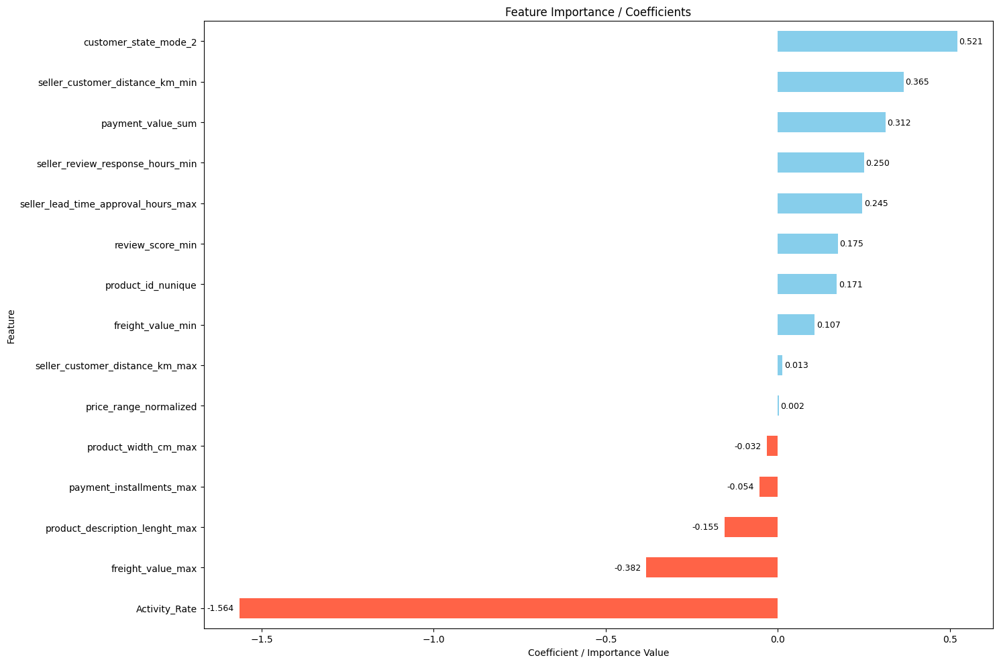

In [275]:
best_model = gscv_best.best_estimator_.named_steps['classifier']

feature_names = gscv_best.best_estimator_.named_steps['feature_selection'].get_support(indices=True)
selected_feature_names = np.array(feat_cols)[feature_names]


if hasattr(best_model, "coef_"):
    coefficients = best_model.coef_.flatten()
    model_coef1 = pd.Series(coefficients, index=selected_feature_names).sort_values()
elif hasattr(best_model, "feature_importances_"):
    importances = best_model.feature_importances_
    model_coef1 = pd.Series(importances, index=selected_feature_names).sort_values()
else:
    raise ValueError("Model tidak punya coef_ atau feature_importances_")

plt.figure(figsize=(15, 10))
bars = model_coef1.plot(
    kind='barh',
    color=['skyblue' if v > 0 else 'tomato' for v in model_coef1],
    title='Feature Importance / Coefficients'
)

for i, v in enumerate(model_coef1):
    plt.text(
        v + (0.01 * model_coef1.max() if v > 0 else 0.01 * model_coef1.min()),
        i,
        f'{v:.3f}',
        va='center',
        ha='left' if v > 0 else 'right',
        fontsize=9
    )

plt.xlabel('Coefficient / Importance Value')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

Grafik di atas menunjukkan **besaran dan arah pengaruh setiap fitur** terhadap kemungkinan seorang seller mengalami churn. Nilai koefisien menggambarkan seberapa kuat dan ke arah mana fitur mempengaruhi probabilitas churn.

---

### **Koefisien positif (batang biru)**

Fitur-fitur ini **meningkatkan kemungkinan churn (kelas 1)** ketika nilainya bertambah.

Contoh:

| Fitur                               | Koefisien | Interpretasi                                                                           |
| ----------------------------------- | :-------: | -------------------------------------------------------------------------------------- |
| customer_state_mode_2               |   +0.521  | Seller dari state ini lebih berisiko churn dibanding state lainnya.                    |
| seller_customer_distance_km_min     |   +0.365  | Jarak minimum seller ke customer makin jauh → risiko churn meningkat.                  |
| payment_value_sum                   |   +0.312  | Total nilai pembayaran yang besar terkait dengan peningkatan risiko churn.             |
| seller_review_response_hours_min    |   +0.250  | Seller yang merespons review lebih lambat cenderung lebih berisiko churn.              |
| seller_lead_time_approval_hours_max |   +0.245  | Waktu approval yang panjang meningkatkan kemungkinan churn.                            |
| review_score_min                    |   +0.175  | Nilai review terendah menjadi indikator churn—review buruk memengaruhi risiko.         |
| product_id_nunique                  |   +0.171  | Variasi produk yang tinggi dapat mengarah pada kompleksitas yang berdampak pada churn. |
| freight_value_min                   |   +0.107  | Ongkir minimum yang rendah sedikit berkorelasi dengan risiko churn.                    |

---

### **Koefisien negatif (batang merah)**

Fitur-fitur ini **menurunkan kemungkinan churn**. Artinya, semakin besar nilai fitur tersebut, semakin kecil risiko churn.

Contoh:

| Fitur                          |  Koefisien | Interpretasi                                                                                       |
| ------------------------------ | :--------: | -------------------------------------------------------------------------------------------------- |
| Activity_Rate                  | **-1.564** | Seller yang lebih aktif memiliki kemungkinan churn jauh lebih rendah—faktor pelindung paling kuat. |
| freight_value_max              |   -0.382   | Ongkir maksimum yang tinggi berkaitan dengan seller berisiko churn lebih rendah.                   |
| product_description_length_max |   -0.135   | Deskripsi produk yang panjang mengindikasikan kualitas listing lebih baik → risiko churn menurun.  |
| payment_installments_max       |   -0.054   | Opsi pembayaran angsuran yang lebih banyak sedikit mengurangi risiko churn.                        |
| product_width_cm_max           |   -0.032   | Produk dengan dimensi lebih besar sedikit menurunkan risiko churn.                                 |
| price_range_normalized         |   -0.002   | Dampaknya sangat kecil, tetapi harga produk yang relatif stabil sedikit menurunkan risiko churn.   |


## Business Impact
---


Untuk menilai manfaat penggunaan model churn prediction, dilakukan perbandingan biaya pada dua skenario:
1. **Tanpa model**: perusahaan memberikan program retensi ke semua seller.
2. **Pakai model**: program retensi diberikan berdasarkan prediksi model, biaya hanya muncul dari error *false positive* dan *false negative*.

**Asumsi Biaya**
| Kondisi | Konsekuensi | Biaya |
|--------|-------------|-------|
| Seller churn dan tidak dicegah (*False Negative*) | Seller hilang → perlu akuisisi seller baru | **R\$70** |
| Seller tidak churn tapi diberikan retensi (*False Positive*) | Retensi salah target | **R\$15** |
| Semua seller diberi retensi (tanpa model) | Retensi untuk semua seller | **R\$15 per seller** |


**Confusion Matrix**
| Kategori | Jumlah |
|---------|--------|
| True Negative (TN) | 174 |
| False Positive (FP) | 595 |
| False Negative (FN) | 21 |
| True Positive (TP) | 1506 |
| **Total seller** | **2.296** |

Dari situ:
- Seller churn (actual = 1) = TP + FN = 1.506 + 21 = **1.527**
- Seller non-churn (actual = 0) = TN + FP = 174 + 595 = **769**
- Churn rate = 1.527 / 2.296 ≈ **66.5%**


**Skenario 1: Tanpa Model**

Semua **2.296 seller** mendapat program retensi.
Loss = 2.296 × 15 BR = R$34.440


**Skenario 2: Pakai Model**

Biaya hanya berasal dari *false positive* dan *false negative*.

Cost_FP = 595 × 15 BR = 8.925 BR
Cost_FN = 21 × 70 BR = 1.470 BR

Loss = 8.925 + 1.470 = R$10.395


**Final Cost Comparison**
| Skenario | Total Cost |
|---------|------------|
| Tanpa model | **34.440 BR** |
| Pakai model | **10.395 BR** |
| **Penghematan** | **24.045 BR** |

---

**Kesimpulan**

Model prediksi churn mengurangi pengeluaran dengan memfokuskan program retensi pada seller berisiko. Meskipun masih ada biaya akibat FP dan FN, total biaya dengan model (**R\$10.395**) jauh lebih rendah dibanding biaya retensi massal tanpa model (**R\$34.440**), menghasilkan **penghematan R\$24.045 per periode**.

---



## Model Constrain

In [276]:
X_train_fs.describe()

,product_id_nunique,price_min,freight_value_min,freight_value_max,payment_installments_min,payment_installments_max,payment_installments_median,payment_value_min,payment_value_sum,review_score_min,product_description_lenght_min,product_description_lenght_max,product_photos_qty_min,product_photos_qty_max,product_weight_g_min,product_weight_g_max,product_weight_g_median,product_length_cm_min,product_height_cm_min,product_height_cm_max,product_width_cm_max,seller_customer_distance_km_min,seller_customer_distance_km_max,seller_customer_distance_km_median,seller_review_response_hours_min,seller_review_response_hours_max,seller_review_response_hours_mean,seller_lead_time_approval_hours_min,seller_lead_time_approval_hours_max,seller_lead_time_approval_hours_median,seller_buffer_time_days_min,seller_buffer_time_days_max,seller_buffer_time_days_mean,freight_gmv_ratio,price_range,price_range_normalized,account_age,Activity_Rate
count,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.0,2296.0,2296.0,2296.0,2296.0,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000,2296.000000
mean,11.064373,96.056507,13.464827,45.461063,1.497387,7.076655,2.563807,104.523304,5887.591289,2.332753,550.513502,1305.864111,1.597997,3.328397,1343.670732,5425.687718,2271.692944,24.529181,12.040505,26.537369,30.559669,229.761179,1499.696256,518.489437,24.112915,450.633296,69.568174,1.808867,49.662106,4.803504,-2.234756,6.372387,2.494700,0.164305,222.985787,1.542733,329.000436,0.087134
std,19.588351,177.013917,10.740018,38.787434,1.533928,4.024679,2.173158,185.874391,12287.888866,1.616335,536.10888,918.482652,1.21751,2.311512,3248.766057,7353.770156,4102.810341,14.065518,10.379409,19.647275,15.977378,362.082892,870.822848,396.779058,24.037208,939.271149,48.986749,6.886592,46.809616,11.038218,8.073747,22.694260,3.499653,0.097610,374.392591,1.811225,192.825498,0.150254
min,1.000000,0.850000,0.000000,0.750000,0.000000,1.000000,1.000000,0.000000,18.560000,1.0,4.0,4.0,1.0,1.0,2.000000,50.000000,2.000000,7.000000,2.000000,2.000000,8.000000,0.000000,1.136888,1.136888,2.421944,4.074722,4.074722,0.000000,0.000000,0.000000,-117.000000,-46.000000,-46.000000,0.001533,0.000000,0.000000,31.000000,0.001427
25%,2.000000,20.000000,7.780000,19.600000,1.000000,4.000000,1.000000,22.350000,363.330000,1.0,205.0,600.0,1.0,1.0,187.250000,700.000000,356.500000,16.000000,5.000000,13.000000,19.000000,11.348925,742.405041,309.845056,11.155625,73.823681,44.612188,0.125000,13.142431,0.264965,-3.000000,4.000000,1.699242,0.094184,7.440000,0.129896,151.000000,0.011105
50%,4.000000,41.995000,11.715000,33.320000,1.000000,8.000000,2.000000,48.975000,1417.105000,1.0,388.0,1050.0,1.0,3.0,350.000000,1943.000000,750.000000,19.000000,10.000000,20.000000,26.000000,76.027784,1462.332030,431.263029,17.997222,135.479583,59.908936,0.161389,39.528889,0.363889,0.000000,5.000000,2.813570,0.143686,90.000000,1.067456,314.000000,0.034204
75%,11.000000,93.065000,15.535000,57.455000,1.000000,10.000000,3.000000,106.890000,5474.182500,4.0,689.25,1750.5,2.0,5.0,900.000000,7100.000000,1900.000000,27.000000,15.000000,35.000000,40.000000,333.479683,2309.273029,648.471086,24.138333,330.023264,77.190971,0.224167,78.232708,1.193056,2.000000,7.000000,3.782386,0.214108,250.000000,2.133578,505.000000,0.091141
max,129.600000,1299.000000,71.041000,218.696000,10.000000,20.000000,10.000000,1336.978000,78346.479000,5.0,3992.0,3992.0,14.0,20.0,21490.000000,30000.000000,24615.000000,89.000000,62.000000,96.300000,90.000000,2073.368429,3283.322907,2221.451609,148.420667,5711.138722,363.845264,43.216694,258.085139,64.299639,19.000000,1046.000000,32.173913,0.512704,2198.722000,9.437402,703.000000,0.953625


In [277]:
for col in X_train_fs.select_dtypes(include=['object', 'category']).columns:
    print(f"--- {col} ---")
    print(X_train_fs[col].unique())


--- seller_city_mode ---
['timbo' 'porto alegre' 'ibitinga' 'sao paulo' 'imigrante' 'formiga'
 'atibaia' 'rio de janeiro' 'blumenau' 'paulinia' 'belo horizonte'
 'serra negra' 'cachoeirinha' 'sao jose do rio preto' 'ribeirao preto'
 'santo andre' 'porto ferreira' 'curitiba' 'volta redonda' 'toledo'
 'campinas' 'guarulhos' 'guaratingueta' 'maua' 'itaquaquecetuba' 'amparo'
 'tupa' 'ribeirao pires' 'campo limpo paulista' 'presidente prudente'
 'ferraz de  vasconcelos' 'jundiai' 'juiz de fora' 'ribeirao das neves'
 'barueri' 'maringa' 'rio claro' 'joinville' 'sao paulop'
 'taboao da serra' 'tiete' 'sorocaba' 'goiania' 'nova trento' 'criciuma'
 'marilia' 'recife' 'sarandi' 'nova iguacu' 'venancio aires' 'vila velha'
 'sertanopolis' 'tres de maio' 'araucaria' 'sao bernardo do capo'
 'araguari' 'cotia' 'sao caetano do sul' 'franca' 'guaira' 'santos'
 'salto' 'jaragua do sul' 'braganca paulista' 'vendas@creditparts.com.br'
 'limeira' 'garulhos' 'alambari' 'claudio' 'teresopolis' 'guariba'
 'sa

### **1. Rentang Data yang Disarankan untuk Performa Optimal Model**

Model akan memberikan hasil terbaik jika data yang diuji berada dalam rentang dan karakteristik yang **konsisten dengan data pelatihan**.
Penggunaan data di luar rentang ini berpotensi menurunkan akurasi dan kalibrasi probabilitas prediksi.

#### **1.1. Constraint Fitur Numerik**

*(Tetap sama seperti tabelmu — tidak diubah)*

| **Kriteria (Fitur)**                   | **Rentang Nilai (min - max)** | **Nilai yang Diperbolehkan / Keterangan**          |
| -------------------------------------- | ----------------------------- | -------------------------------------------------- |
| product_id_nunique                     | 1.00 - 129.60                 | Jumlah produk unik yang pernah dijual oleh seller. |
| price_min                              | 0.85 - 1299.00                | Harga minimum produk yang pernah dijual seller.    |
| freight_value_min                      | 0.00 - 71.04                  | Nilai ongkir minimum per item.                     |
| freight_value_max                      | 0.75 - 218.70                 | Nilai ongkir maksimum per item.                    |
| payment_installments_min               | 0 - 10                        | Cicilan minimum.                                   |
| payment_installments_max               | 1 - 20                        | Cicilan maksimum.                                  |
| payment_installments_median            | 1 - 10                        | Median cicilan.                                    |
| payment_value_min                      | 0.00 - 1336.98                | Nilai pembayaran minimum.                          |
| payment_value_sum                      | 18.56 - 78,346.48             | Total GMV per seller.                              |
| review_score_min                       | 1 - 5                         | Skor review terendah.                              |
| product_description_lenght_min         | 4 - 3992                      | Panjang deskripsi minimum.                         |
| product_description_lenght_max         | 4 - 3992                      | Panjang deskripsi maksimum.                        |
| product_photos_qty_min                 | 1 - 14                        | Jumlah foto minimum.                               |
| product_photos_qty_max                 | 1 - 20                        | Jumlah foto maksimum.                              |
| product_weight_g_min                   | 2 - 21,490                    | Berat produk minimum.                              |
| product_weight_g_max                   | 50 - 30,000                   | Berat produk maksimum.                             |
| product_weight_g_median                | 2 - 24,615                    | Median berat produk.                               |
| product_length_cm_min                  | 7 - 89                        | Panjang minimum.                                   |
| product_height_cm_min                  | 2 - 62                        | Tinggi minimum.                                    |
| product_height_cm_max                  | 2 - 96.30                     | Tinggi maksimum.                                   |
| product_width_cm_max                   | 8 - 90                        | Lebar maksimum.                                    |
| seller_customer_distance_km_min        | 0.00 - 2073.33                | Jarak minimum.                                     |
| seller_customer_distance_km_max        | 1.14 - 3289.06                | Jarak maksimum.                                    |
| seller_customer_distance_km_median     | 1.14 - 2221.45                | Jarak median.                                      |
| seller_review_response_hours_min       | 2.42 - 148.42                 | Waktu respon tercepat.                             |
| seller_review_response_hours_max       | 4.07 - 5711.14                | Waktu respon terlambat.                            |
| seller_review_response_hours_mean      | 4.07 - 363.85                 | Waktu respon rata-rata.                            |
| seller_lead_time_approval_hours_min    | 0.00 - 43.22                  | Approval tercepat.                                 |
| seller_lead_time_approval_hours_max    | 0.00 - 258.09                 | Approval terlambat.                                |
| seller_lead_time_approval_hours_median | 0.00 - 64.30                  | Median approval.                                   |
| seller_buffer_time_days_min            | -117.00 - 19.00               | Buffer minimum.                                    |
| seller_buffer_time_days_max            | -46.00 - 1046.00              | Buffer maksimum.                                   |
| seller_buffer_time_days_mean           | -46.00 - 32.17                | Buffer rata-rata.                                  |
| freight_gmv_ratio                      | 0.0015 - 0.5127               | Rasio ongkir/GMV.                                  |
| price_range                            | 0.00 - 2198.72                | Rentang harga.                                     |
| price_range_normalized                 | 0.00 - 9.44                   | Rentang harga ternormalisasi.                      |
| account_age                            | 31 - 703                      | Umur akun.                                         |
| Activity_Rate                          | 0.0014 - 0.9536               | Rasio aktivitas.                                   |


### **1.2. Constraint Fitur Kategorikal**

Untuk fitur kategorikal, **constraint bukan rentang angka**, tetapi daftar kategori yang pernah muncul dalam data latihan.
Jika model menerima kategori yang **tidak pernah ada di training**, maka:

* Representasi kategorinya bisa jatuh ke nilai default yang tidak informatif (misal one-hot kosong).
* Prediksi bisa turun stabilitasnya atau menjadi bias.
* Kategori jarang (rare categories) juga dapat mengurangi kualitas prediksi.

Dengan kata lain:
**Kategori out-of-vocabulary = out-of-distribution**, dan masuk area prediksi yang kurang dapat dipercaya.

Berikut daftar kategorinya:

| **Fitur Kategorikal**              | **Nilai yang Diperbolehkan**                                                                                                          | **Keterangan**                      |
| ---------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------- | ----------------------------------- |
| seller_city_mode                   | Seluruh kota seller yang muncul di training                                                                                           | Kota baru dianggap unseen           |
| seller_state_mode                  | `['SC','RS','SP','MG','RJ','PR','GO','PE','ES','DF','BA','MT','AM','CE','MS','RN','RO','PB','PI','SE','MA']`                          | State di luar daftar tidak dikenali |
| order_status_mode                  | `['delivered','canceled','shipped']`                                                                                                  | Status lain tidak dikenali          |
| payment_type_mode                  | `['credit_card','boleto','voucher','debit_card']`                                                                                     | Metode seperti *pix* → unseen       |
| product_category_name_english_mode | Seluruh kategori produk di data training                                                                                              | Kategori baru → unseen              |
| customer_city_mode                 | Seluruh kota customer di data training                                                                                                | Kota baru → unseen                  |
| customer_state_mode                | `['SP','CE','RS','RJ','MG','PR','GO','BA','DF','MS','SC','PB','MT','TO','ES','PA','AL','PE','MA','RO','AC','PI','SE','AM','AP','RN']` | State baru → unseen                 |


#### **2.  Model Limitations & Considerations**

Walaupun model menunjukkan performa yang baik pada data historis seller, terdapat beberapa **batasan penting** yang perlu diperhatikan sebelum model digunakan sebagai dasar keputusan bisnis:

* **Keterikatan pada Periode dan Historis Data**
  Seluruh fitur yang digunakan (GMV, ongkir, jarak, rating, lead time, dsb.) dibangun dari **data historis transaksi dan perilaku seller** pada periode tertentu.
  Prediksi ke depan mengasumsikan bahwa pola perilaku seller dan kondisi bisnis **tidak berubah drastis** dari periode pelatihan.

* **Kinerja Buruk pada Seller Sangat Baru atau Sangat Aneh**
  Model dilatih pada seller dengan `account_age` antara 31-703 hari dan tingkat aktivitas tertentu.
  Seller yang:

  * sangat baru (umur akun jauh lebih kecil dari 31 hari), atau
  * memiliki pola transaksi/produk yang sangat ekstrem dibandingkan populasi training
    bisa menghasilkan prediksi yang kurang stabil.

* **Tidak Mengakomodasi Shock Eksternal secara Eksplisit**
  Perubahan mendadak seperti:

  * perubahan kebijakan platform,
  * promo besar-besaran,
  * gangguan logistik nasional, atau
  * perubahan regulasi
    tidak secara eksplisit dimodelkan. Model hanya “melihat” dampaknya jika sudah tercermin di data historis dan dilakukan retraining.

* **Ketergantungan pada Kualitas Data Agregat**
  Banyak fitur yang bersifat agregat per seller (misalnya `payment_value_sum`, `seller_review_response_hours_mean`, `seller_buffer_time_days_mean`).
  Jika terdapat:

  * data transaksi yang hilang,
  * error pencatatan waktu (timestamp), atau
  * outlier ekstrem yang tidak dibersihkan,
    maka hasil agregasi bisa bias dan menurunkan kualitas prediksi.

* **Interpretasi di Level Seller, Bukan di Level Order**
  Fitur dalam dataset ini dirangkum di **level seller**, sehingga output model juga **bermakna di level seller**, bukan di level order individu.
  Keputusan operasional sebaiknya dihubungkan kembali dengan seller-level insight (misalnya prioritas pendampingan, edukasi, atau penalti) dan tidak langsung disalahartikan sebagai penilaian tiap order.

* **Model sebagai Alat Bantu, Bukan Satu-satunya Kebenaran**
  Output model sebaiknya digunakan sebagai **prioritas / indikasi risiko** untuk seller (misalnya risiko churn, risiko performa buruk, dsb.), dan tetap dikombinasikan dengan:

  * judgement tim operasional,
  * kebijakan bisnis yang berlaku, serta
  * indikator lain di luar data transaksional yang tidak dimasukkan ke model.

## Rekomendasi dan Kesimpulan

#### **Kesimpulan**

* Olist menghadapi **masalah meningkatnya risiko churn seller** yang perlu deteksi dini.
* Data menunjukkan bahwa **seller dengan sedikit transaksi**, **rating rendah**, dan **respon lambat** memiliki risiko churn lebih tinggi.
* Model machine learning berhasil dibuat dan memilih **model terbaik** berdasarkan loss terkecil.
* Faktor paling berpengaruh terhadap churn adalah **aktivitas transaksi**, **rating**, dan **kecepatan respon**.


#### **Rekomendasi Bisnis**

* Fokuskan upaya pada **seller berisiko churn tinggi** dengan memberikan penawaran khusus, pendampingan, atau aktivasi ulang untuk menjaga revenue tetap stabil.
* Gunakan **hasil prediksi model** untuk memprioritaskan seller yang membutuhkan intervensi berdasarkan probabilitas churn, sehingga sumber daya tim lebih efisien.
* Perbaiki kualitas layanan seller melalui **pelatihan rating, handling komplain, dan percepatan respon**, karena variabel ini paling memengaruhi churn.
* Dorong retensi dengan **program loyalitas**, seperti bonus komisi, voucher iklan, atau badge performa untuk meningkatkan motivasi berjualan.
* Implementasikan **dashboard performa** yang menampilkan tren transaksi, rating, dan status risiko, membantu seller mengelola toko secara mandiri.
* Jalankan **monitoring otomatis berbasis model** agar prediksi risiko selalu diperbarui dan bisa langsung ditindaklanjuti oleh Seller Support.


# Goodluck & Thank You